In [1]:
import pandas as pd
import glob
import matplotlib as mpl
import matplotlib.pyplot as plt
import dateutil
from IPython.display import display, HTML

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# pd.options.display.max_columns = None
# pd.options.display.max_rows = None

In [2]:
INCUBATION_PERIOD = 5 # days

In [3]:
df = pd.concat(map(pd.read_csv, glob.glob('data/csse_covid_19_data/csse_covid_19_daily_reports/*.csv')), sort=False)

In [4]:
df['Country/Region'] = df['Country/Region'].apply(str.strip)
df['Province/State'] = df['Province/State'].fillna('All')
df['Recovered'] = df['Recovered'].fillna(0)
df['Deaths'] = df['Deaths'].fillna(0)
df['Confirmed'] = df['Confirmed'].fillna(0)

In [5]:
df['Last Update'] = df['Last Update'].apply(lambda x: dateutil.parser.parse(x).date())
df = df.groupby(['Last Update', 'Country/Region', 'Province/State']).agg({
    'Confirmed': 'max',
    'Deaths': 'max',
    'Recovered': 'max',
    'Latitude': 'first',
    'Longitude': 'first',
}).reset_index()

In [6]:
regions = pd.unique(df['Country/Region'])
regions.sort()

In [7]:
data_by_country = df.groupby(['Last Update', 'Country/Region',]).agg({
    'Confirmed': 'sum',
    'Deaths': 'sum',
    'Recovered': 'sum',
}).reset_index()

by_country = {}
for country in regions: 
    co_data = data_by_country.loc[data_by_country['Country/Region'] == country].sort_values(['Last Update'])
    co_data['Death Rate (%)'] = 100 * co_data['Deaths'] / (co_data['Recovered'] + co_data['Deaths'])
    r0 = pd.DataFrame({'r0': list(co_data['Confirmed']), 'Last Update': list(co_data['Last Update'])}, index=co_data['Last Update']).rolling(INCUBATION_PERIOD).apply(lambda a: a[-1]/a[0], raw=True)
    
    by_country[country] = {
        'data': co_data,
        'r0': r0,
    }


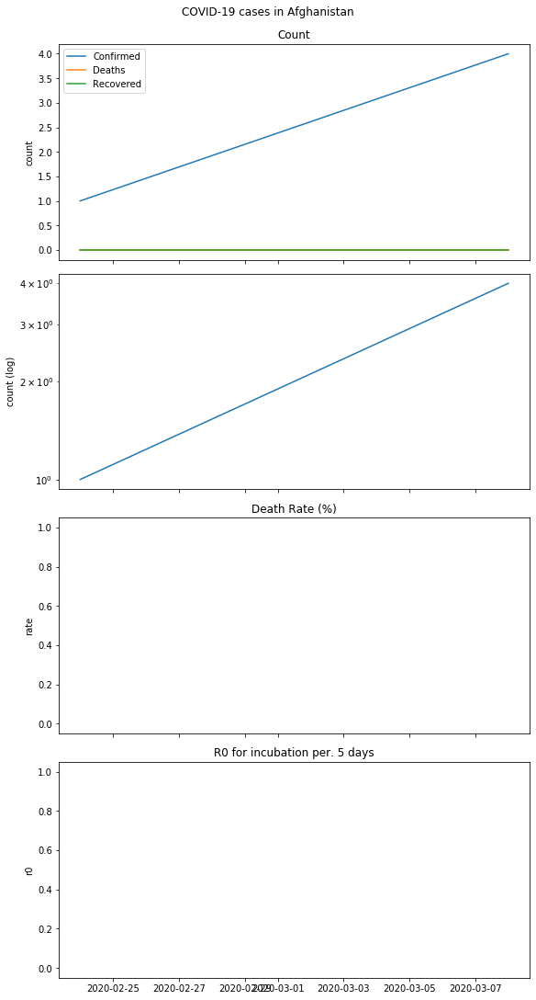

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
410,2020-02-24,Afghanistan,1.0,0.0,0.0,NaN
933,2020-03-08,Afghanistan,4.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-24,NaN
2020-03-08,NaN


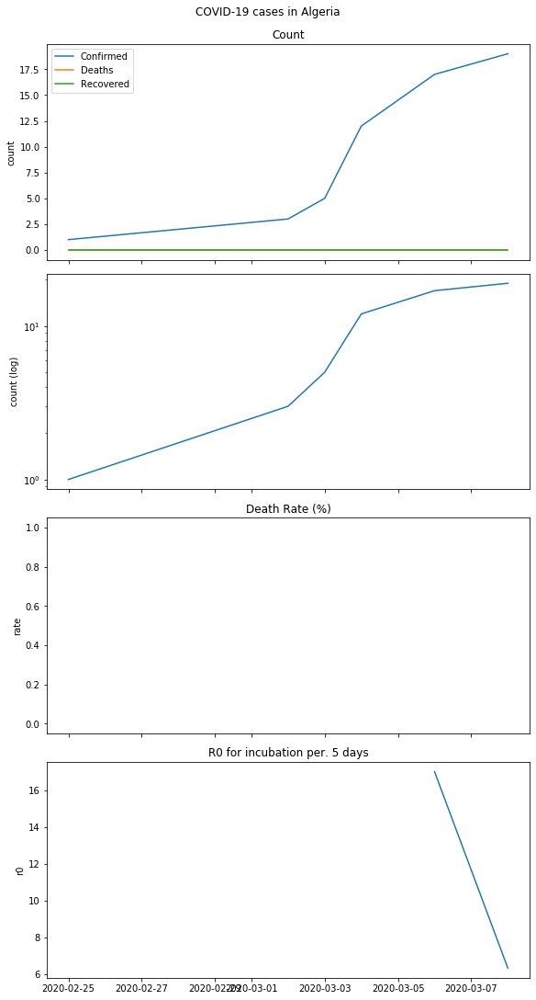

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
426,2020-02-25,Algeria,1.0,0.0,0.0,NaN
627,2020-03-02,Algeria,3.0,0.0,0.0,NaN
668,2020-03-03,Algeria,5.0,0.0,0.0,NaN
717,2020-03-04,Algeria,12.0,0.0,0.0,NaN
819,2020-03-06,Algeria,17.0,0.0,0.0,NaN
934,2020-03-08,Algeria,19.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-25,NaN
2020-03-02,NaN
2020-03-03,NaN
2020-03-04,NaN
2020-03-06,17.000000
2020-03-08,6.333333


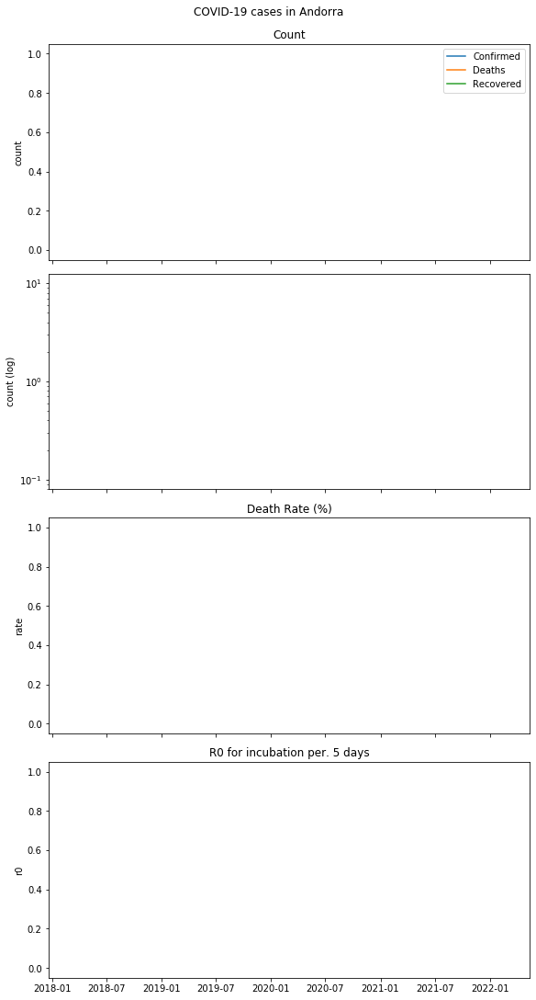

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
628,2020-03-02,Andorra,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-02,NaN


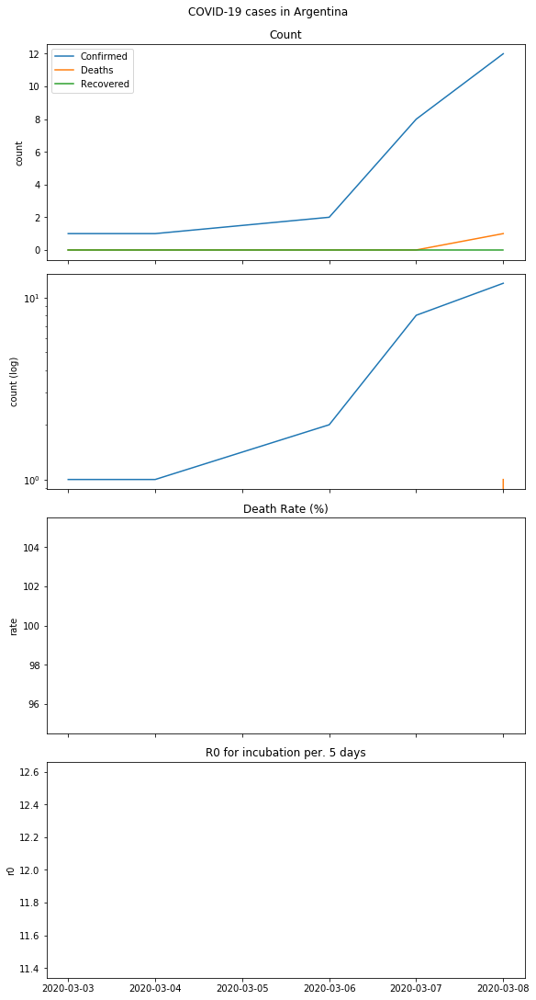

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
669,2020-03-03,Argentina,1.0,0.0,0.0,NaN
718,2020-03-04,Argentina,1.0,0.0,0.0,NaN
820,2020-03-06,Argentina,2.0,0.0,0.0,NaN
885,2020-03-07,Argentina,8.0,0.0,0.0,NaN
935,2020-03-08,Argentina,12.0,1.0,0.0,100.0


,r0
Last Update,
2020-03-03,NaN
2020-03-04,NaN
2020-03-06,NaN
2020-03-07,NaN
2020-03-08,12.0


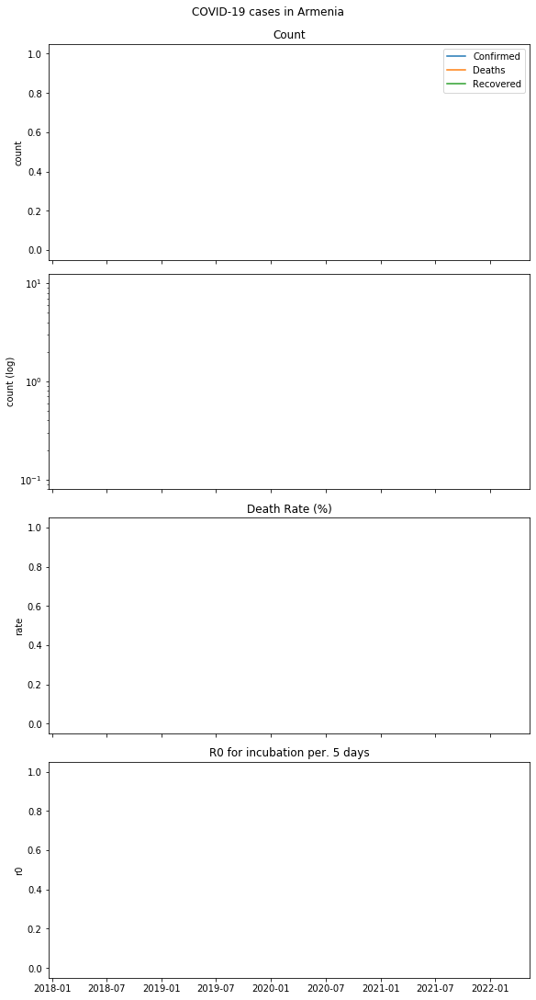

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
583,2020-03-01,Armenia,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-01,NaN


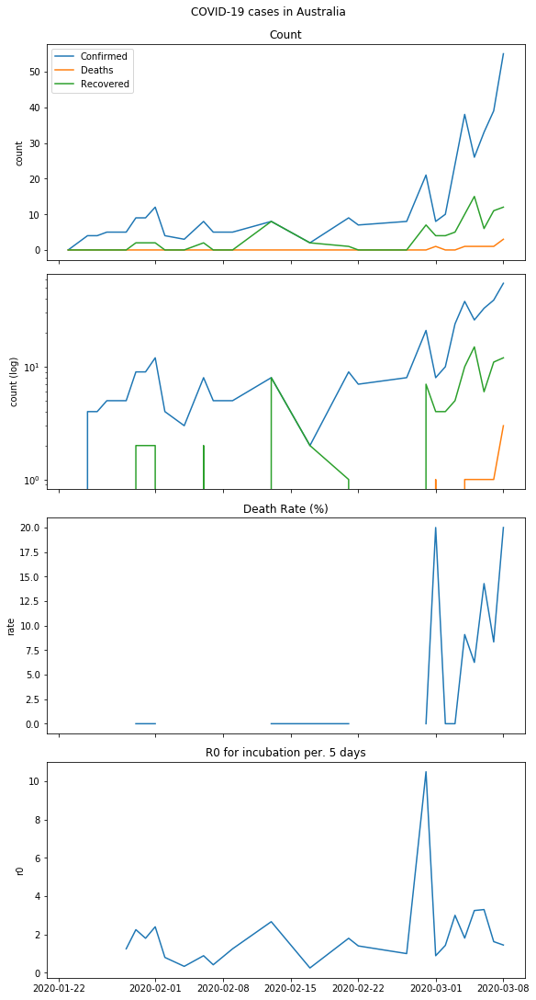

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
8,2020-01-23,Australia,0.0,0.0,0.0,NaN
35,2020-01-25,Australia,4.0,0.0,0.0,NaN
49,2020-01-26,Australia,4.0,0.0,0.0,NaN
64,2020-01-27,Australia,5.0,0.0,0.0,NaN
82,2020-01-28,Australia,5.0,0.0,0.0,NaN
100,2020-01-29,Australia,5.0,0.0,0.0,NaN
120,2020-01-30,Australia,9.0,0.0,2.0,0.000000
142,2020-01-31,Australia,9.0,0.0,2.0,0.000000
168,2020-02-01,Australia,12.0,0.0,2.0,0.000000
183,2020-02-02,Australia,4.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-23,NaN
2020-01-25,NaN
2020-01-26,NaN
2020-01-27,NaN
2020-01-28,inf
2020-01-29,1.250000
2020-01-30,2.250000
2020-01-31,1.800000
2020-02-01,2.400000


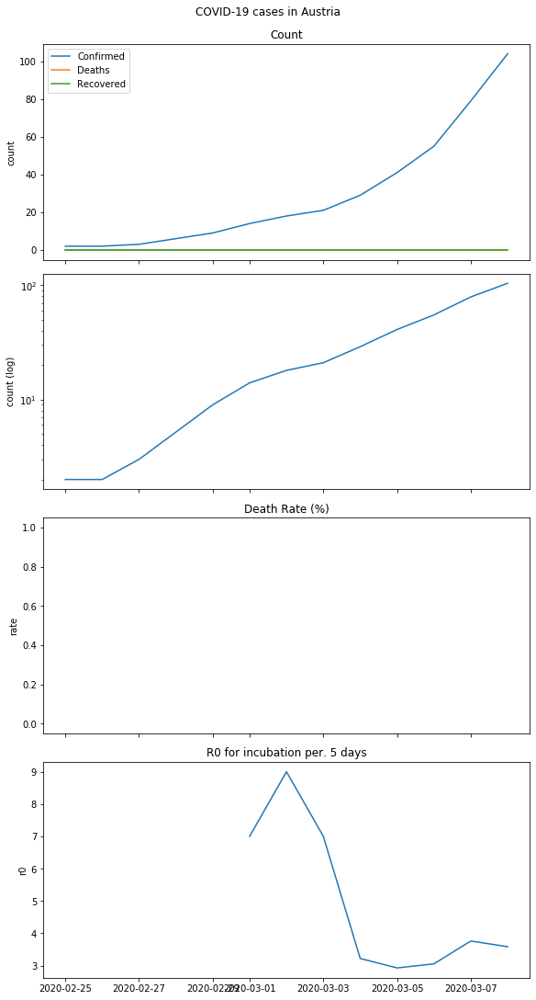

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
427,2020-02-25,Austria,2.0,0.0,0.0,NaN
449,2020-02-26,Austria,2.0,0.0,0.0,NaN
481,2020-02-27,Austria,3.0,0.0,0.0,NaN
544,2020-02-29,Austria,9.0,0.0,0.0,NaN
585,2020-03-01,Austria,14.0,0.0,0.0,NaN
630,2020-03-02,Austria,18.0,0.0,0.0,NaN
671,2020-03-03,Austria,21.0,0.0,0.0,NaN
720,2020-03-04,Austria,29.0,0.0,0.0,NaN
770,2020-03-05,Austria,41.0,0.0,0.0,NaN
822,2020-03-06,Austria,55.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-25,NaN
2020-02-26,NaN
2020-02-27,NaN
2020-02-29,NaN
2020-03-01,7.000000
2020-03-02,9.000000
2020-03-03,7.000000
2020-03-04,3.222222
2020-03-05,2.928571


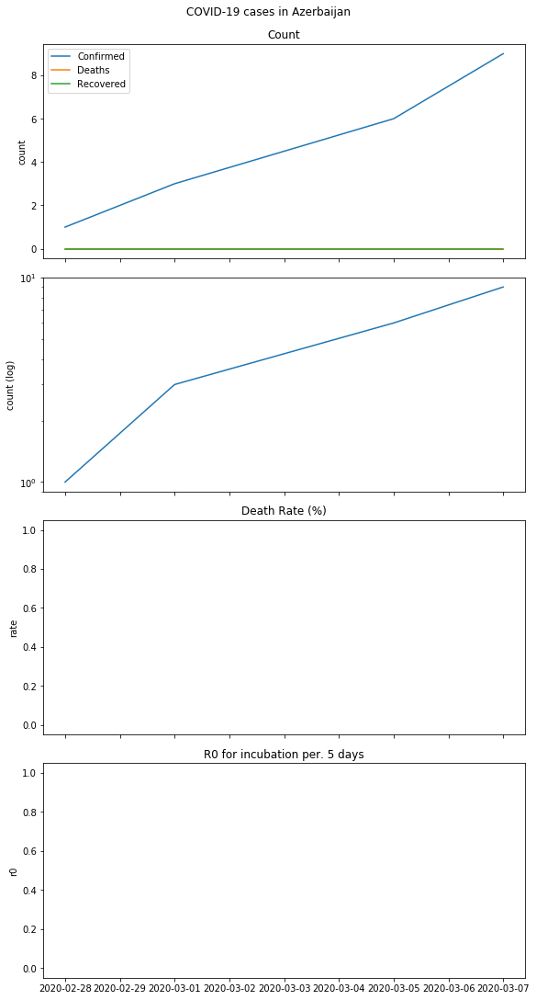

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
510,2020-02-28,Azerbaijan,1.0,0.0,0.0,NaN
586,2020-03-01,Azerbaijan,3.0,0.0,0.0,NaN
771,2020-03-05,Azerbaijan,6.0,0.0,0.0,NaN
888,2020-03-07,Azerbaijan,9.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-28,NaN
2020-03-01,NaN
2020-03-05,NaN
2020-03-07,NaN


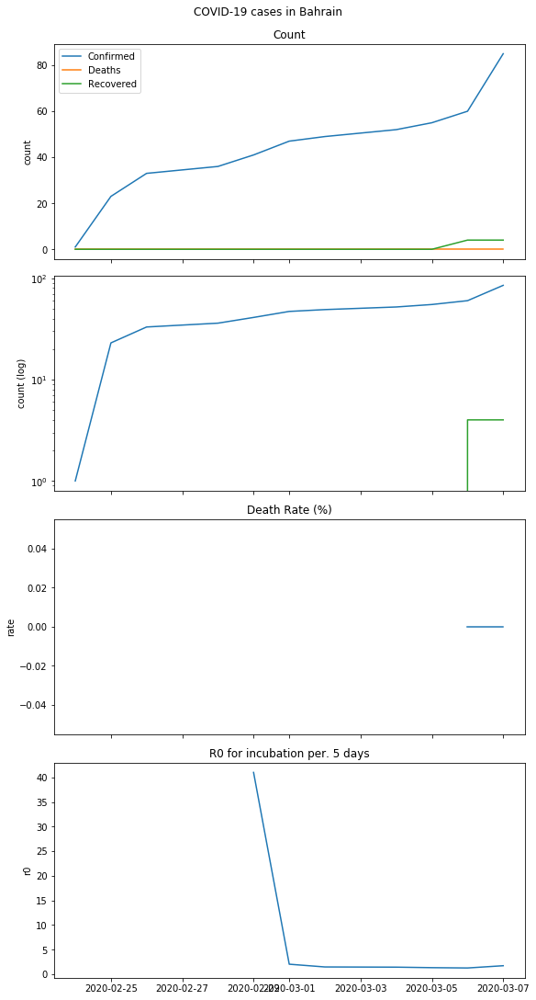

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
411,2020-02-24,Bahrain,1.0,0.0,0.0,NaN
428,2020-02-25,Bahrain,23.0,0.0,0.0,NaN
450,2020-02-26,Bahrain,33.0,0.0,0.0,NaN
511,2020-02-28,Bahrain,36.0,0.0,0.0,NaN
545,2020-02-29,Bahrain,41.0,0.0,0.0,NaN
587,2020-03-01,Bahrain,47.0,0.0,0.0,NaN
631,2020-03-02,Bahrain,49.0,0.0,0.0,NaN
721,2020-03-04,Bahrain,52.0,0.0,0.0,NaN
772,2020-03-05,Bahrain,55.0,0.0,0.0,NaN
823,2020-03-06,Bahrain,60.0,0.0,4.0,0.0


,r0
Last Update,
2020-02-24,NaN
2020-02-25,NaN
2020-02-26,NaN
2020-02-28,NaN
2020-02-29,41.000000
2020-03-01,2.043478
2020-03-02,1.484848
2020-03-04,1.444444
2020-03-05,1.341463


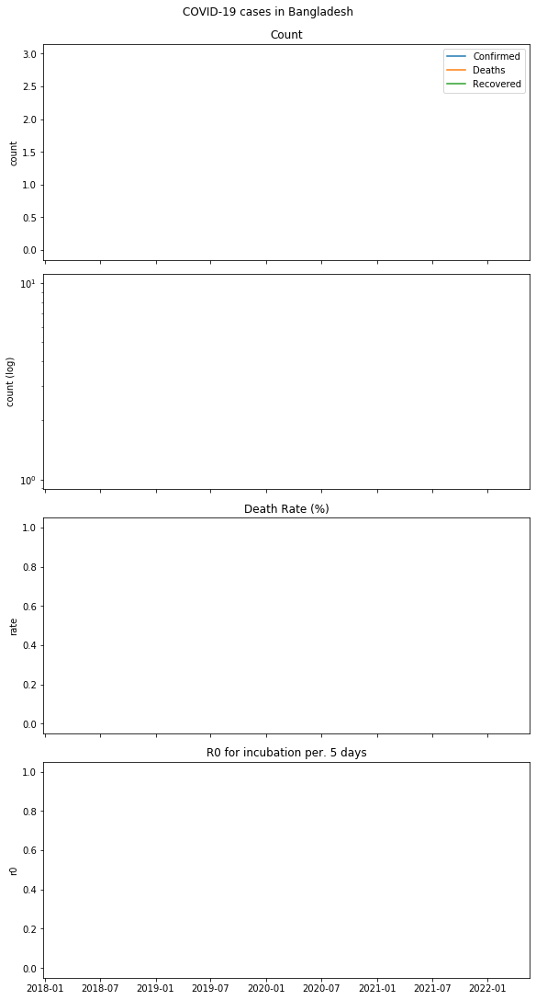

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
938,2020-03-08,Bangladesh,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-08,NaN


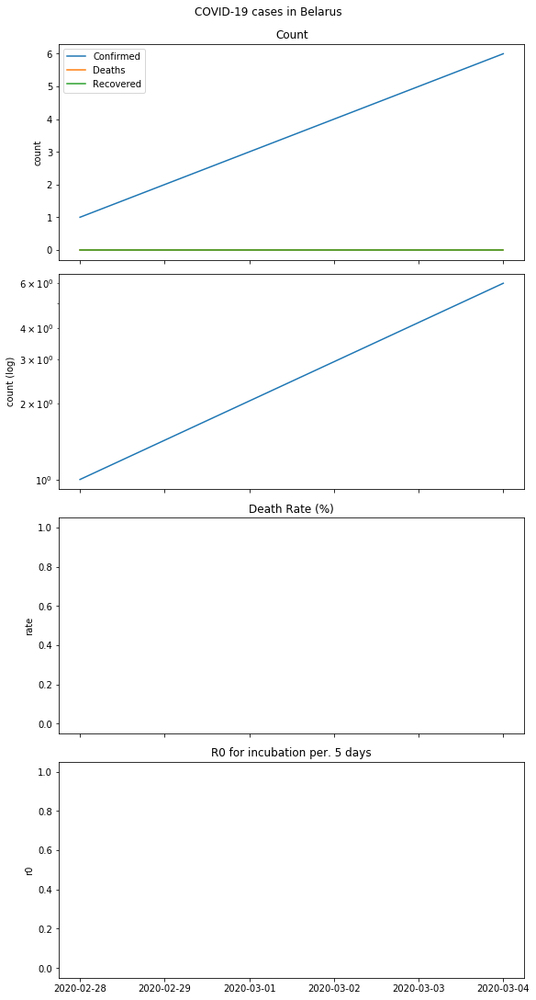

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
512,2020-02-28,Belarus,1.0,0.0,0.0,NaN
722,2020-03-04,Belarus,6.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-28,NaN
2020-03-04,NaN


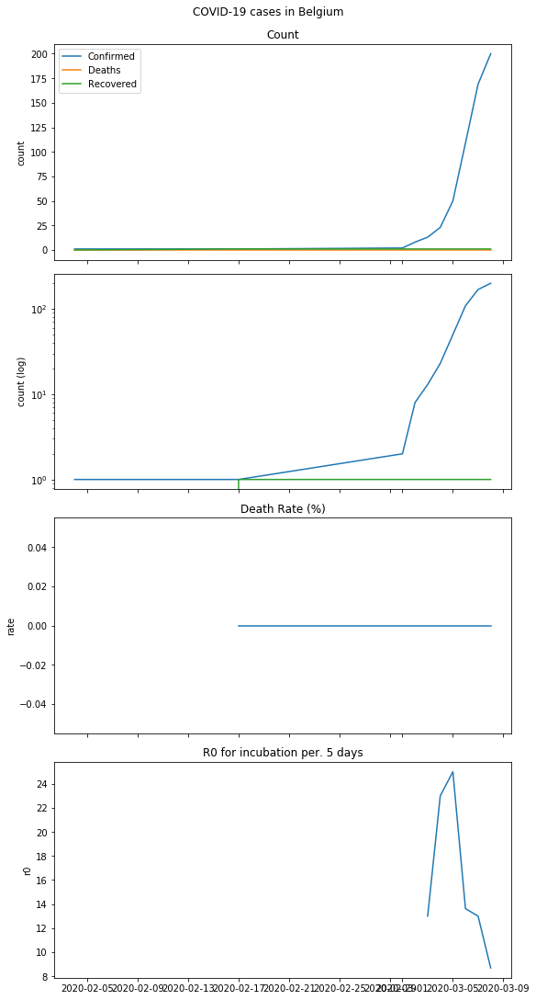

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
199,2020-02-04,Belgium,1.0,0.0,0.0,NaN
337,2020-02-17,Belgium,1.0,0.0,1.0,0.0
588,2020-03-01,Belgium,2.0,0.0,1.0,0.0
632,2020-03-02,Belgium,8.0,0.0,1.0,0.0
672,2020-03-03,Belgium,13.0,0.0,1.0,0.0
723,2020-03-04,Belgium,23.0,0.0,1.0,0.0
773,2020-03-05,Belgium,50.0,0.0,1.0,0.0
824,2020-03-06,Belgium,109.0,0.0,1.0,0.0
890,2020-03-07,Belgium,169.0,0.0,1.0,0.0
939,2020-03-08,Belgium,200.0,0.0,1.0,0.0


,r0
Last Update,
2020-02-04,NaN
2020-02-17,NaN
2020-03-01,NaN
2020-03-02,NaN
2020-03-03,13.000000
2020-03-04,23.000000
2020-03-05,25.000000
2020-03-06,13.625000
2020-03-07,13.000000


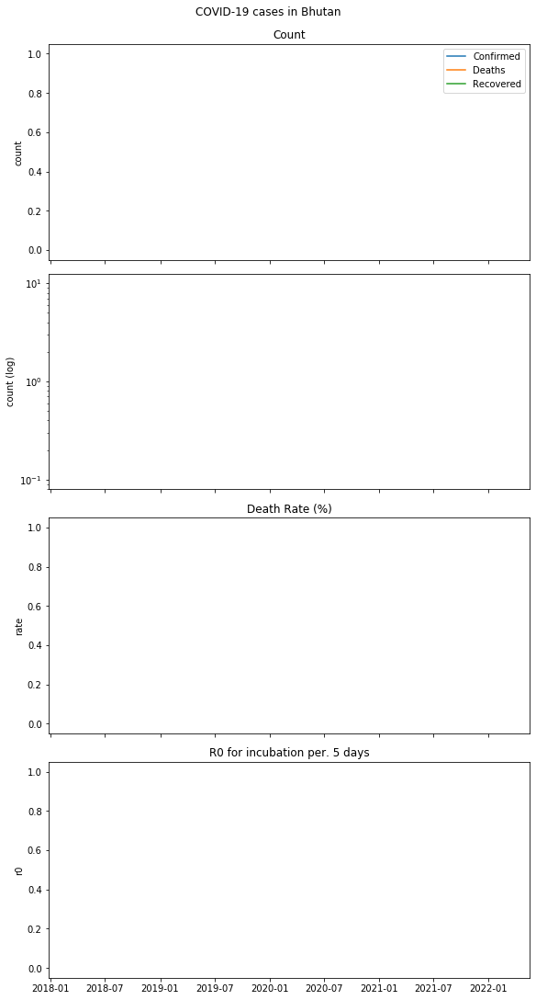

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
825,2020-03-06,Bhutan,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN


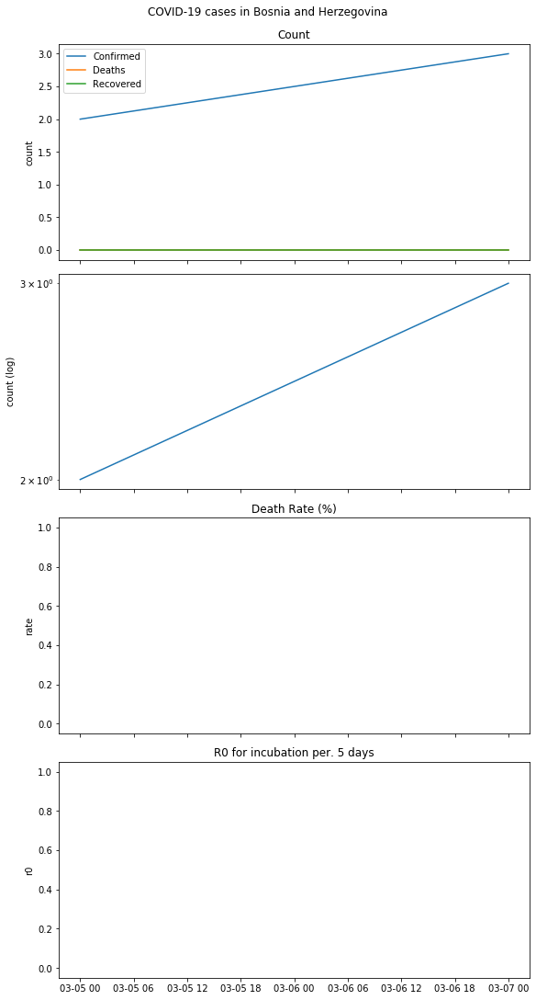

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
774,2020-03-05,Bosnia and Herzegovina,2.0,0.0,0.0,NaN
891,2020-03-07,Bosnia and Herzegovina,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-05,NaN
2020-03-07,NaN


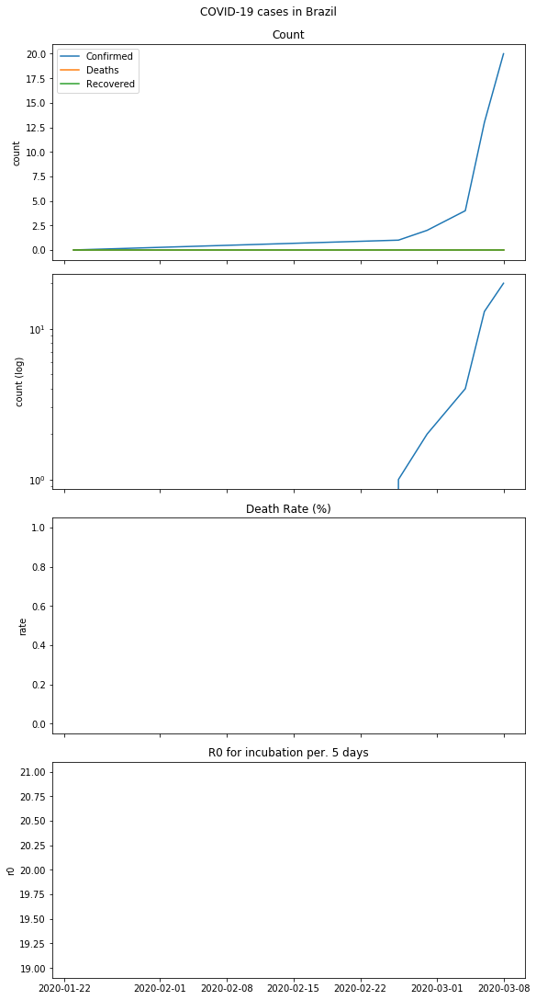

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
9,2020-01-23,Brazil,0.0,0.0,0.0,NaN
451,2020-02-26,Brazil,1.0,0.0,0.0,NaN
546,2020-02-29,Brazil,2.0,0.0,0.0,NaN
724,2020-03-04,Brazil,4.0,0.0,0.0,NaN
826,2020-03-06,Brazil,13.0,0.0,0.0,NaN
940,2020-03-08,Brazil,20.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-23,NaN
2020-02-26,NaN
2020-02-29,NaN
2020-03-04,NaN
2020-03-06,inf
2020-03-08,20.0


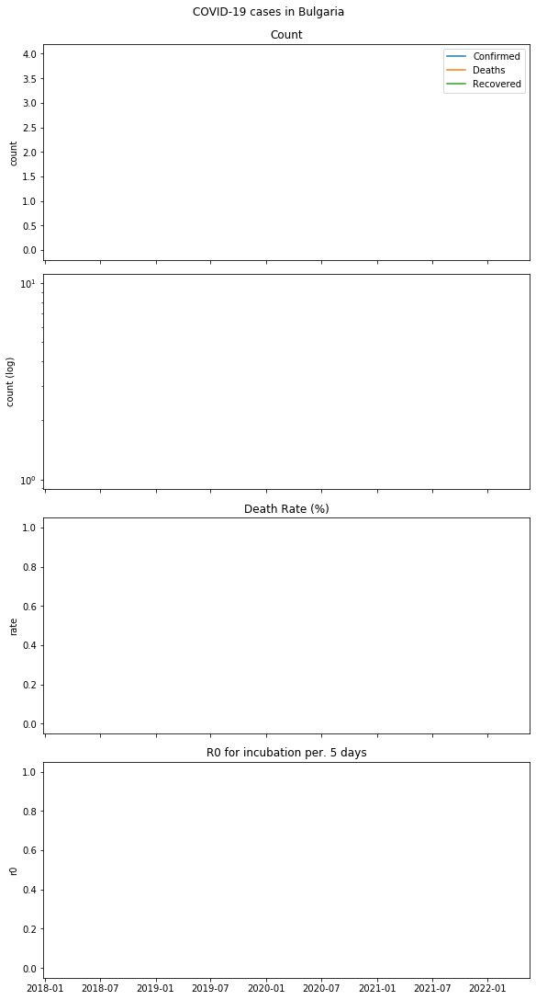

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
941,2020-03-08,Bulgaria,4.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-08,NaN


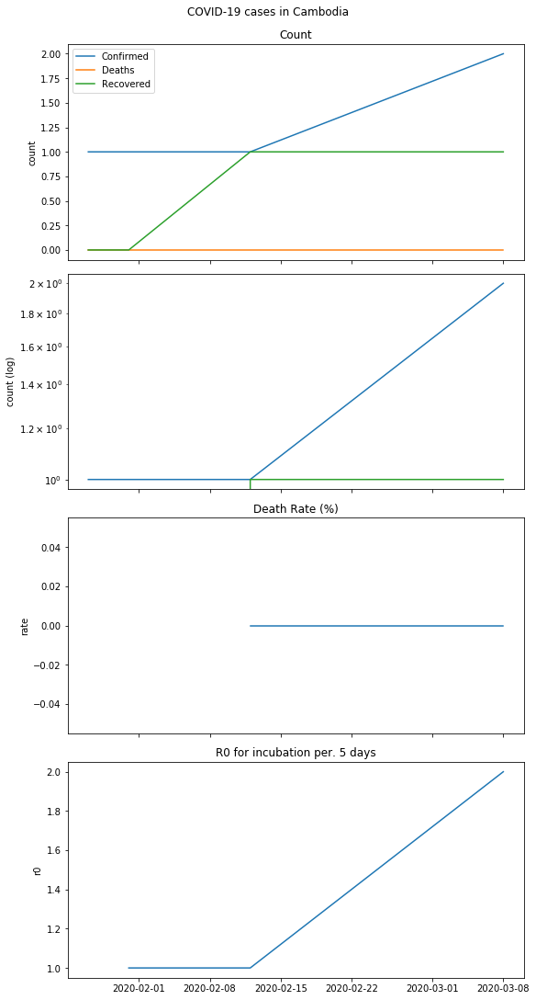

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
65,2020-01-27,Cambodia,1.0,0.0,0.0,NaN
83,2020-01-28,Cambodia,1.0,0.0,0.0,NaN
101,2020-01-29,Cambodia,1.0,0.0,0.0,NaN
121,2020-01-30,Cambodia,1.0,0.0,0.0,NaN
143,2020-01-31,Cambodia,1.0,0.0,0.0,NaN
279,2020-02-12,Cambodia,1.0,0.0,1.0,0.0
942,2020-03-08,Cambodia,2.0,0.0,1.0,0.0


,r0
Last Update,
2020-01-27,NaN
2020-01-28,NaN
2020-01-29,NaN
2020-01-30,NaN
2020-01-31,1.0
2020-02-12,1.0
2020-03-08,2.0


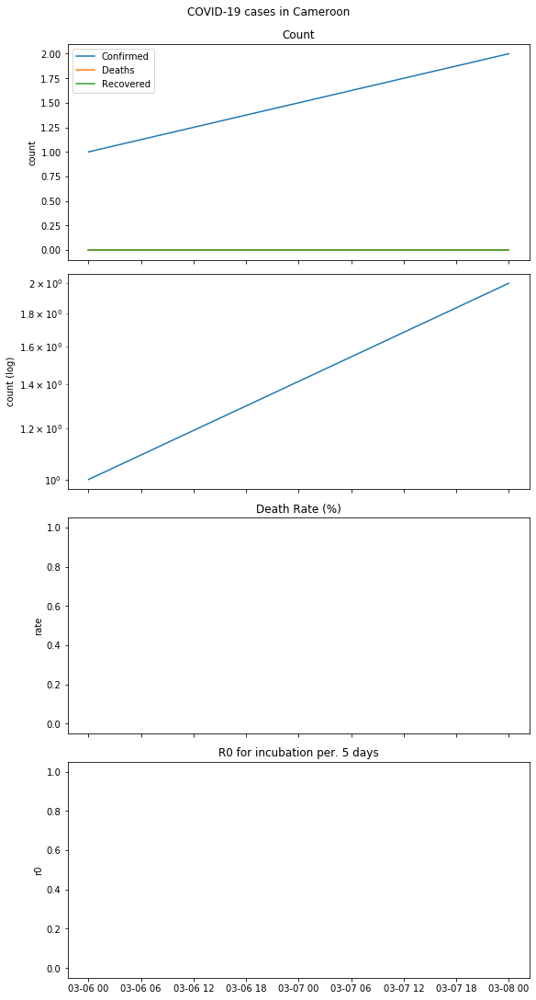

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
827,2020-03-06,Cameroon,1.0,0.0,0.0,NaN
943,2020-03-08,Cameroon,2.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN
2020-03-08,NaN


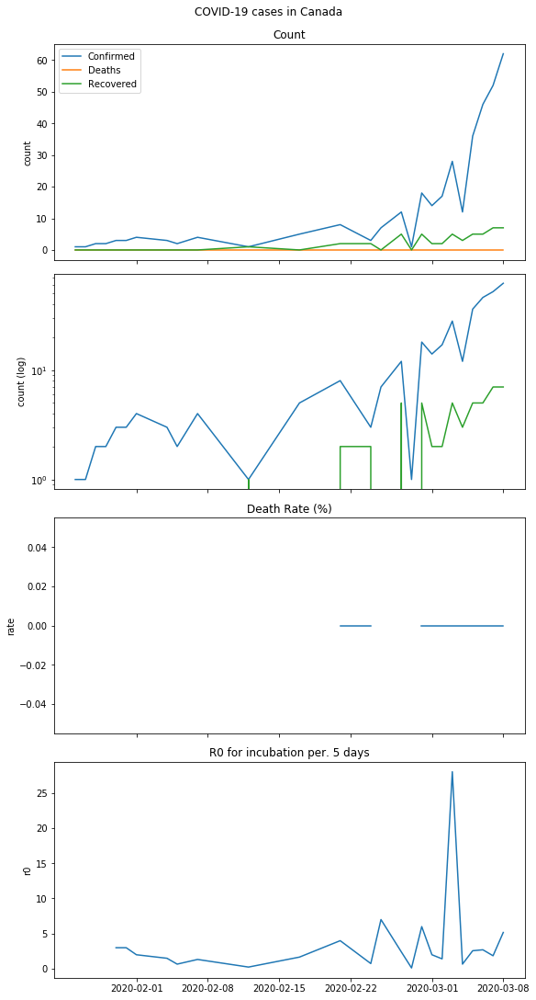

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
50,2020-01-26,Canada,1.0,0.0,0.0,NaN
66,2020-01-27,Canada,1.0,0.0,0.0,NaN
84,2020-01-28,Canada,2.0,0.0,0.0,NaN
102,2020-01-29,Canada,2.0,0.0,0.0,NaN
122,2020-01-30,Canada,3.0,0.0,0.0,NaN
144,2020-01-31,Canada,3.0,0.0,0.0,NaN
169,2020-02-01,Canada,4.0,0.0,0.0,NaN
200,2020-02-04,Canada,3.0,0.0,0.0,NaN
210,2020-02-05,Canada,2.0,0.0,0.0,NaN
226,2020-02-07,Canada,4.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-26,NaN
2020-01-27,NaN
2020-01-28,NaN
2020-01-29,NaN
2020-01-30,3.000000
2020-01-31,3.000000
2020-02-01,2.000000
2020-02-04,1.500000
2020-02-05,0.666667


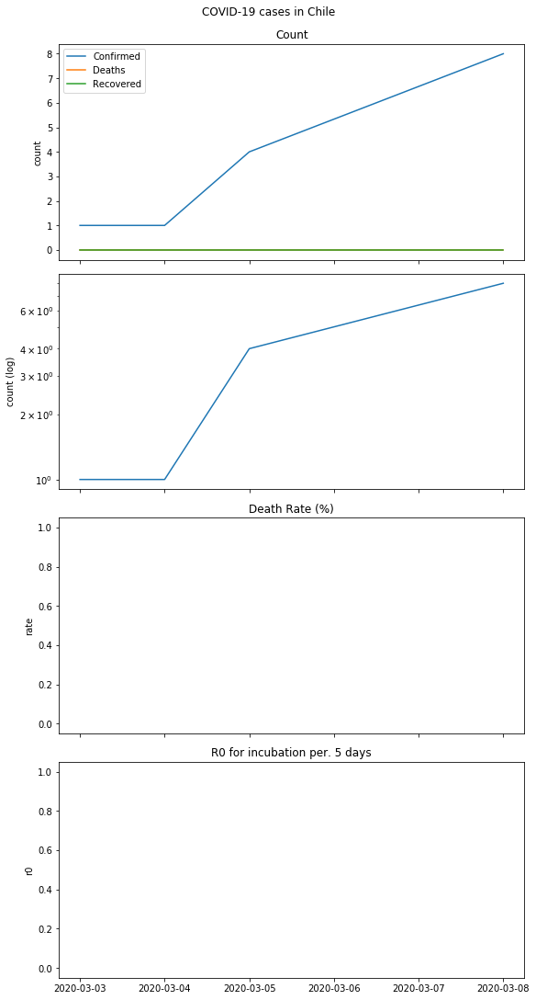

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
674,2020-03-03,Chile,1.0,0.0,0.0,NaN
726,2020-03-04,Chile,1.0,0.0,0.0,NaN
776,2020-03-05,Chile,4.0,0.0,0.0,NaN
945,2020-03-08,Chile,8.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-03,NaN
2020-03-04,NaN
2020-03-05,NaN
2020-03-08,NaN


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


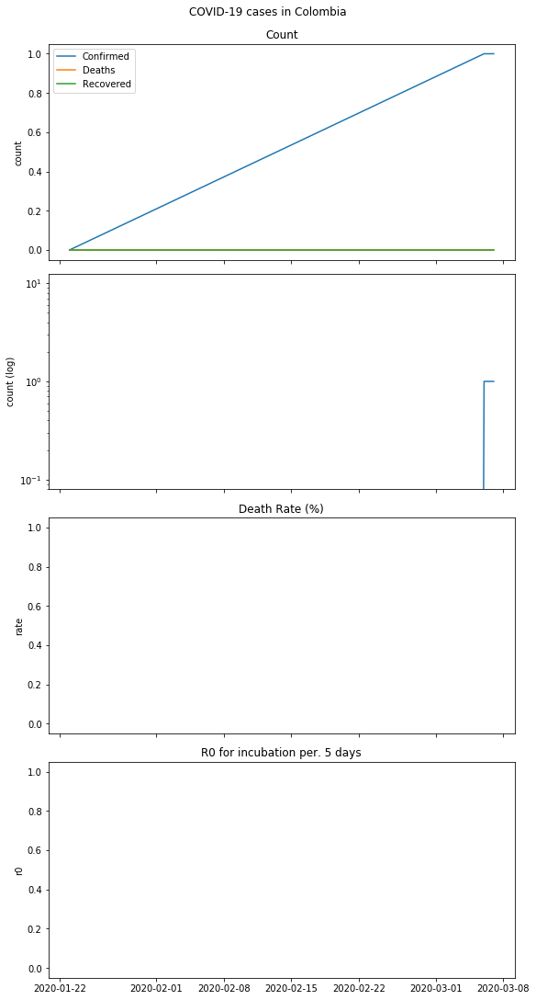

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
10,2020-01-23,Colombia,0.0,0.0,0.0,NaN
829,2020-03-06,Colombia,1.0,0.0,0.0,NaN
893,2020-03-07,Colombia,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-23,NaN
2020-03-06,NaN
2020-03-07,NaN


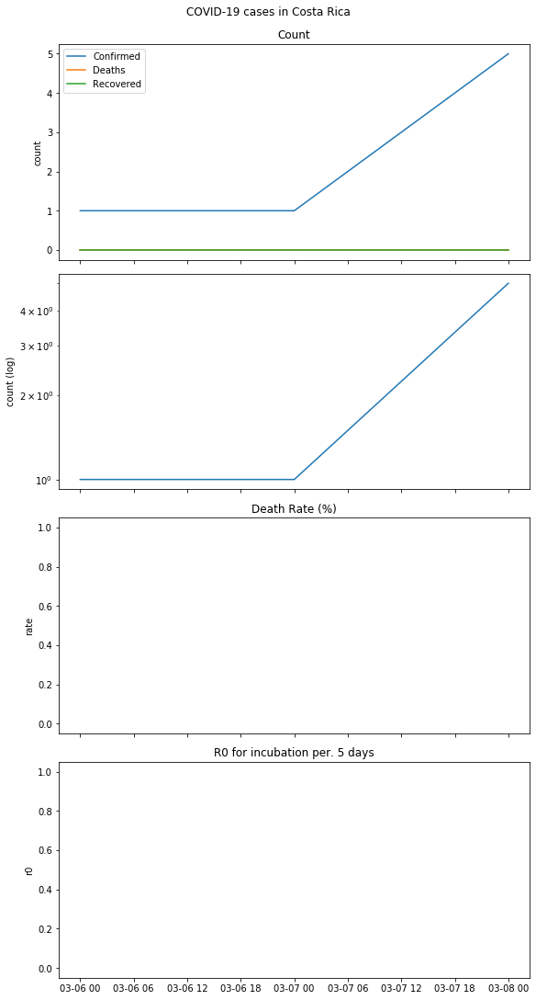

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
830,2020-03-06,Costa Rica,1.0,0.0,0.0,NaN
894,2020-03-07,Costa Rica,1.0,0.0,0.0,NaN
946,2020-03-08,Costa Rica,5.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN
2020-03-07,NaN
2020-03-08,NaN


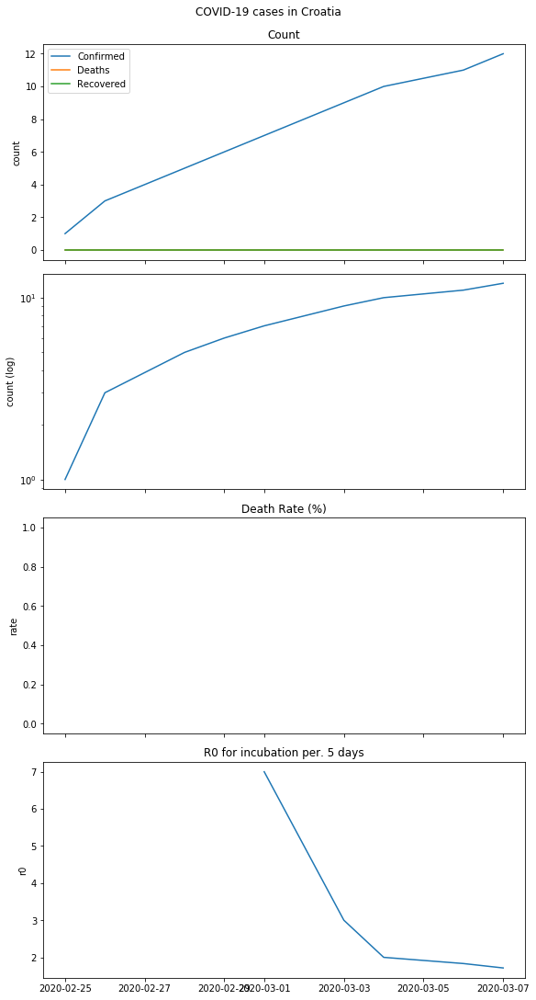

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
430,2020-02-25,Croatia,1.0,0.0,0.0,NaN
452,2020-02-26,Croatia,3.0,0.0,0.0,NaN
514,2020-02-28,Croatia,5.0,0.0,0.0,NaN
548,2020-02-29,Croatia,6.0,0.0,0.0,NaN
590,2020-03-01,Croatia,7.0,0.0,0.0,NaN
675,2020-03-03,Croatia,9.0,0.0,0.0,NaN
727,2020-03-04,Croatia,10.0,0.0,0.0,NaN
831,2020-03-06,Croatia,11.0,0.0,0.0,NaN
895,2020-03-07,Croatia,12.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-25,NaN
2020-02-26,NaN
2020-02-28,NaN
2020-02-29,NaN
2020-03-01,7.000000
2020-03-03,3.000000
2020-03-04,2.000000
2020-03-06,1.833333
2020-03-07,1.714286


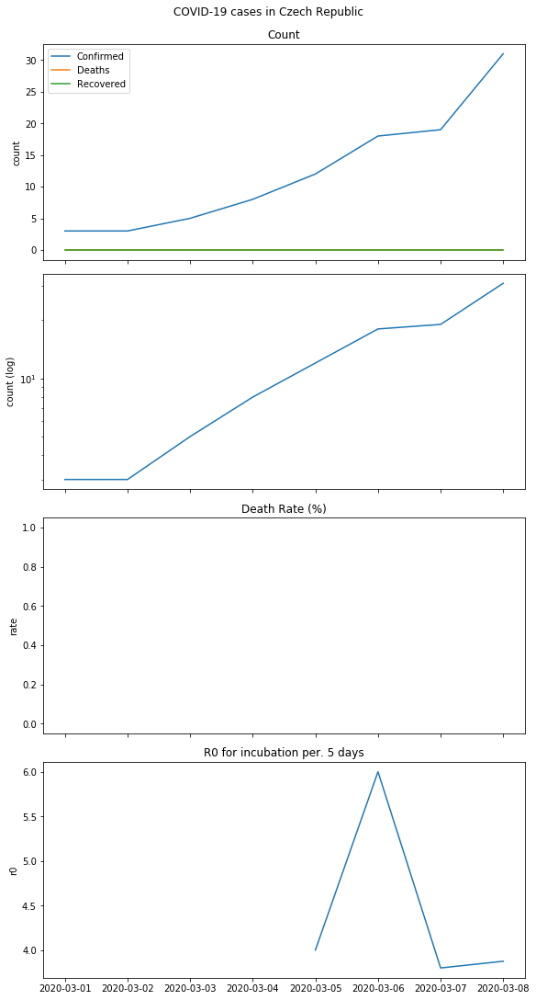

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
591,2020-03-01,Czech Republic,3.0,0.0,0.0,NaN
634,2020-03-02,Czech Republic,3.0,0.0,0.0,NaN
676,2020-03-03,Czech Republic,5.0,0.0,0.0,NaN
728,2020-03-04,Czech Republic,8.0,0.0,0.0,NaN
777,2020-03-05,Czech Republic,12.0,0.0,0.0,NaN
832,2020-03-06,Czech Republic,18.0,0.0,0.0,NaN
896,2020-03-07,Czech Republic,19.0,0.0,0.0,NaN
947,2020-03-08,Czech Republic,31.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-01,NaN
2020-03-02,NaN
2020-03-03,NaN
2020-03-04,NaN
2020-03-05,4.000
2020-03-06,6.000
2020-03-07,3.800
2020-03-08,3.875


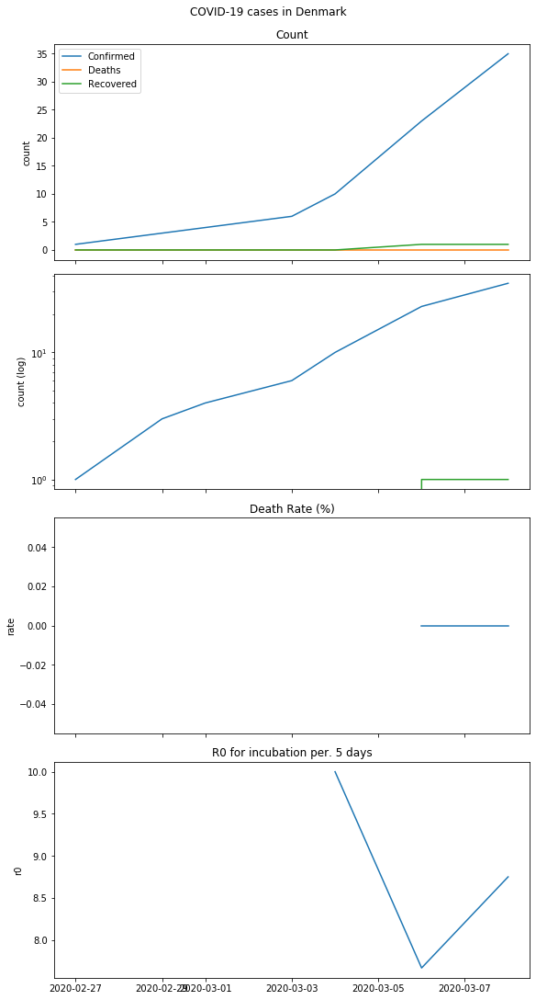

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
483,2020-02-27,Denmark,1.0,0.0,0.0,NaN
549,2020-02-29,Denmark,3.0,0.0,0.0,NaN
592,2020-03-01,Denmark,4.0,0.0,0.0,NaN
677,2020-03-03,Denmark,6.0,0.0,0.0,NaN
729,2020-03-04,Denmark,10.0,0.0,0.0,NaN
833,2020-03-06,Denmark,23.0,0.0,1.0,0.0
948,2020-03-08,Denmark,35.0,0.0,1.0,0.0


,r0
Last Update,
2020-02-27,NaN
2020-02-29,NaN
2020-03-01,NaN
2020-03-03,NaN
2020-03-04,10.000000
2020-03-06,7.666667
2020-03-08,8.750000


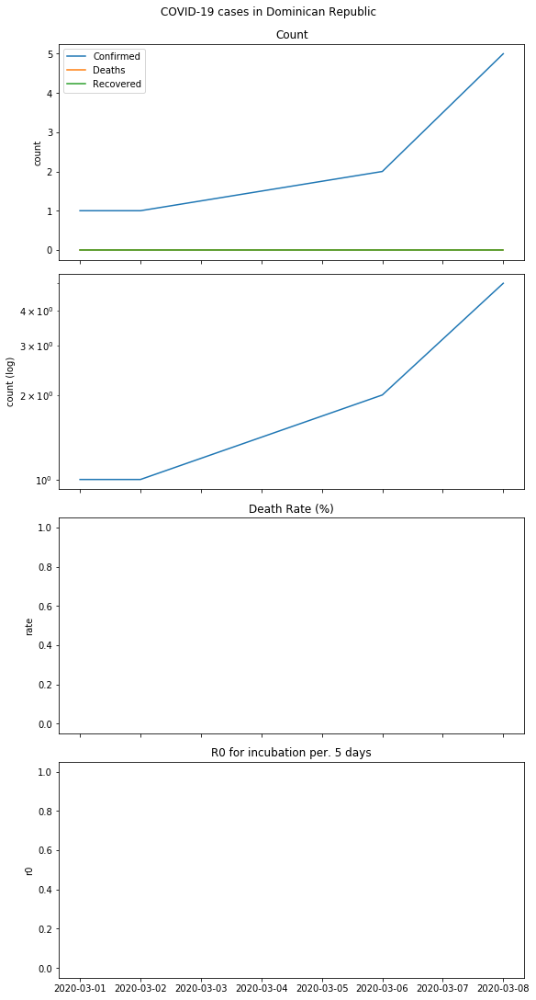

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
593,2020-03-01,Dominican Republic,1.0,0.0,0.0,NaN
635,2020-03-02,Dominican Republic,1.0,0.0,0.0,NaN
834,2020-03-06,Dominican Republic,2.0,0.0,0.0,NaN
949,2020-03-08,Dominican Republic,5.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-01,NaN
2020-03-02,NaN
2020-03-06,NaN
2020-03-08,NaN


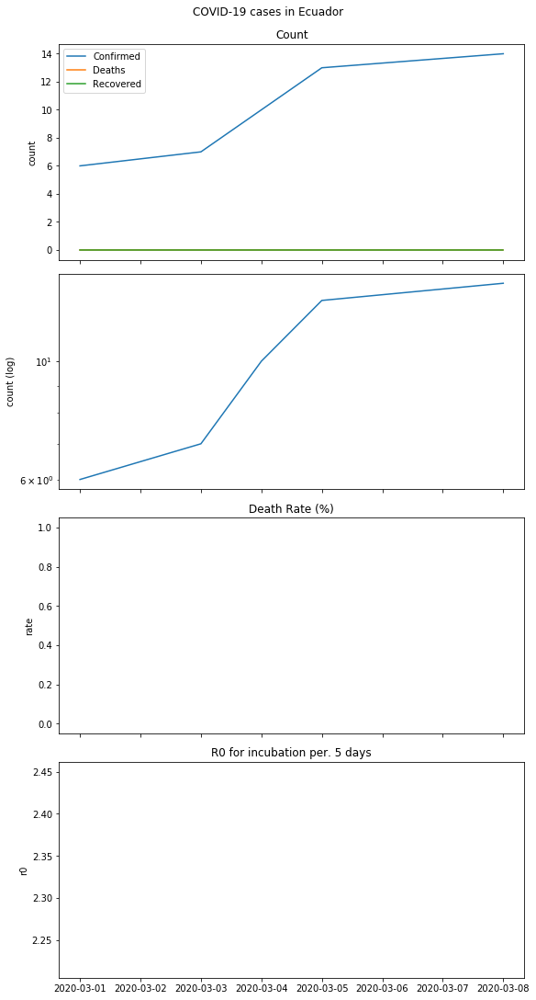

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
594,2020-03-01,Ecuador,6.0,0.0,0.0,NaN
678,2020-03-03,Ecuador,7.0,0.0,0.0,NaN
730,2020-03-04,Ecuador,10.0,0.0,0.0,NaN
778,2020-03-05,Ecuador,13.0,0.0,0.0,NaN
950,2020-03-08,Ecuador,14.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-01,NaN
2020-03-03,NaN
2020-03-04,NaN
2020-03-05,NaN
2020-03-08,2.333333


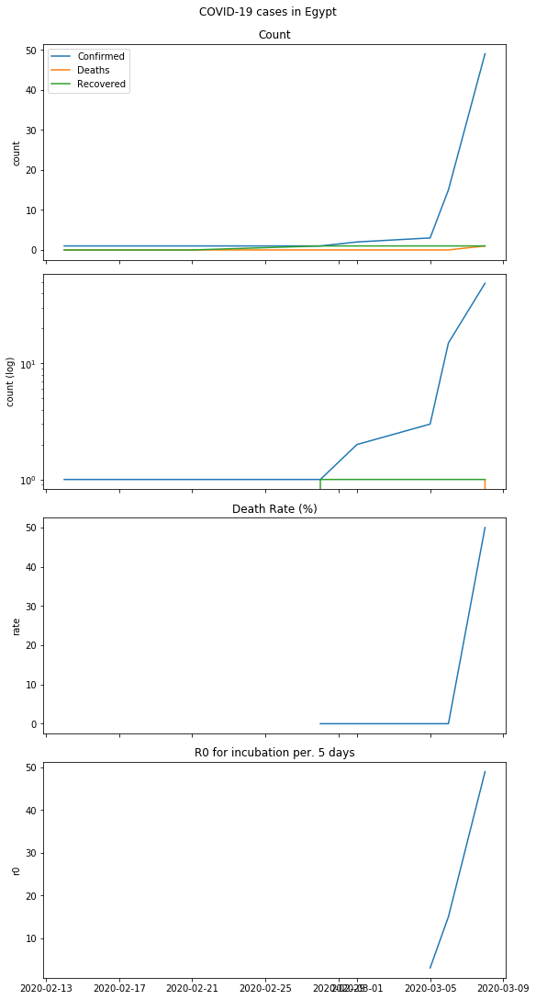

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
307,2020-02-14,Egypt,1.0,0.0,0.0,NaN
373,2020-02-21,Egypt,1.0,0.0,0.0,NaN
515,2020-02-28,Egypt,1.0,0.0,1.0,0.0
595,2020-03-01,Egypt,2.0,0.0,1.0,0.0
779,2020-03-05,Egypt,3.0,0.0,1.0,0.0
835,2020-03-06,Egypt,15.0,0.0,1.0,0.0
951,2020-03-08,Egypt,49.0,1.0,1.0,50.0


,r0
Last Update,
2020-02-14,NaN
2020-02-21,NaN
2020-02-28,NaN
2020-03-01,NaN
2020-03-05,3.0
2020-03-06,15.0
2020-03-08,49.0


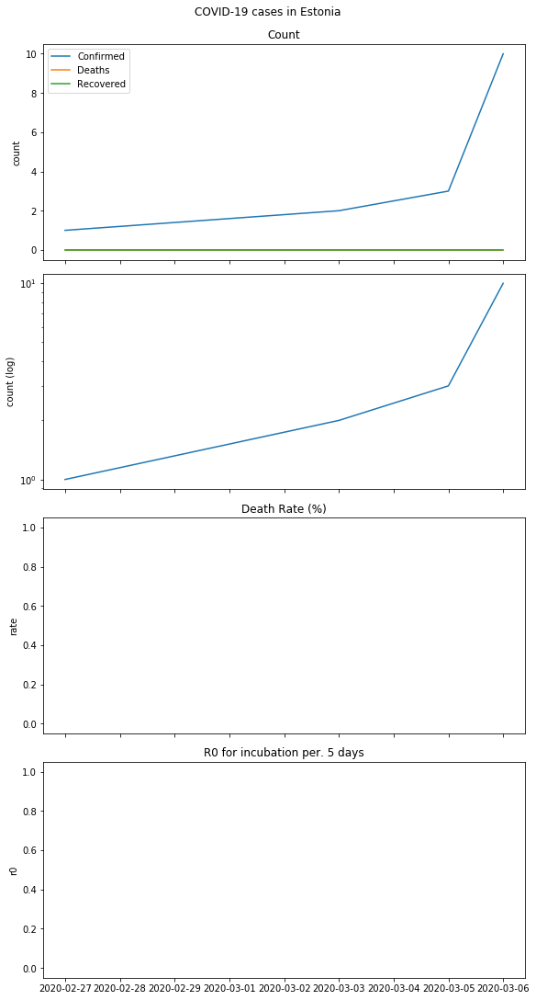

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
484,2020-02-27,Estonia,1.0,0.0,0.0,NaN
679,2020-03-03,Estonia,2.0,0.0,0.0,NaN
780,2020-03-05,Estonia,3.0,0.0,0.0,NaN
836,2020-03-06,Estonia,10.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-27,NaN
2020-03-03,NaN
2020-03-05,NaN
2020-03-06,NaN


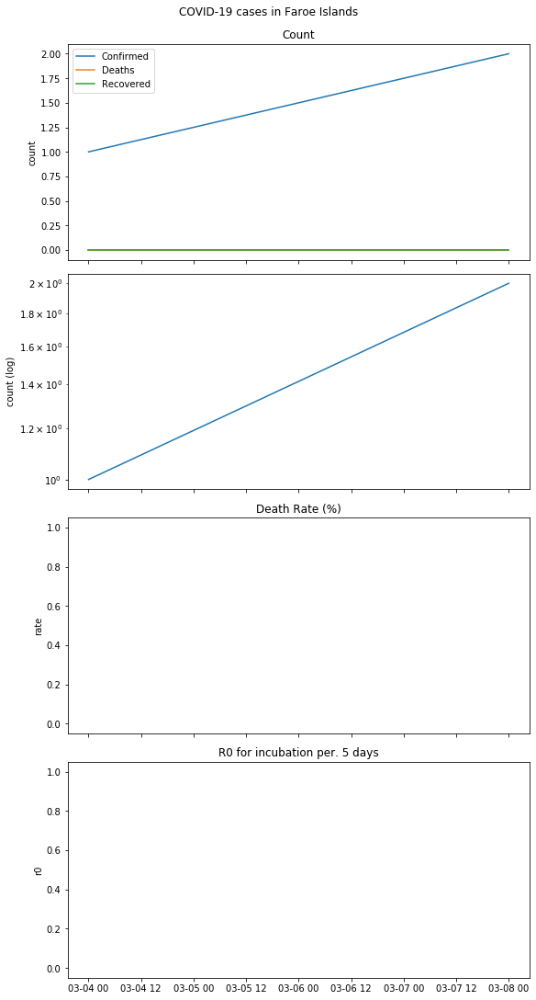

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
731,2020-03-04,Faroe Islands,1.0,0.0,0.0,NaN
952,2020-03-08,Faroe Islands,2.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-04,NaN
2020-03-08,NaN


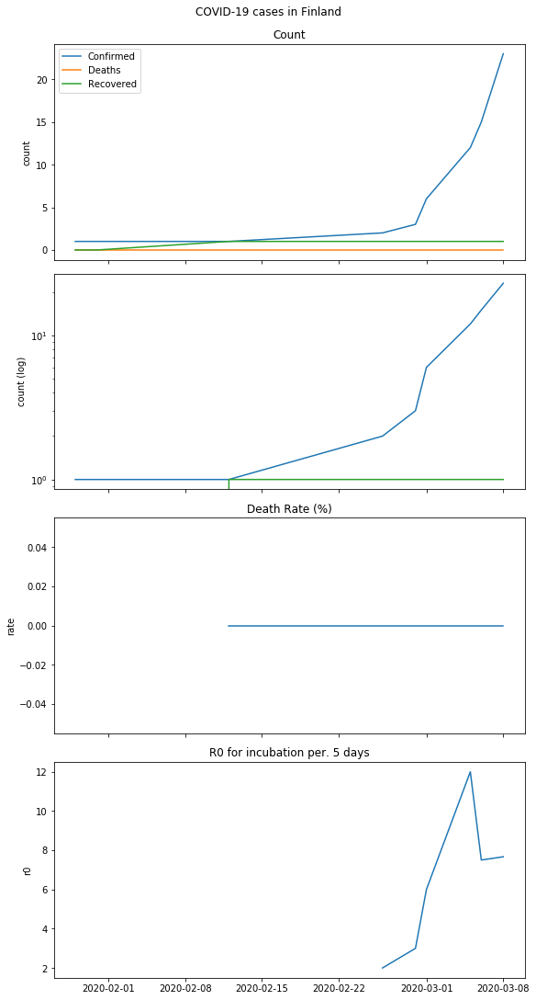

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
103,2020-01-29,Finland,1.0,0.0,0.0,NaN
123,2020-01-30,Finland,1.0,0.0,0.0,NaN
145,2020-01-31,Finland,1.0,0.0,0.0,NaN
281,2020-02-12,Finland,1.0,0.0,1.0,0.0
453,2020-02-26,Finland,2.0,0.0,1.0,0.0
550,2020-02-29,Finland,3.0,0.0,1.0,0.0
596,2020-03-01,Finland,6.0,0.0,1.0,0.0
781,2020-03-05,Finland,12.0,0.0,1.0,0.0
837,2020-03-06,Finland,15.0,0.0,1.0,0.0
953,2020-03-08,Finland,23.0,0.0,1.0,0.0


,r0
Last Update,
2020-01-29,NaN
2020-01-30,NaN
2020-01-31,NaN
2020-02-12,NaN
2020-02-26,2.000000
2020-02-29,3.000000
2020-03-01,6.000000
2020-03-05,12.000000
2020-03-06,7.500000


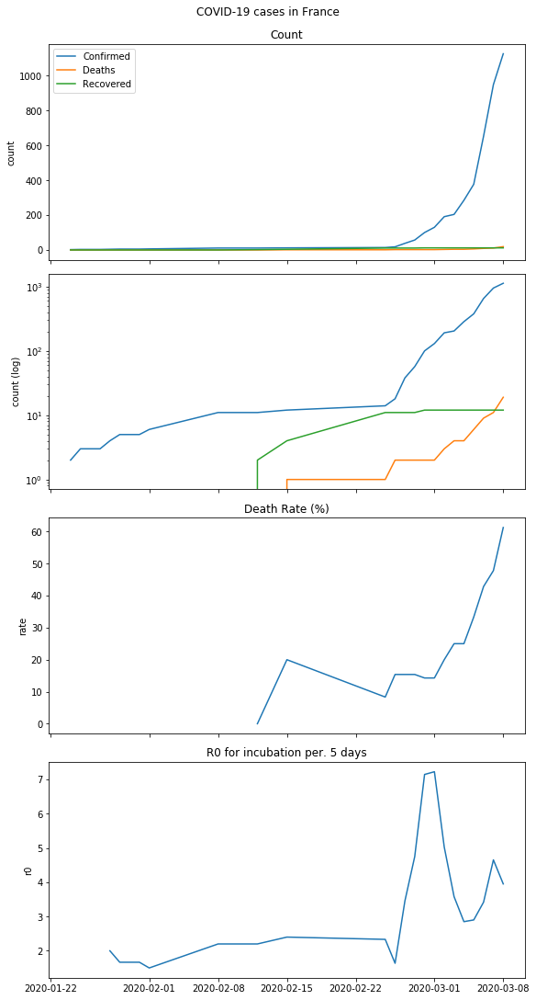

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
24,2020-01-24,France,2.0,0.0,0.0,NaN
36,2020-01-25,France,3.0,0.0,0.0,NaN
51,2020-01-26,France,3.0,0.0,0.0,NaN
67,2020-01-27,France,3.0,0.0,0.0,NaN
85,2020-01-28,France,4.0,0.0,0.0,NaN
104,2020-01-29,France,5.0,0.0,0.0,NaN
124,2020-01-30,France,5.0,0.0,0.0,NaN
146,2020-01-31,France,5.0,0.0,0.0,NaN
170,2020-02-01,France,6.0,0.0,0.0,NaN
238,2020-02-08,France,11.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,NaN
2020-01-27,NaN
2020-01-28,2.000000
2020-01-29,1.666667
2020-01-30,1.666667
2020-01-31,1.666667
2020-02-01,1.500000


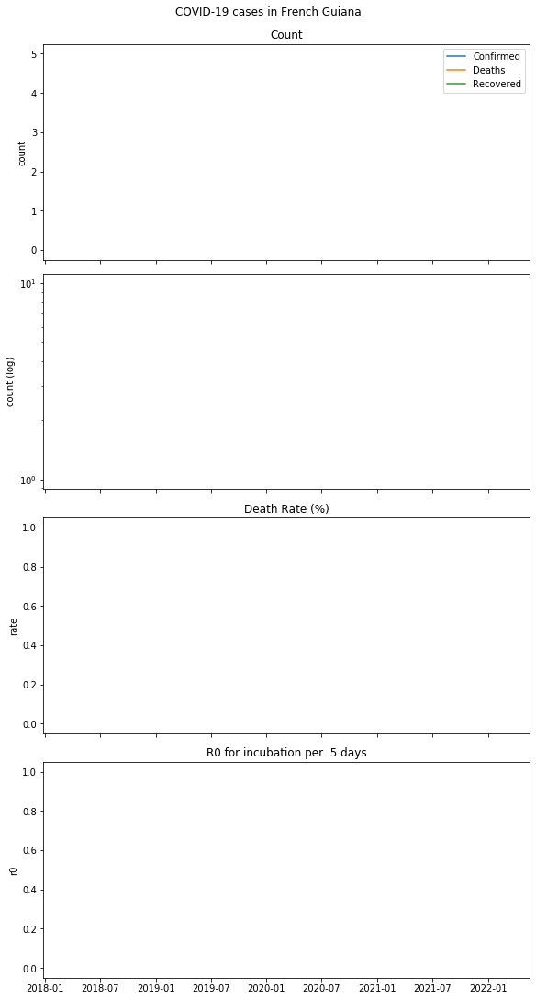

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
898,2020-03-07,French Guiana,5.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-07,NaN


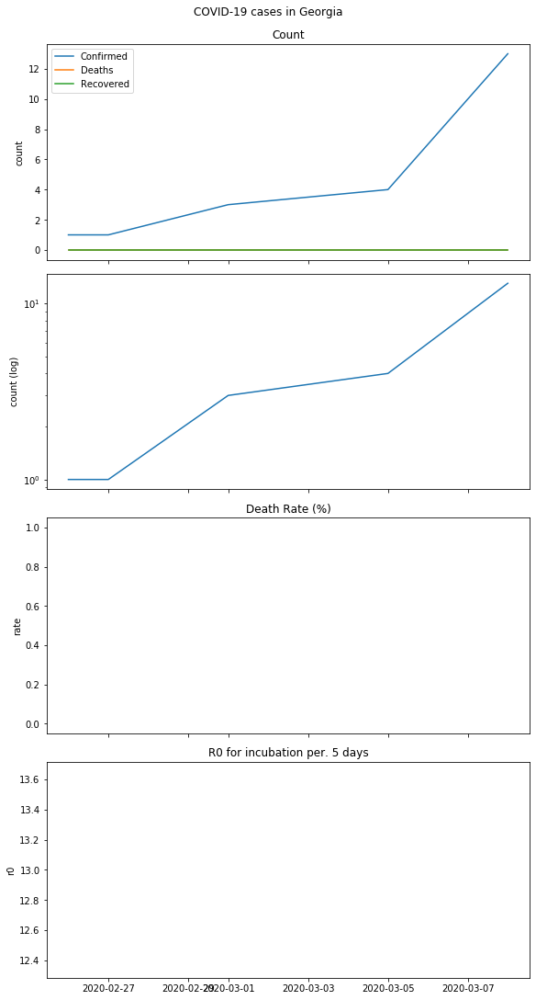

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
455,2020-02-26,Georgia,1.0,0.0,0.0,NaN
486,2020-02-27,Georgia,1.0,0.0,0.0,NaN
598,2020-03-01,Georgia,3.0,0.0,0.0,NaN
783,2020-03-05,Georgia,4.0,0.0,0.0,NaN
955,2020-03-08,Georgia,13.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-26,NaN
2020-02-27,NaN
2020-03-01,NaN
2020-03-05,NaN
2020-03-08,13.0


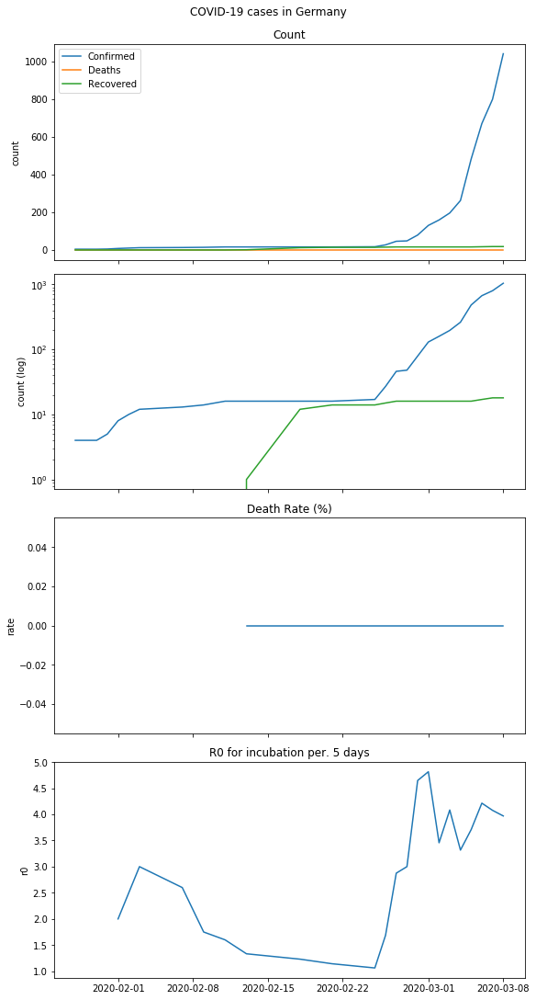

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
86,2020-01-28,Germany,4.0,0.0,0.0,NaN
105,2020-01-29,Germany,4.0,0.0,0.0,NaN
125,2020-01-30,Germany,4.0,0.0,0.0,NaN
147,2020-01-31,Germany,5.0,0.0,0.0,NaN
171,2020-02-01,Germany,8.0,0.0,0.0,NaN
184,2020-02-02,Germany,10.0,0.0,0.0,NaN
193,2020-02-03,Germany,12.0,0.0,0.0,NaN
227,2020-02-07,Germany,13.0,0.0,0.0,NaN
249,2020-02-09,Germany,14.0,0.0,0.0,NaN
269,2020-02-11,Germany,16.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-28,NaN
2020-01-29,NaN
2020-01-30,NaN
2020-01-31,NaN
2020-02-01,2.000000
2020-02-02,2.500000
2020-02-03,3.000000
2020-02-07,2.600000
2020-02-09,1.750000


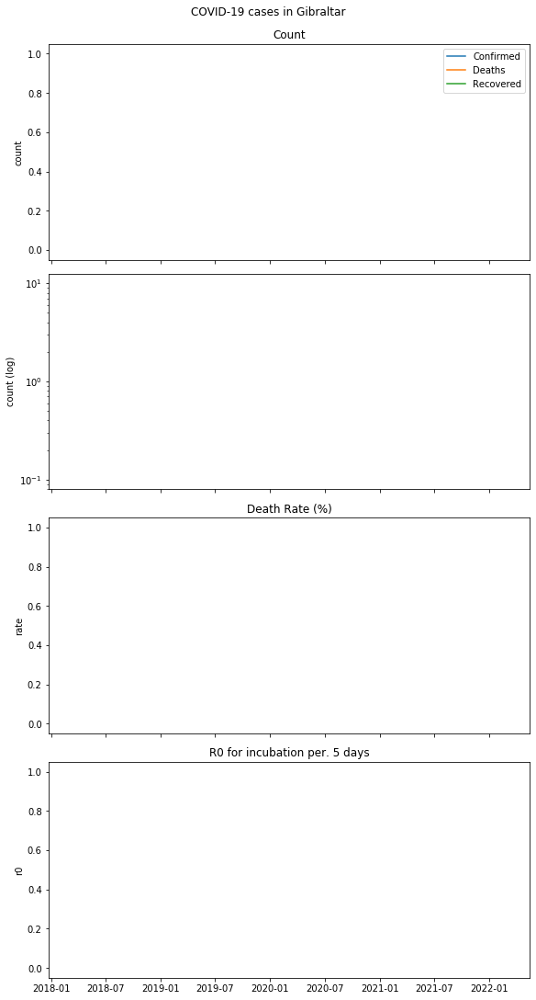

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
734,2020-03-04,Gibraltar,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-04,NaN


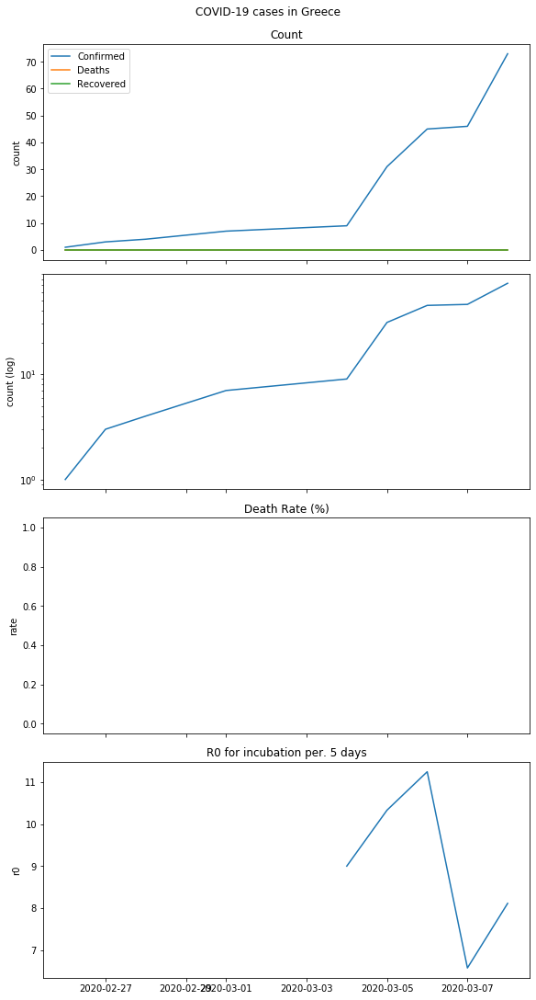

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
457,2020-02-26,Greece,1.0,0.0,0.0,NaN
488,2020-02-27,Greece,3.0,0.0,0.0,NaN
518,2020-02-28,Greece,4.0,0.0,0.0,NaN
600,2020-03-01,Greece,7.0,0.0,0.0,NaN
735,2020-03-04,Greece,9.0,0.0,0.0,NaN
785,2020-03-05,Greece,31.0,0.0,0.0,NaN
840,2020-03-06,Greece,45.0,0.0,0.0,NaN
900,2020-03-07,Greece,46.0,0.0,0.0,NaN
957,2020-03-08,Greece,73.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-26,NaN
2020-02-27,NaN
2020-02-28,NaN
2020-03-01,NaN
2020-03-04,9.000000
2020-03-05,10.333333
2020-03-06,11.250000
2020-03-07,6.571429
2020-03-08,8.111111


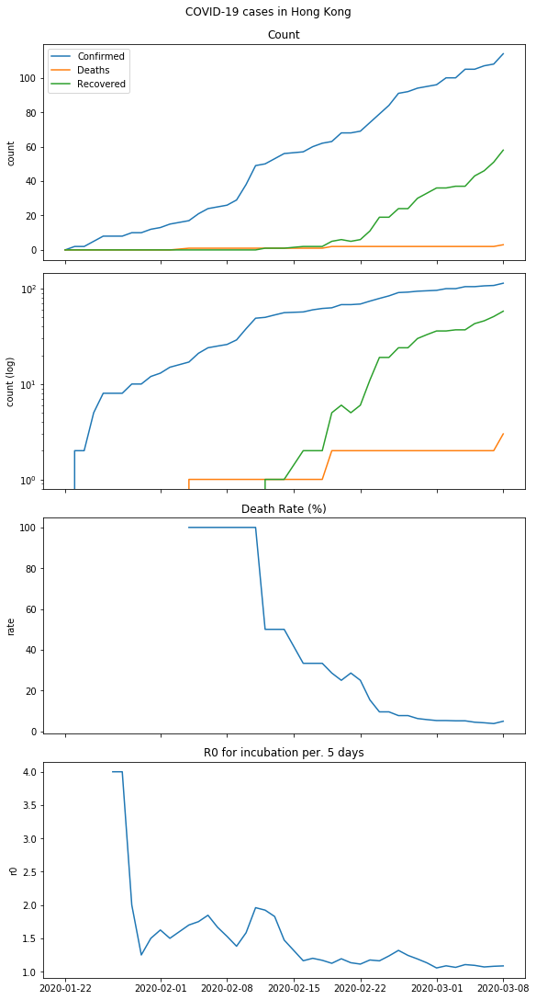

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
0,2020-01-22,Hong Kong,0.0,0.0,0.0,NaN
11,2020-01-23,Hong Kong,2.0,0.0,0.0,NaN
25,2020-01-24,Hong Kong,2.0,0.0,0.0,NaN
37,2020-01-25,Hong Kong,5.0,0.0,0.0,NaN
52,2020-01-26,Hong Kong,8.0,0.0,0.0,NaN
68,2020-01-27,Hong Kong,8.0,0.0,0.0,NaN
87,2020-01-28,Hong Kong,8.0,0.0,0.0,NaN
106,2020-01-29,Hong Kong,10.0,0.0,0.0,NaN
126,2020-01-30,Hong Kong,10.0,0.0,0.0,NaN
148,2020-01-31,Hong Kong,12.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,inf
2020-01-27,4.000000
2020-01-28,4.000000
2020-01-29,2.000000
2020-01-30,1.250000


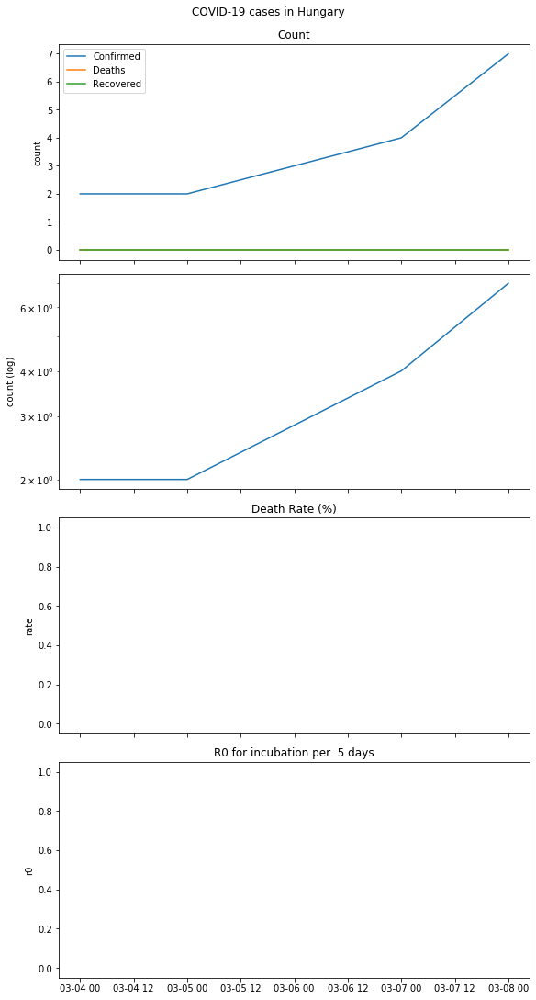

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
737,2020-03-04,Hungary,2.0,0.0,0.0,NaN
787,2020-03-05,Hungary,2.0,0.0,0.0,NaN
902,2020-03-07,Hungary,4.0,0.0,0.0,NaN
959,2020-03-08,Hungary,7.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-04,NaN
2020-03-05,NaN
2020-03-07,NaN
2020-03-08,NaN


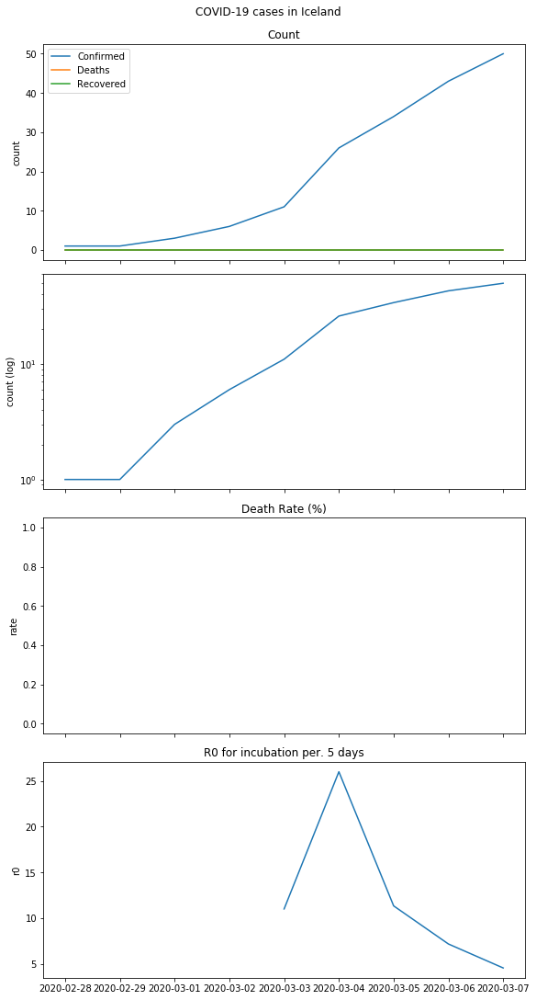

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
520,2020-02-28,Iceland,1.0,0.0,0.0,NaN
554,2020-02-29,Iceland,1.0,0.0,0.0,NaN
602,2020-03-01,Iceland,3.0,0.0,0.0,NaN
639,2020-03-02,Iceland,6.0,0.0,0.0,NaN
683,2020-03-03,Iceland,11.0,0.0,0.0,NaN
738,2020-03-04,Iceland,26.0,0.0,0.0,NaN
788,2020-03-05,Iceland,34.0,0.0,0.0,NaN
842,2020-03-06,Iceland,43.0,0.0,0.0,NaN
903,2020-03-07,Iceland,50.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-28,NaN
2020-02-29,NaN
2020-03-01,NaN
2020-03-02,NaN
2020-03-03,11.000000
2020-03-04,26.000000
2020-03-05,11.333333
2020-03-06,7.166667
2020-03-07,4.545455


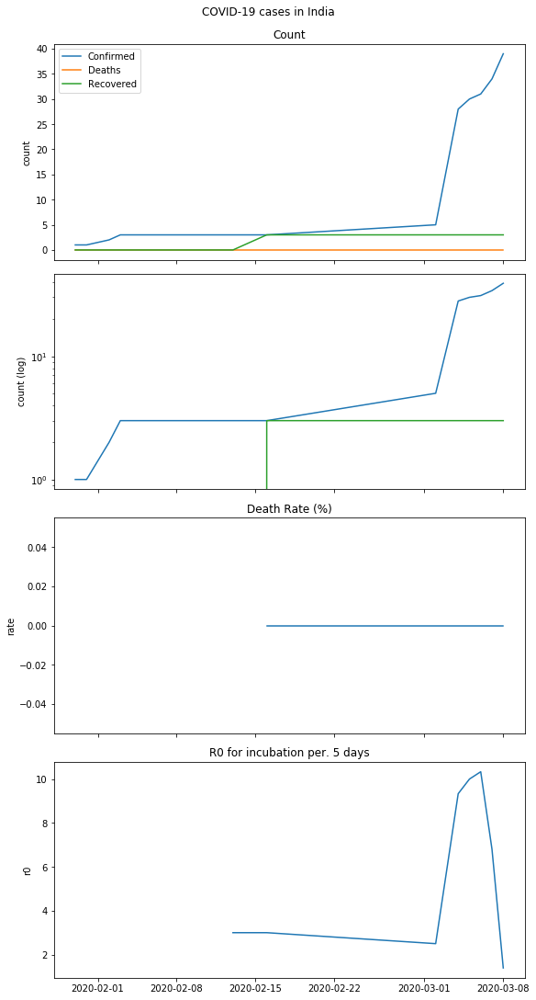

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
127,2020-01-30,India,1.0,0.0,0.0,NaN
149,2020-01-31,India,1.0,0.0,0.0,NaN
186,2020-02-02,India,2.0,0.0,0.0,NaN
194,2020-02-03,India,3.0,0.0,0.0,NaN
298,2020-02-13,India,3.0,0.0,0.0,NaN
325,2020-02-16,India,3.0,0.0,3.0,0.0
640,2020-03-02,India,5.0,0.0,3.0,0.0
739,2020-03-04,India,28.0,0.0,3.0,0.0
789,2020-03-05,India,30.0,0.0,3.0,0.0
843,2020-03-06,India,31.0,0.0,3.0,0.0


,r0
Last Update,
2020-01-30,NaN
2020-01-31,NaN
2020-02-02,NaN
2020-02-03,NaN
2020-02-13,3.000000
2020-02-16,3.000000
2020-03-02,2.500000
2020-03-04,9.333333
2020-03-05,10.000000


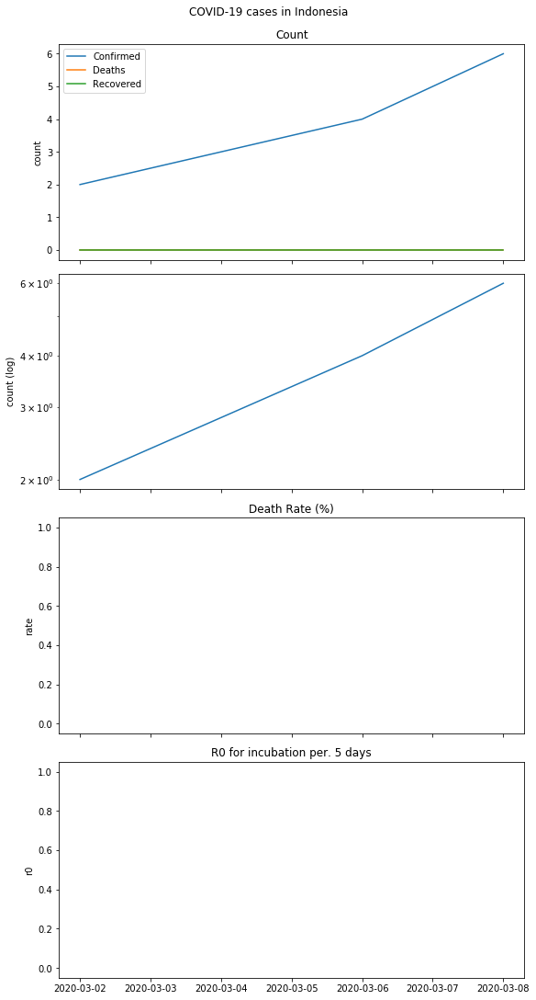

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
641,2020-03-02,Indonesia,2.0,0.0,0.0,NaN
844,2020-03-06,Indonesia,4.0,0.0,0.0,NaN
961,2020-03-08,Indonesia,6.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-02,NaN
2020-03-06,NaN
2020-03-08,NaN


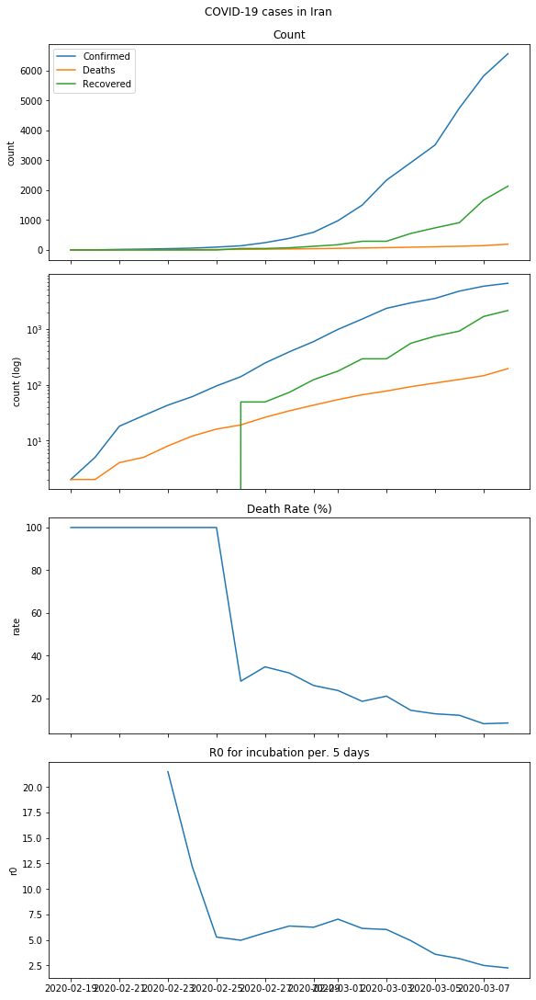

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
356,2020-02-19,Iran,2.0,2.0,0.0,100.000000
364,2020-02-20,Iran,5.0,2.0,0.0,100.000000
376,2020-02-21,Iran,18.0,4.0,0.0,100.000000
390,2020-02-22,Iran,28.0,5.0,0.0,100.000000
400,2020-02-23,Iran,43.0,8.0,0.0,100.000000
414,2020-02-24,Iran,61.0,12.0,0.0,100.000000
434,2020-02-25,Iran,95.0,16.0,0.0,100.000000
459,2020-02-26,Iran,139.0,19.0,49.0,27.941176
490,2020-02-27,Iran,245.0,26.0,49.0,34.666667
521,2020-02-28,Iran,388.0,34.0,73.0,31.775701


,r0
Last Update,
2020-02-19,NaN
2020-02-20,NaN
2020-02-21,NaN
2020-02-22,NaN
2020-02-23,21.500000
2020-02-24,12.200000
2020-02-25,5.277778
2020-02-26,4.964286
2020-02-27,5.697674


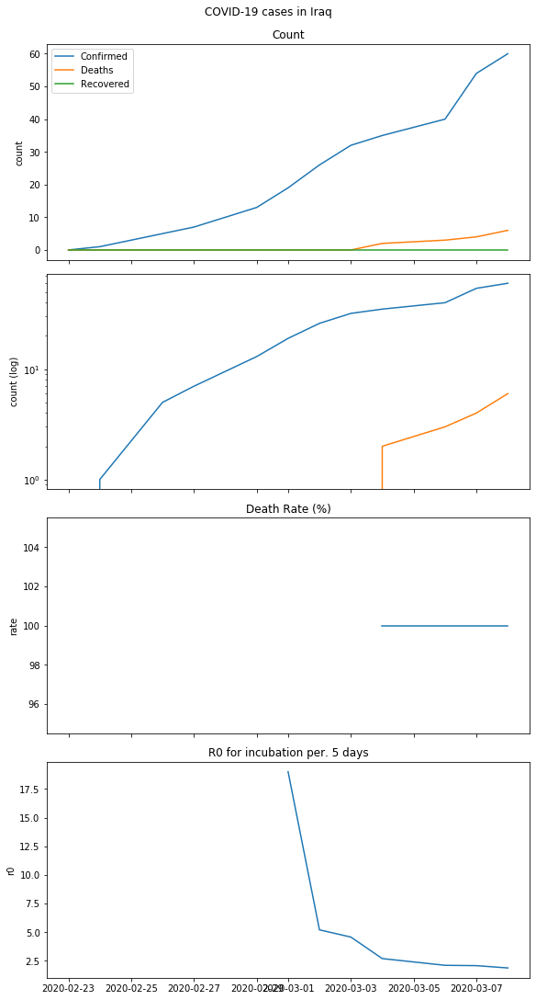

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
401,2020-02-23,Iraq,0.0,0.0,0.0,NaN
415,2020-02-24,Iraq,1.0,0.0,0.0,NaN
460,2020-02-26,Iraq,5.0,0.0,0.0,NaN
491,2020-02-27,Iraq,7.0,0.0,0.0,NaN
556,2020-02-29,Iraq,13.0,0.0,0.0,NaN
604,2020-03-01,Iraq,19.0,0.0,0.0,NaN
643,2020-03-02,Iraq,26.0,0.0,0.0,NaN
685,2020-03-03,Iraq,32.0,0.0,0.0,NaN
741,2020-03-04,Iraq,35.0,2.0,0.0,100.0
846,2020-03-06,Iraq,40.0,3.0,0.0,100.0


,r0
Last Update,
2020-02-23,NaN
2020-02-24,NaN
2020-02-26,NaN
2020-02-27,NaN
2020-02-29,inf
2020-03-01,19.000000
2020-03-02,5.200000
2020-03-03,4.571429
2020-03-04,2.692308


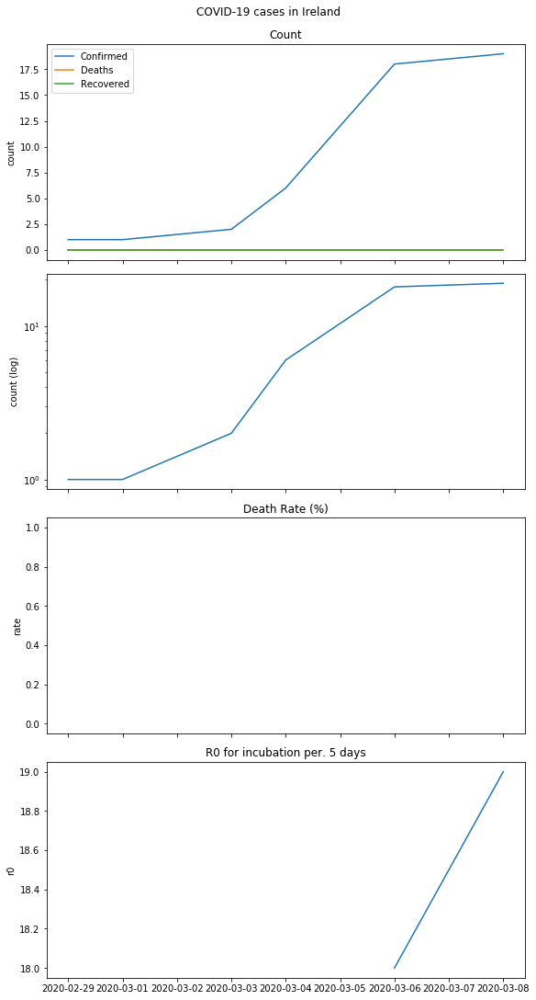

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
557,2020-02-29,Ireland,1.0,0.0,0.0,NaN
605,2020-03-01,Ireland,1.0,0.0,0.0,NaN
686,2020-03-03,Ireland,2.0,0.0,0.0,NaN
742,2020-03-04,Ireland,6.0,0.0,0.0,NaN
847,2020-03-06,Ireland,18.0,0.0,0.0,NaN
964,2020-03-08,Ireland,19.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-29,NaN
2020-03-01,NaN
2020-03-03,NaN
2020-03-04,NaN
2020-03-06,18.0
2020-03-08,19.0


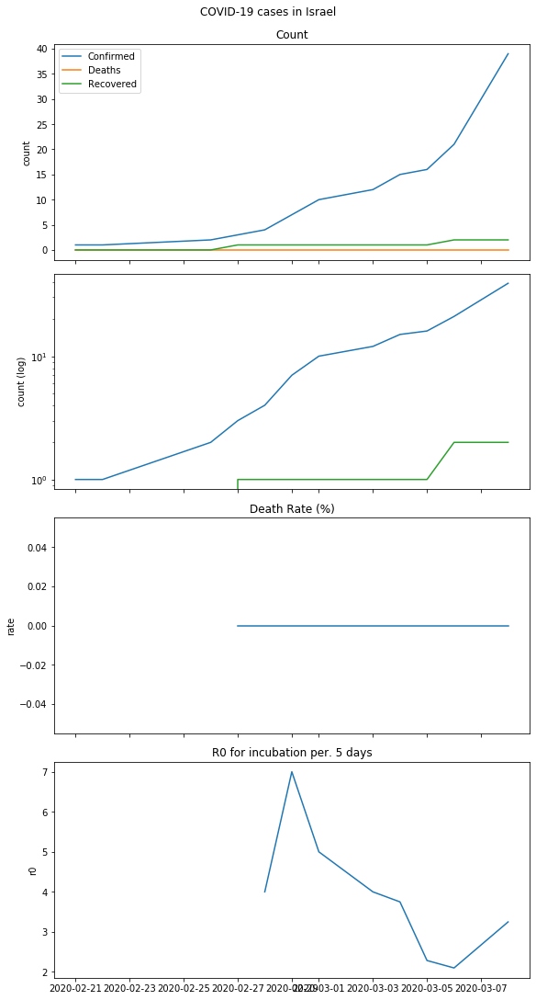

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
377,2020-02-21,Israel,1.0,0.0,0.0,NaN
391,2020-02-22,Israel,1.0,0.0,0.0,NaN
461,2020-02-26,Israel,2.0,0.0,0.0,NaN
492,2020-02-27,Israel,3.0,0.0,1.0,0.0
522,2020-02-28,Israel,4.0,0.0,1.0,0.0
558,2020-02-29,Israel,7.0,0.0,1.0,0.0
606,2020-03-01,Israel,10.0,0.0,1.0,0.0
687,2020-03-03,Israel,12.0,0.0,1.0,0.0
743,2020-03-04,Israel,15.0,0.0,1.0,0.0
791,2020-03-05,Israel,16.0,0.0,1.0,0.0


,r0
Last Update,
2020-02-21,NaN
2020-02-22,NaN
2020-02-26,NaN
2020-02-27,NaN
2020-02-28,4.000000
2020-02-29,7.000000
2020-03-01,5.000000
2020-03-03,4.000000
2020-03-04,3.750000


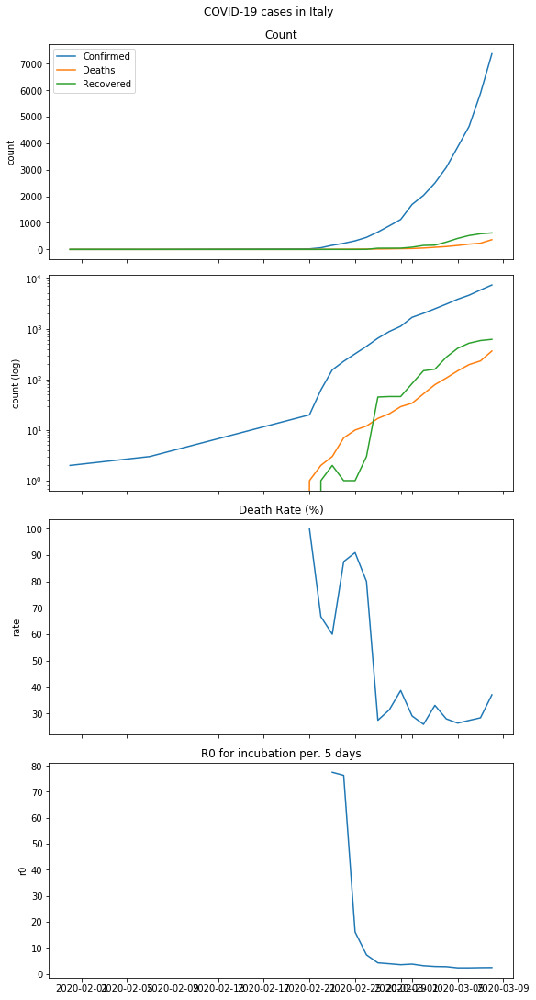

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
150,2020-01-31,Italy,2.0,0.0,0.0,NaN
229,2020-02-07,Italy,3.0,0.0,0.0,NaN
378,2020-02-21,Italy,20.0,1.0,0.0,100.000000
392,2020-02-22,Italy,62.0,2.0,1.0,66.666667
402,2020-02-23,Italy,155.0,3.0,2.0,60.000000
416,2020-02-24,Italy,229.0,7.0,1.0,87.500000
435,2020-02-25,Italy,322.0,10.0,1.0,90.909091
462,2020-02-26,Italy,453.0,12.0,3.0,80.000000
493,2020-02-27,Italy,655.0,17.0,45.0,27.419355
523,2020-02-28,Italy,888.0,21.0,46.0,31.343284


,r0
Last Update,
2020-01-31,NaN
2020-02-07,NaN
2020-02-21,NaN
2020-02-22,NaN
2020-02-23,77.500000
2020-02-24,76.333333
2020-02-25,16.100000
2020-02-26,7.306452
2020-02-27,4.225806


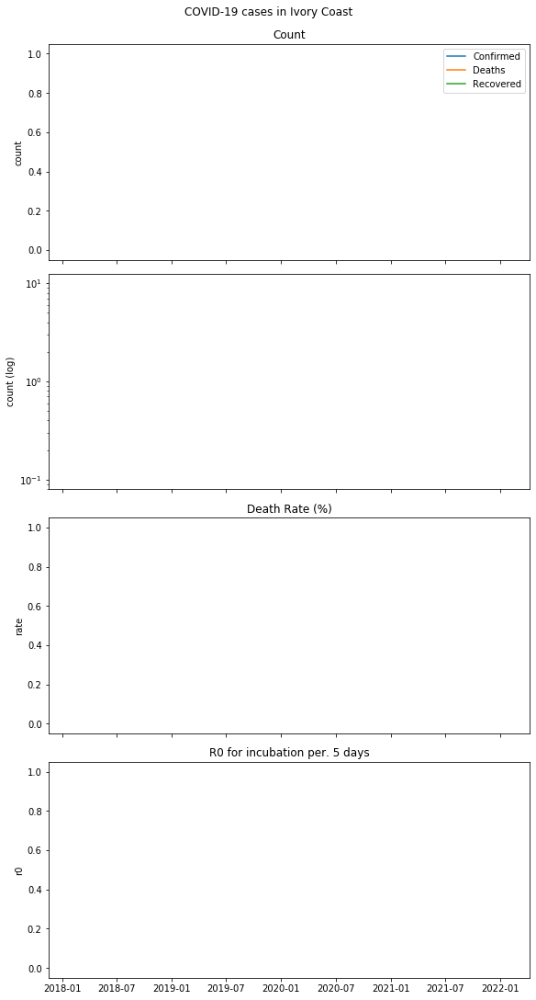

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
69,2020-01-27,Ivory Coast,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-27,NaN


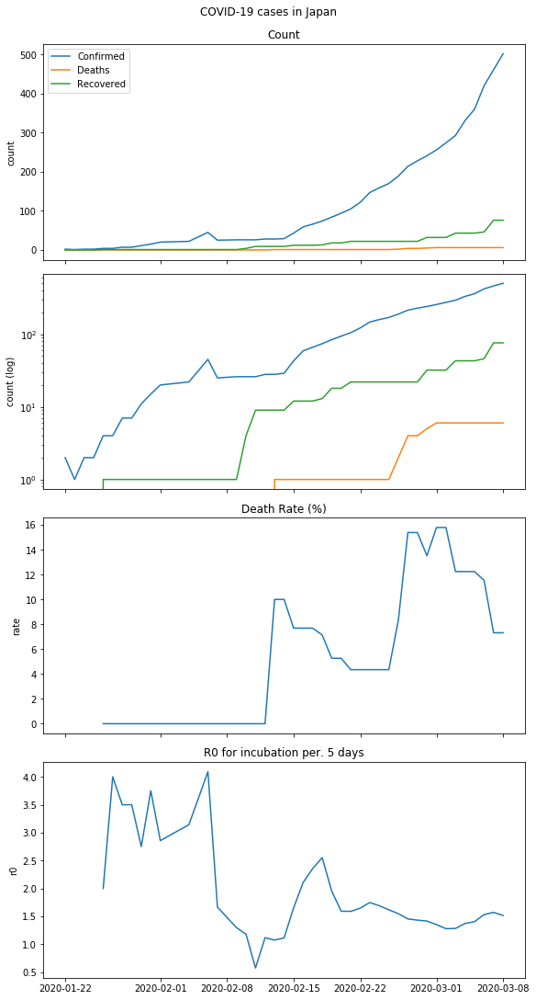

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
1,2020-01-22,Japan,2.0,0.0,0.0,NaN
12,2020-01-23,Japan,1.0,0.0,0.0,NaN
26,2020-01-24,Japan,2.0,0.0,0.0,NaN
38,2020-01-25,Japan,2.0,0.0,0.0,NaN
53,2020-01-26,Japan,4.0,0.0,1.0,0.000000
70,2020-01-27,Japan,4.0,0.0,1.0,0.000000
88,2020-01-28,Japan,7.0,0.0,1.0,0.000000
107,2020-01-29,Japan,7.0,0.0,1.0,0.000000
128,2020-01-30,Japan,11.0,0.0,1.0,0.000000
151,2020-01-31,Japan,15.0,0.0,1.0,0.000000


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,2.000000
2020-01-27,4.000000
2020-01-28,3.500000
2020-01-29,3.500000
2020-01-30,2.750000


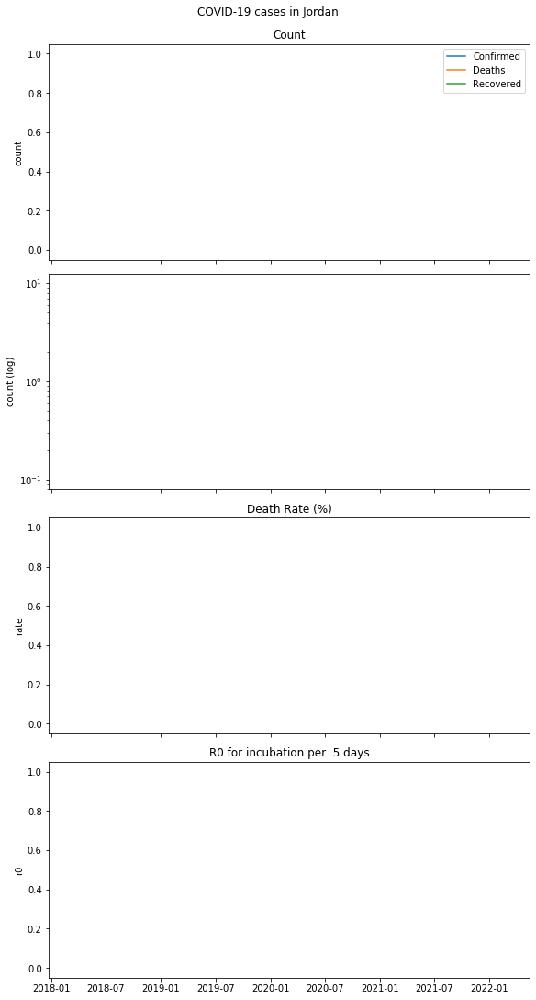

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
690,2020-03-03,Jordan,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-03,NaN


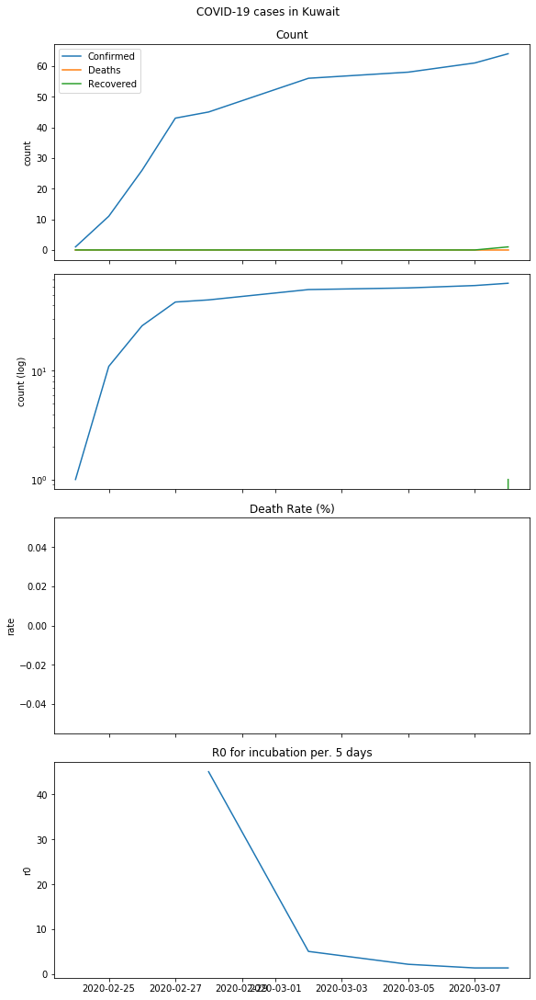

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
418,2020-02-24,Kuwait,1.0,0.0,0.0,NaN
437,2020-02-25,Kuwait,11.0,0.0,0.0,NaN
464,2020-02-26,Kuwait,26.0,0.0,0.0,NaN
495,2020-02-27,Kuwait,43.0,0.0,0.0,NaN
525,2020-02-28,Kuwait,45.0,0.0,0.0,NaN
646,2020-03-02,Kuwait,56.0,0.0,0.0,NaN
794,2020-03-05,Kuwait,58.0,0.0,0.0,NaN
909,2020-03-07,Kuwait,61.0,0.0,0.0,NaN
968,2020-03-08,Kuwait,64.0,0.0,1.0,0.0


,r0
Last Update,
2020-02-24,NaN
2020-02-25,NaN
2020-02-26,NaN
2020-02-27,NaN
2020-02-28,45.000000
2020-03-02,5.090909
2020-03-05,2.230769
2020-03-07,1.418605
2020-03-08,1.422222


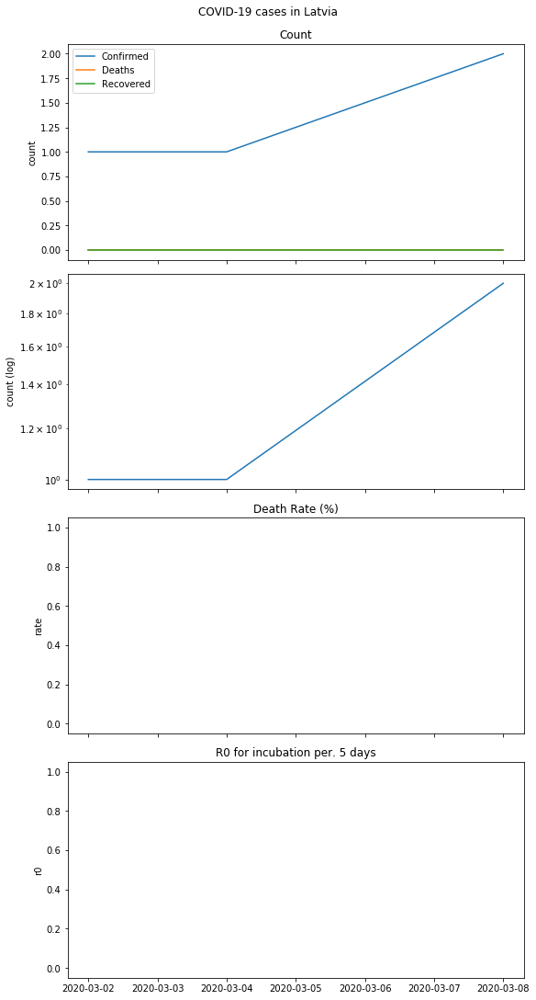

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
647,2020-03-02,Latvia,1.0,0.0,0.0,NaN
746,2020-03-04,Latvia,1.0,0.0,0.0,NaN
969,2020-03-08,Latvia,2.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-02,NaN
2020-03-04,NaN
2020-03-08,NaN


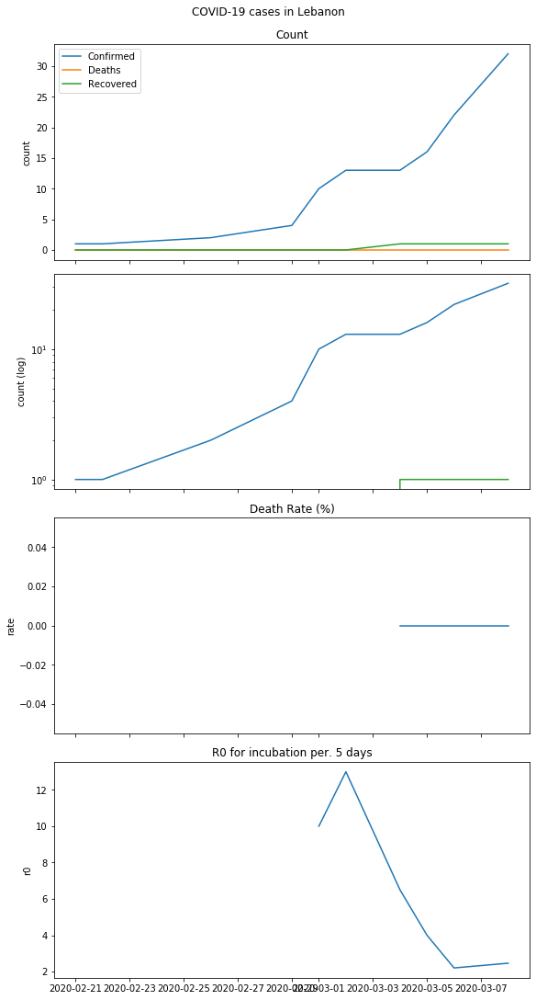

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
380,2020-02-21,Lebanon,1.0,0.0,0.0,NaN
394,2020-02-22,Lebanon,1.0,0.0,0.0,NaN
465,2020-02-26,Lebanon,2.0,0.0,0.0,NaN
561,2020-02-29,Lebanon,4.0,0.0,0.0,NaN
609,2020-03-01,Lebanon,10.0,0.0,0.0,NaN
648,2020-03-02,Lebanon,13.0,0.0,0.0,NaN
747,2020-03-04,Lebanon,13.0,0.0,1.0,0.0
795,2020-03-05,Lebanon,16.0,0.0,1.0,0.0
851,2020-03-06,Lebanon,22.0,0.0,1.0,0.0
970,2020-03-08,Lebanon,32.0,0.0,1.0,0.0


,r0
Last Update,
2020-02-21,NaN
2020-02-22,NaN
2020-02-26,NaN
2020-02-29,NaN
2020-03-01,10.000000
2020-03-02,13.000000
2020-03-04,6.500000
2020-03-05,4.000000
2020-03-06,2.200000


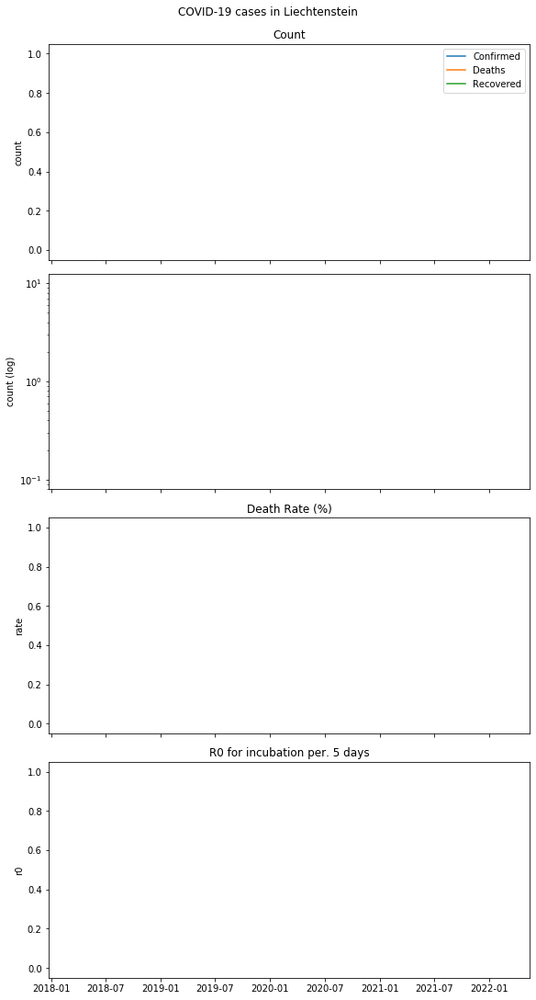

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
748,2020-03-04,Liechtenstein,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-04,NaN


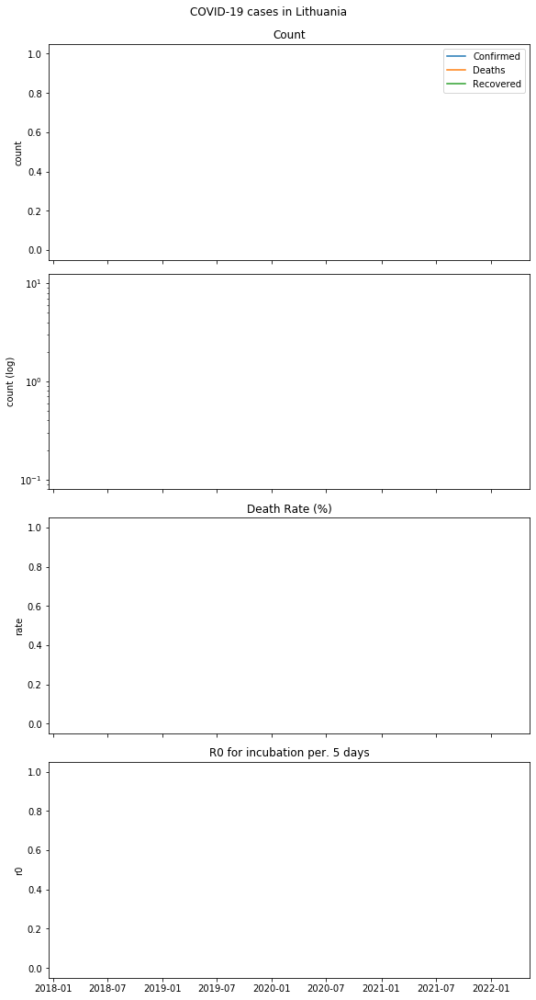

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
526,2020-02-28,Lithuania,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-28,NaN


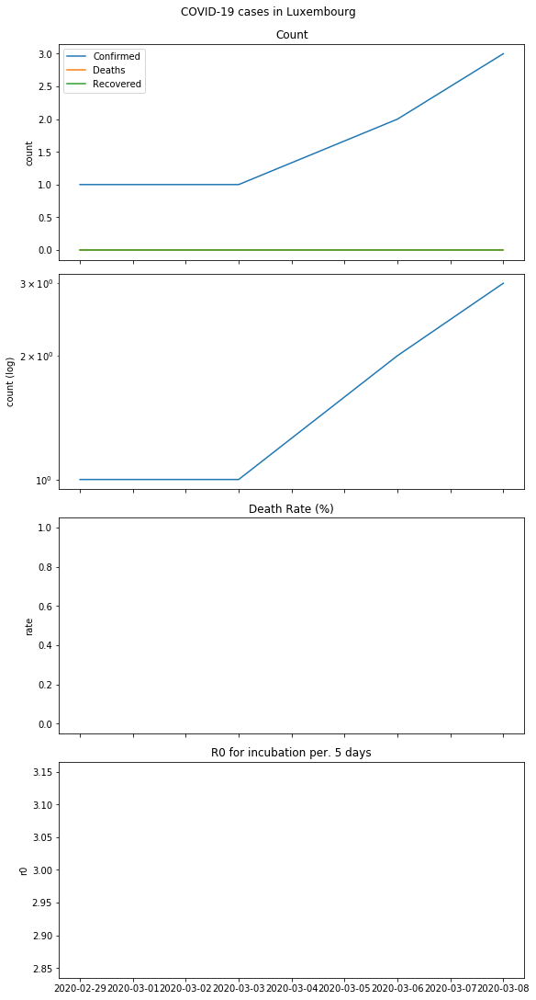

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
562,2020-02-29,Luxembourg,1.0,0.0,0.0,NaN
610,2020-03-01,Luxembourg,1.0,0.0,0.0,NaN
691,2020-03-03,Luxembourg,1.0,0.0,0.0,NaN
852,2020-03-06,Luxembourg,2.0,0.0,0.0,NaN
971,2020-03-08,Luxembourg,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-29,NaN
2020-03-01,NaN
2020-03-03,NaN
2020-03-06,NaN
2020-03-08,3.0


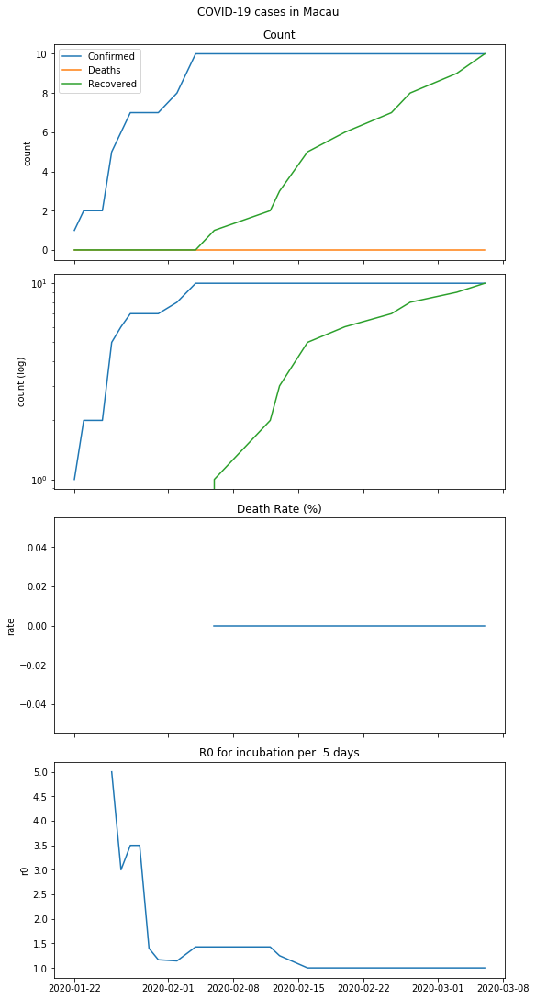

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
2,2020-01-22,Macau,1.0,0.0,0.0,NaN
13,2020-01-23,Macau,2.0,0.0,0.0,NaN
27,2020-01-24,Macau,2.0,0.0,0.0,NaN
39,2020-01-25,Macau,2.0,0.0,0.0,NaN
54,2020-01-26,Macau,5.0,0.0,0.0,NaN
71,2020-01-27,Macau,6.0,0.0,0.0,NaN
89,2020-01-28,Macau,7.0,0.0,0.0,NaN
108,2020-01-29,Macau,7.0,0.0,0.0,NaN
129,2020-01-30,Macau,7.0,0.0,0.0,NaN
152,2020-01-31,Macau,7.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,5.000000
2020-01-27,3.000000
2020-01-28,3.500000
2020-01-29,3.500000
2020-01-30,1.400000


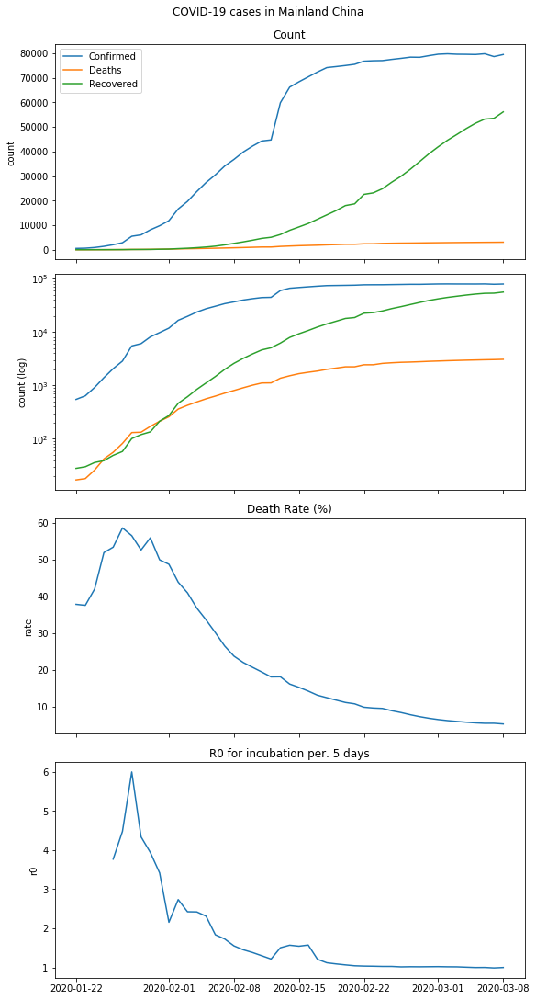

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
3,2020-01-22,Mainland China,547.0,17.0,28.0,37.777778
14,2020-01-23,Mainland China,639.0,18.0,30.0,37.500000
28,2020-01-24,Mainland China,916.0,26.0,36.0,41.935484
40,2020-01-25,Mainland China,1399.0,42.0,39.0,51.851852
55,2020-01-26,Mainland China,2062.0,56.0,49.0,53.333333
72,2020-01-27,Mainland China,2863.0,82.0,58.0,58.571429
90,2020-01-28,Mainland China,5494.0,131.0,101.0,56.465517
109,2020-01-29,Mainland China,6070.0,133.0,120.0,52.569170
130,2020-01-30,Mainland China,8124.0,171.0,135.0,55.882353
153,2020-01-31,Mainland China,9783.0,213.0,214.0,49.882904


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,3.769653
2020-01-27,4.480438
2020-01-28,5.997817
2020-01-29,4.338813
2020-01-30,3.939864


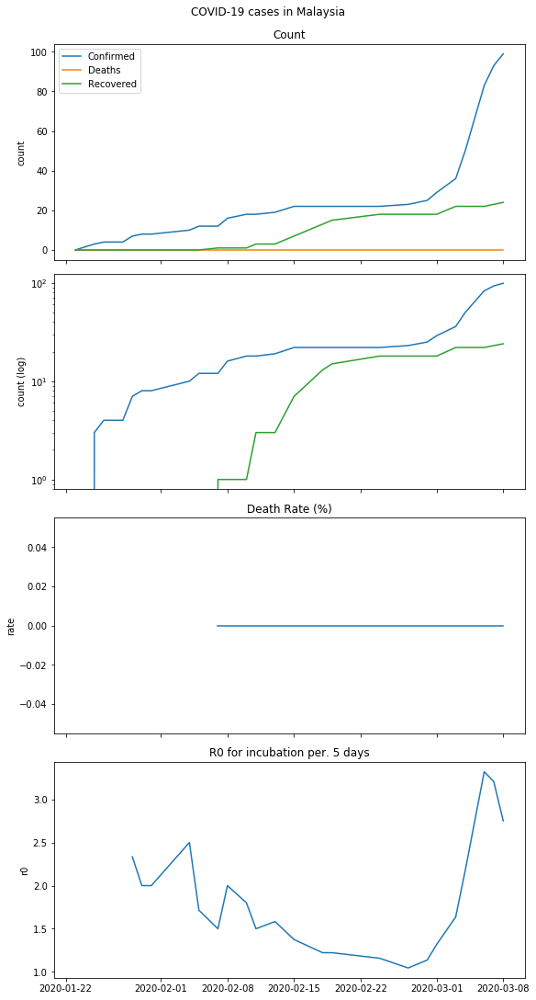

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
15,2020-01-23,Malaysia,0.0,0.0,0.0,NaN
41,2020-01-25,Malaysia,3.0,0.0,0.0,NaN
56,2020-01-26,Malaysia,4.0,0.0,0.0,NaN
73,2020-01-27,Malaysia,4.0,0.0,0.0,NaN
91,2020-01-28,Malaysia,4.0,0.0,0.0,NaN
110,2020-01-29,Malaysia,7.0,0.0,0.0,NaN
131,2020-01-30,Malaysia,8.0,0.0,0.0,NaN
154,2020-01-31,Malaysia,8.0,0.0,0.0,NaN
205,2020-02-04,Malaysia,10.0,0.0,0.0,NaN
213,2020-02-05,Malaysia,12.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-23,NaN
2020-01-25,NaN
2020-01-26,NaN
2020-01-27,NaN
2020-01-28,inf
2020-01-29,2.333333
2020-01-30,2.000000
2020-01-31,2.000000
2020-02-04,2.500000


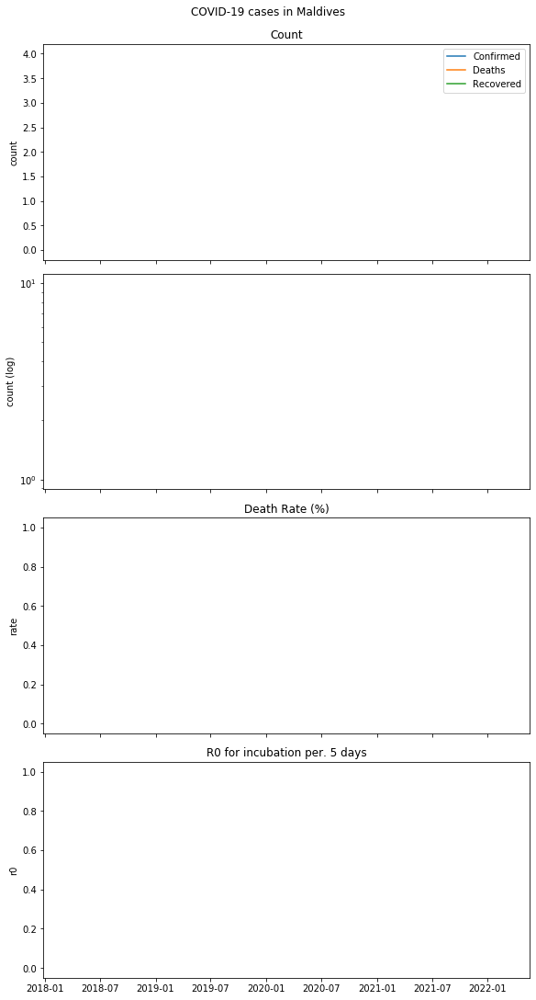

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
974,2020-03-08,Maldives,4.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-08,NaN


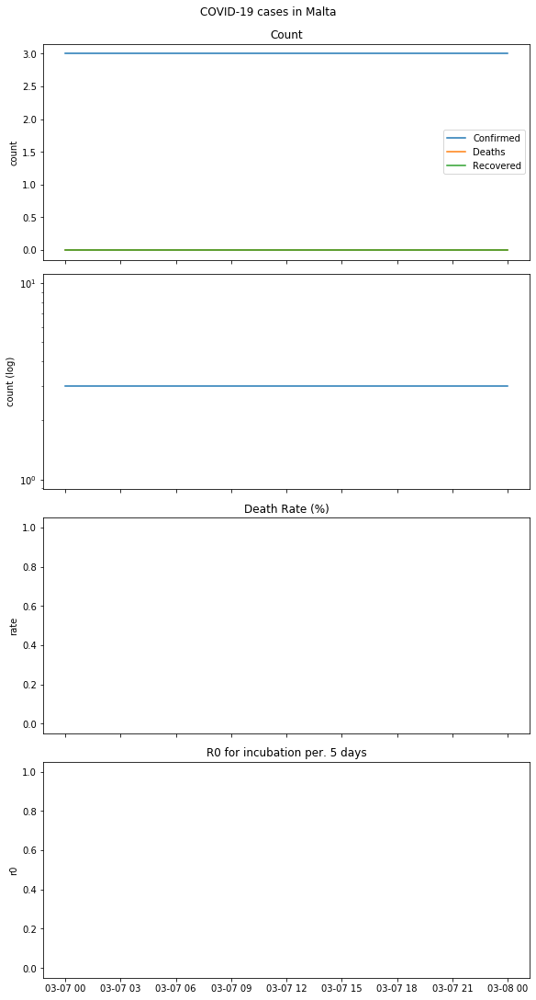

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
912,2020-03-07,Malta,3.0,0.0,0.0,NaN
975,2020-03-08,Malta,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-07,NaN
2020-03-08,NaN


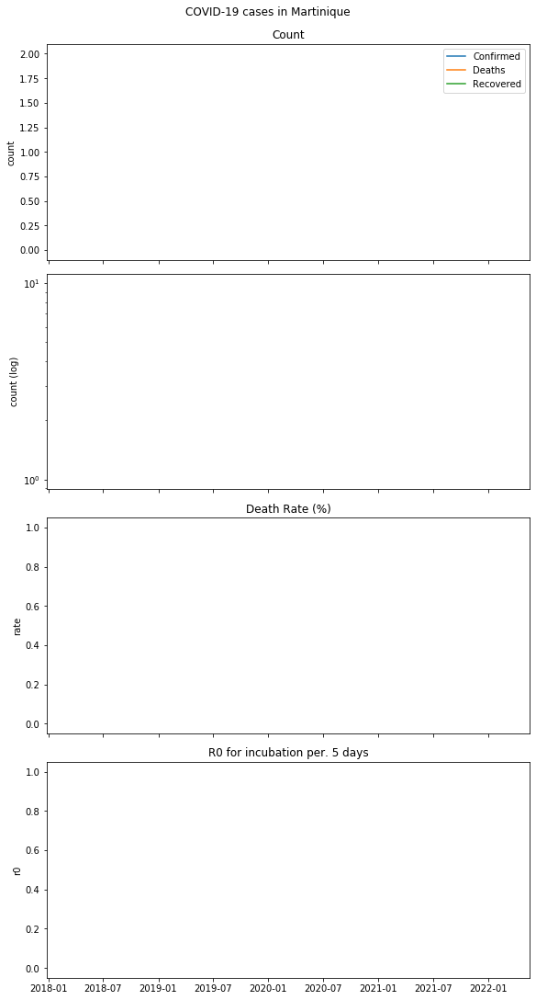

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
913,2020-03-07,Martinique,2.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-07,NaN


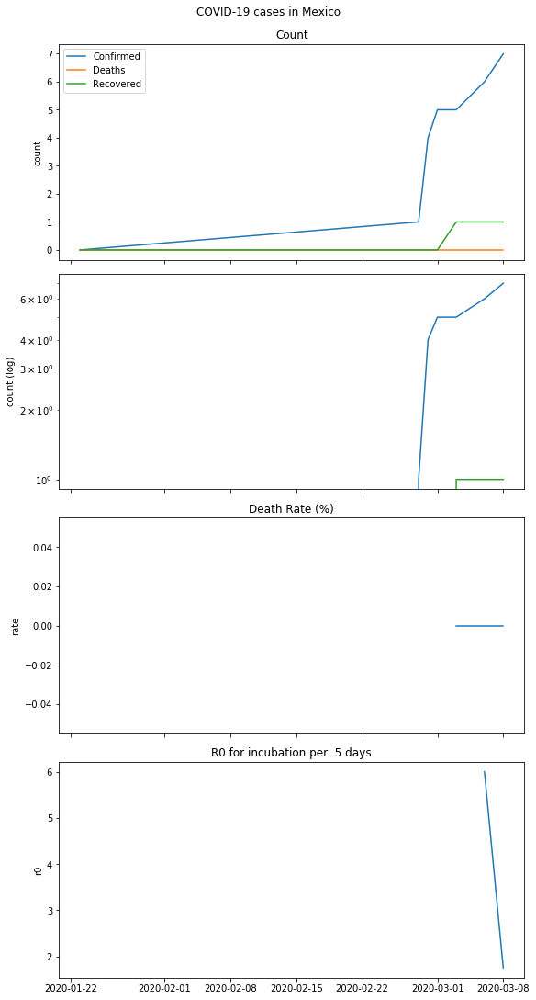

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
16,2020-01-23,Mexico,0.0,0.0,0.0,NaN
528,2020-02-28,Mexico,1.0,0.0,0.0,NaN
565,2020-02-29,Mexico,4.0,0.0,0.0,NaN
613,2020-03-01,Mexico,5.0,0.0,0.0,NaN
695,2020-03-03,Mexico,5.0,0.0,1.0,0.0
856,2020-03-06,Mexico,6.0,0.0,1.0,0.0
976,2020-03-08,Mexico,7.0,0.0,1.0,0.0


,r0
Last Update,
2020-01-23,NaN
2020-02-28,NaN
2020-02-29,NaN
2020-03-01,NaN
2020-03-03,inf
2020-03-06,6.00
2020-03-08,1.75


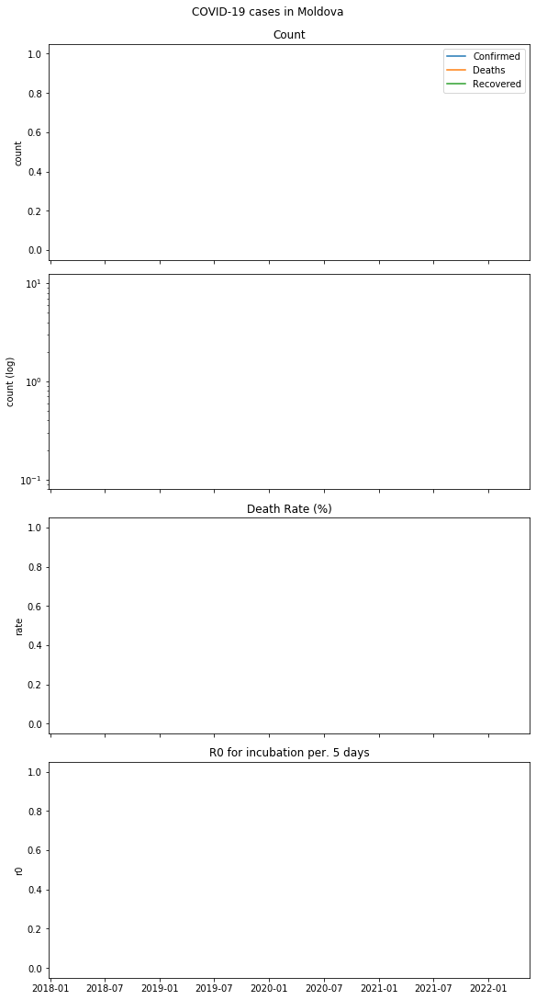

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
977,2020-03-08,Moldova,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-08,NaN


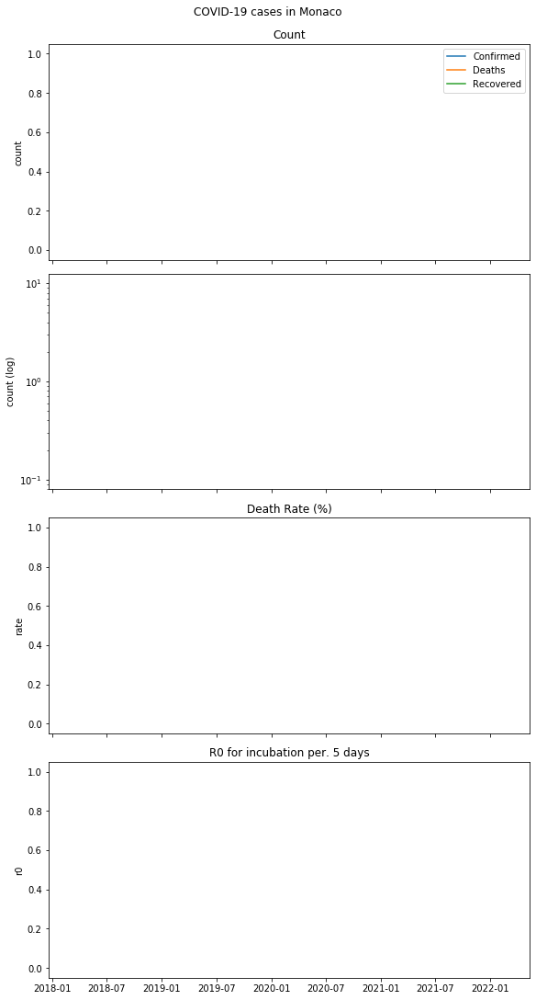

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
566,2020-02-29,Monaco,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-29,NaN


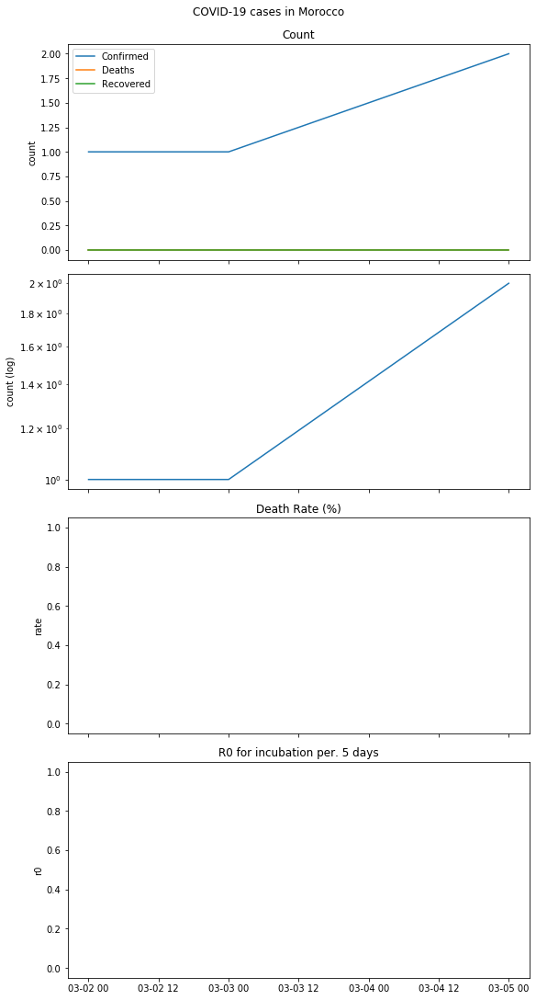

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
650,2020-03-02,Morocco,1.0,0.0,0.0,NaN
696,2020-03-03,Morocco,1.0,0.0,0.0,NaN
797,2020-03-05,Morocco,2.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-02,NaN
2020-03-03,NaN
2020-03-05,NaN


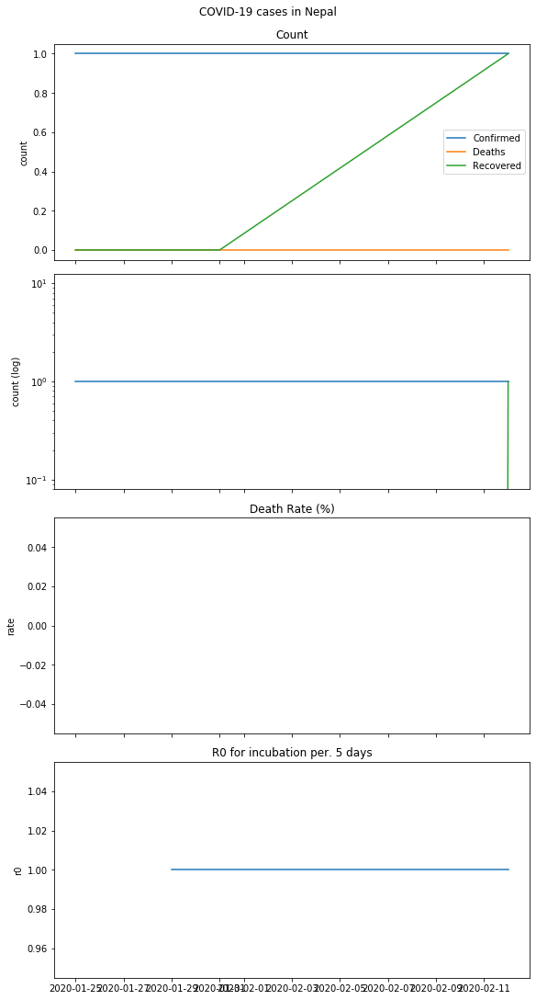

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
42,2020-01-25,Nepal,1.0,0.0,0.0,NaN
57,2020-01-26,Nepal,1.0,0.0,0.0,NaN
74,2020-01-27,Nepal,1.0,0.0,0.0,NaN
92,2020-01-28,Nepal,1.0,0.0,0.0,NaN
111,2020-01-29,Nepal,1.0,0.0,0.0,NaN
132,2020-01-30,Nepal,1.0,0.0,0.0,NaN
155,2020-01-31,Nepal,1.0,0.0,0.0,NaN
287,2020-02-12,Nepal,1.0,0.0,1.0,0.0


,r0
Last Update,
2020-01-25,NaN
2020-01-26,NaN
2020-01-27,NaN
2020-01-28,NaN
2020-01-29,1.0
2020-01-30,1.0
2020-01-31,1.0
2020-02-12,1.0


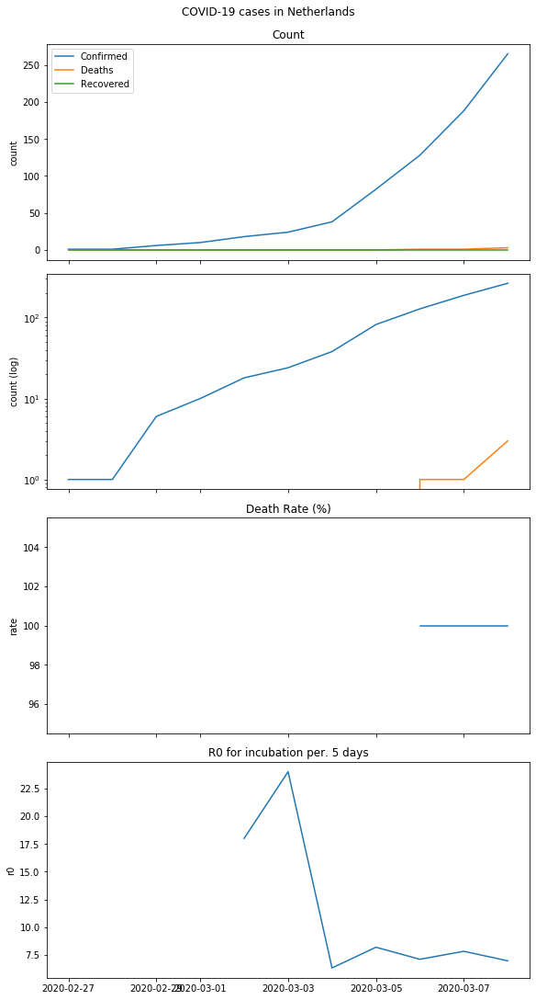

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
499,2020-02-27,Netherlands,1.0,0.0,0.0,NaN
529,2020-02-28,Netherlands,1.0,0.0,0.0,NaN
567,2020-02-29,Netherlands,6.0,0.0,0.0,NaN
614,2020-03-01,Netherlands,10.0,0.0,0.0,NaN
651,2020-03-02,Netherlands,18.0,0.0,0.0,NaN
697,2020-03-03,Netherlands,24.0,0.0,0.0,NaN
751,2020-03-04,Netherlands,38.0,0.0,0.0,NaN
798,2020-03-05,Netherlands,82.0,0.0,0.0,NaN
857,2020-03-06,Netherlands,128.0,1.0,0.0,100.0
914,2020-03-07,Netherlands,188.0,1.0,0.0,100.0


,r0
Last Update,
2020-02-27,NaN
2020-02-28,NaN
2020-02-29,NaN
2020-03-01,NaN
2020-03-02,18.000000
2020-03-03,24.000000
2020-03-04,6.333333
2020-03-05,8.200000
2020-03-06,7.111111


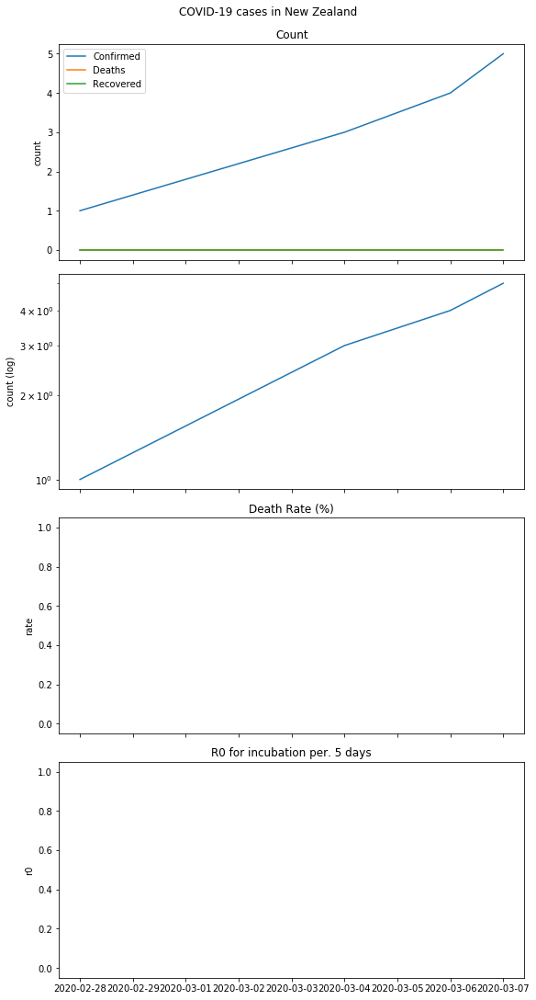

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
530,2020-02-28,New Zealand,1.0,0.0,0.0,NaN
752,2020-03-04,New Zealand,3.0,0.0,0.0,NaN
858,2020-03-06,New Zealand,4.0,0.0,0.0,NaN
915,2020-03-07,New Zealand,5.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-28,NaN
2020-03-04,NaN
2020-03-06,NaN
2020-03-07,NaN


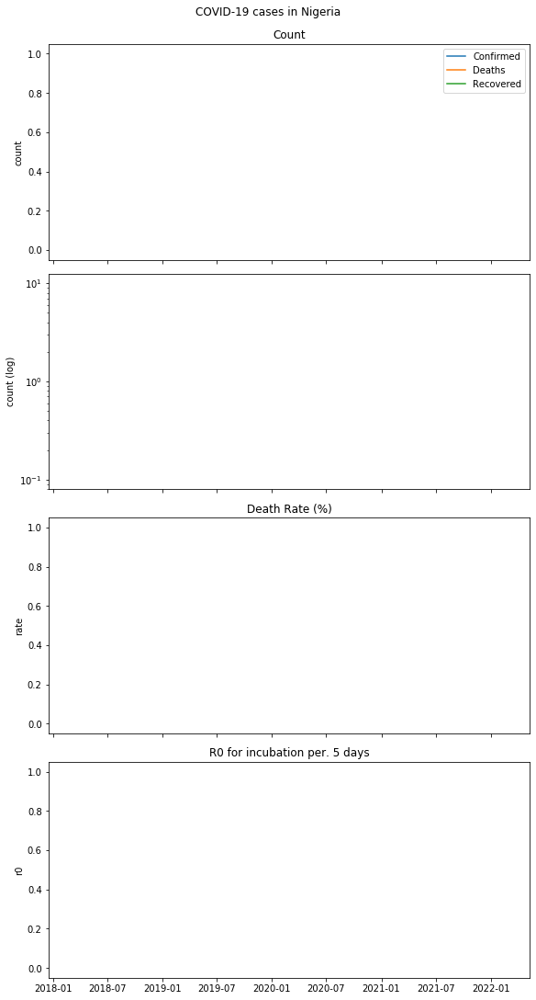

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
531,2020-02-28,Nigeria,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-28,NaN


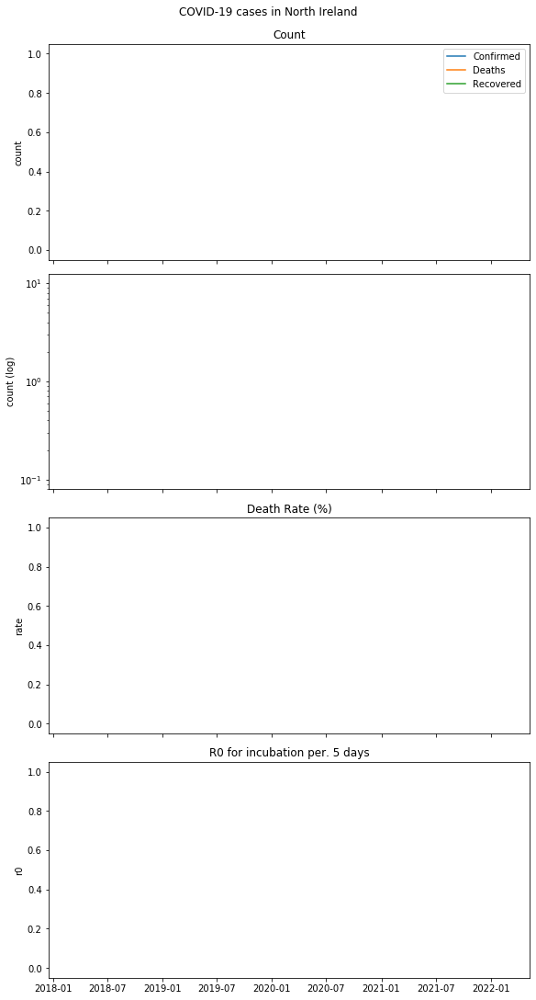

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
532,2020-02-28,North Ireland,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-28,NaN


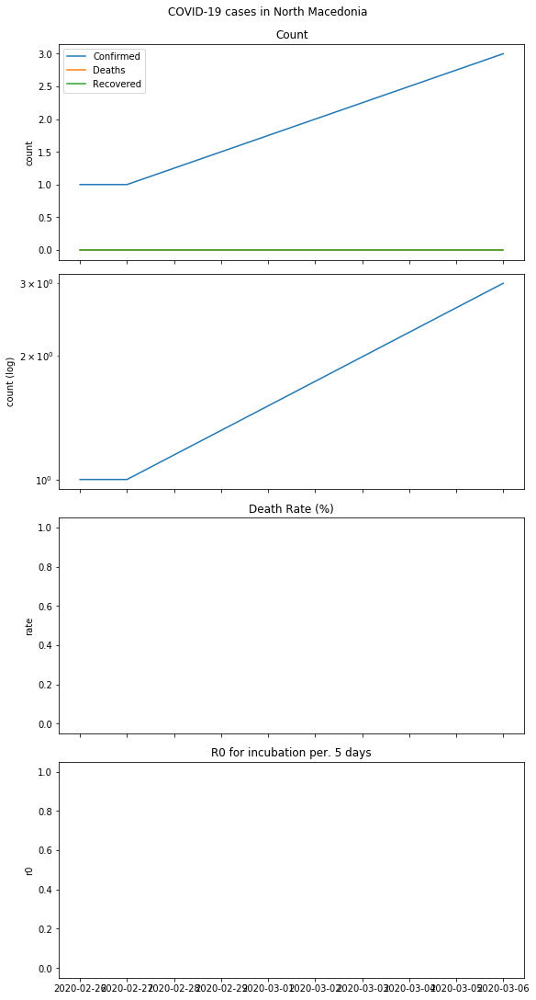

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
467,2020-02-26,North Macedonia,1.0,0.0,0.0,NaN
500,2020-02-27,North Macedonia,1.0,0.0,0.0,NaN
859,2020-03-06,North Macedonia,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-26,NaN
2020-02-27,NaN
2020-03-06,NaN


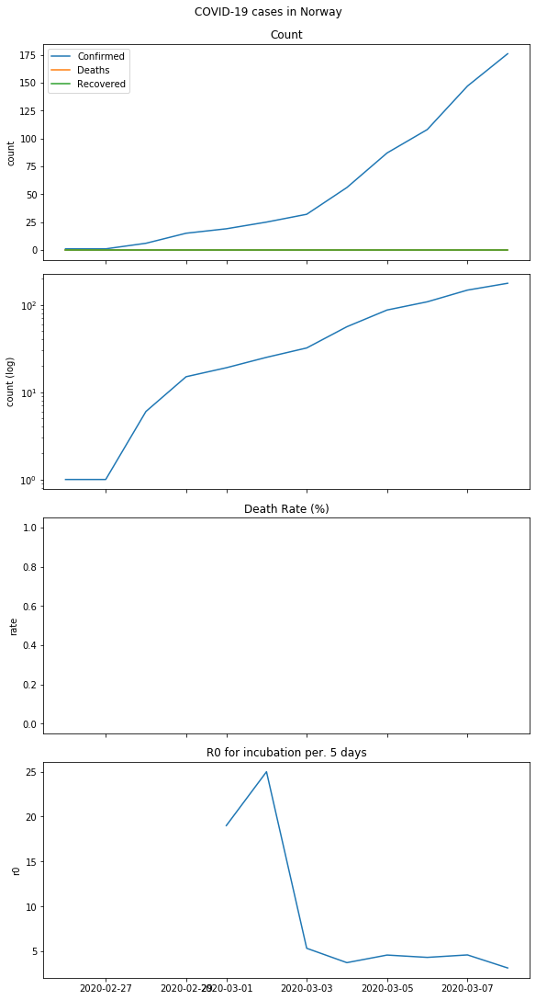

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
468,2020-02-26,Norway,1.0,0.0,0.0,NaN
501,2020-02-27,Norway,1.0,0.0,0.0,NaN
533,2020-02-28,Norway,6.0,0.0,0.0,NaN
568,2020-02-29,Norway,15.0,0.0,0.0,NaN
615,2020-03-01,Norway,19.0,0.0,0.0,NaN
652,2020-03-02,Norway,25.0,0.0,0.0,NaN
698,2020-03-03,Norway,32.0,0.0,0.0,NaN
753,2020-03-04,Norway,56.0,0.0,0.0,NaN
799,2020-03-05,Norway,87.0,0.0,0.0,NaN
860,2020-03-06,Norway,108.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-26,NaN
2020-02-27,NaN
2020-02-28,NaN
2020-02-29,NaN
2020-03-01,19.000000
2020-03-02,25.000000
2020-03-03,5.333333
2020-03-04,3.733333
2020-03-05,4.578947


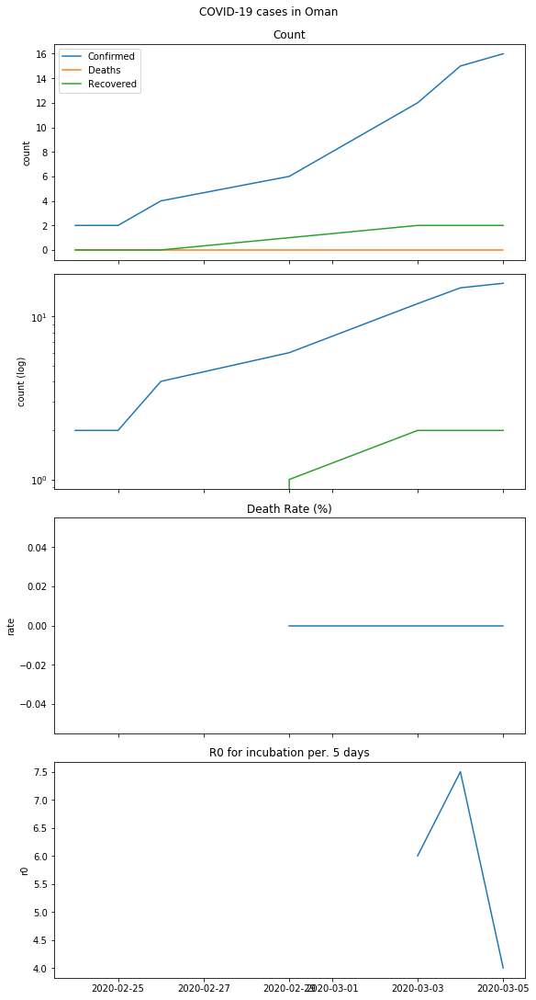

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
421,2020-02-24,Oman,2.0,0.0,0.0,NaN
440,2020-02-25,Oman,2.0,0.0,0.0,NaN
469,2020-02-26,Oman,4.0,0.0,0.0,NaN
569,2020-02-29,Oman,6.0,0.0,1.0,0.0
699,2020-03-03,Oman,12.0,0.0,2.0,0.0
754,2020-03-04,Oman,15.0,0.0,2.0,0.0
800,2020-03-05,Oman,16.0,0.0,2.0,0.0


,r0
Last Update,
2020-02-24,NaN
2020-02-25,NaN
2020-02-26,NaN
2020-02-29,NaN
2020-03-03,6.0
2020-03-04,7.5
2020-03-05,4.0


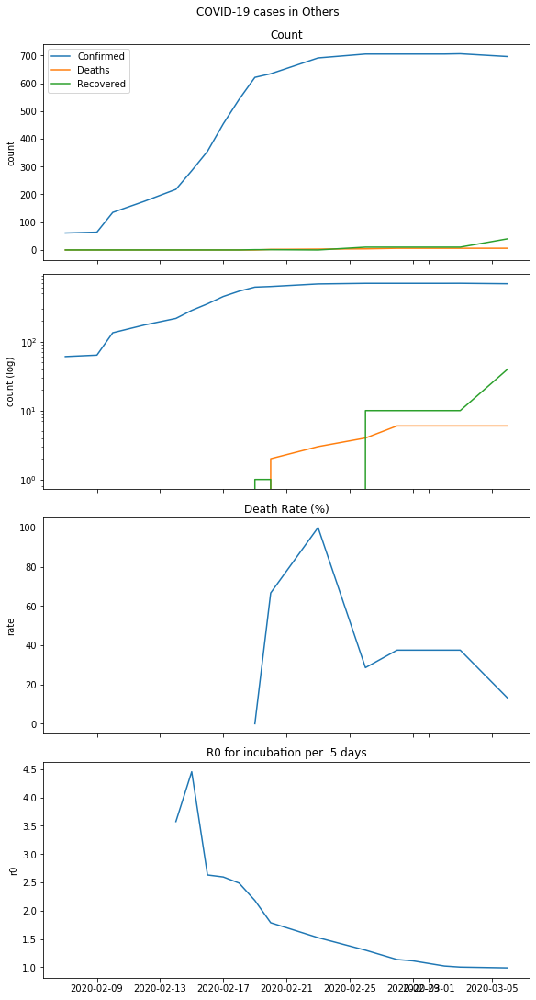

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
233,2020-02-07,Others,61.0,0.0,0.0,NaN
253,2020-02-09,Others,64.0,0.0,0.0,NaN
263,2020-02-10,Others,135.0,0.0,0.0,NaN
288,2020-02-12,Others,175.0,0.0,0.0,NaN
311,2020-02-14,Others,218.0,0.0,0.0,NaN
318,2020-02-15,Others,285.0,0.0,0.0,NaN
329,2020-02-16,Others,355.0,0.0,0.0,NaN
342,2020-02-17,Others,454.0,0.0,0.0,NaN
352,2020-02-18,Others,542.0,0.0,0.0,NaN
360,2020-02-19,Others,621.0,0.0,1.0,0.000000


,r0
Last Update,
2020-02-07,NaN
2020-02-09,NaN
2020-02-10,NaN
2020-02-12,NaN
2020-02-14,3.573770
2020-02-15,4.453125
2020-02-16,2.629630
2020-02-17,2.594286
2020-02-18,2.486239


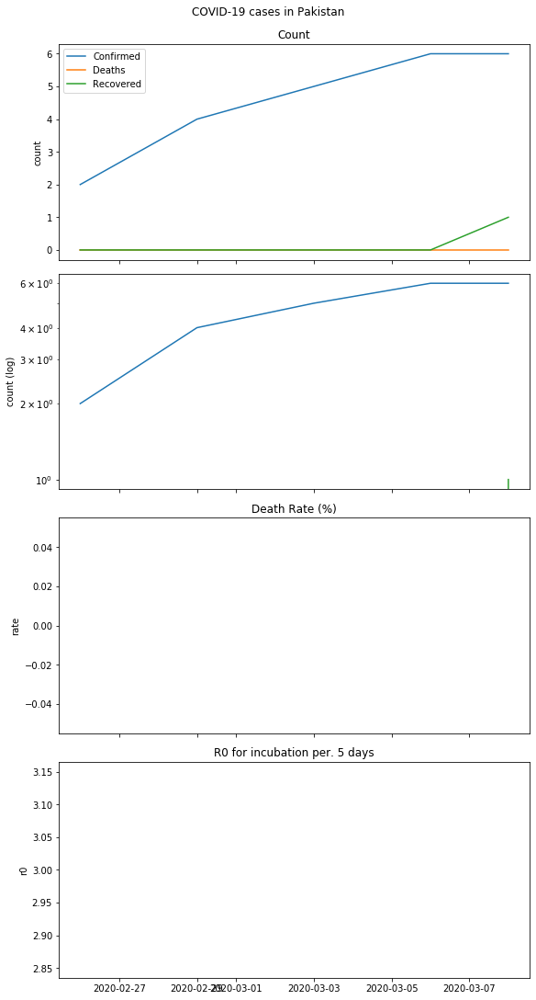

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
471,2020-02-26,Pakistan,2.0,0.0,0.0,NaN
571,2020-02-29,Pakistan,4.0,0.0,0.0,NaN
701,2020-03-03,Pakistan,5.0,0.0,0.0,NaN
862,2020-03-06,Pakistan,6.0,0.0,0.0,NaN
980,2020-03-08,Pakistan,6.0,0.0,1.0,0.0


,r0
Last Update,
2020-02-26,NaN
2020-02-29,NaN
2020-03-03,NaN
2020-03-06,NaN
2020-03-08,3.0


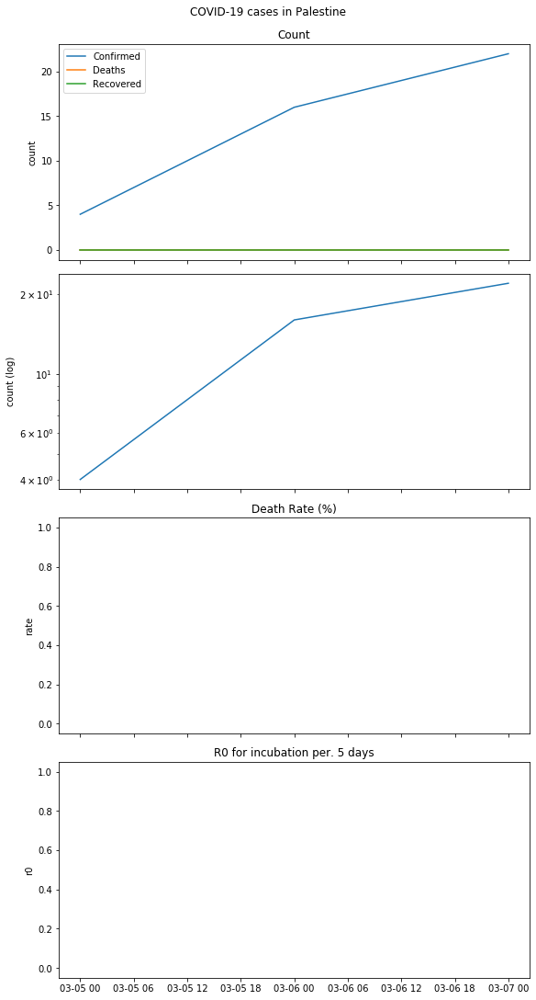

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
801,2020-03-05,Palestine,4.0,0.0,0.0,NaN
863,2020-03-06,Palestine,16.0,0.0,0.0,NaN
917,2020-03-07,Palestine,22.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-05,NaN
2020-03-06,NaN
2020-03-07,NaN


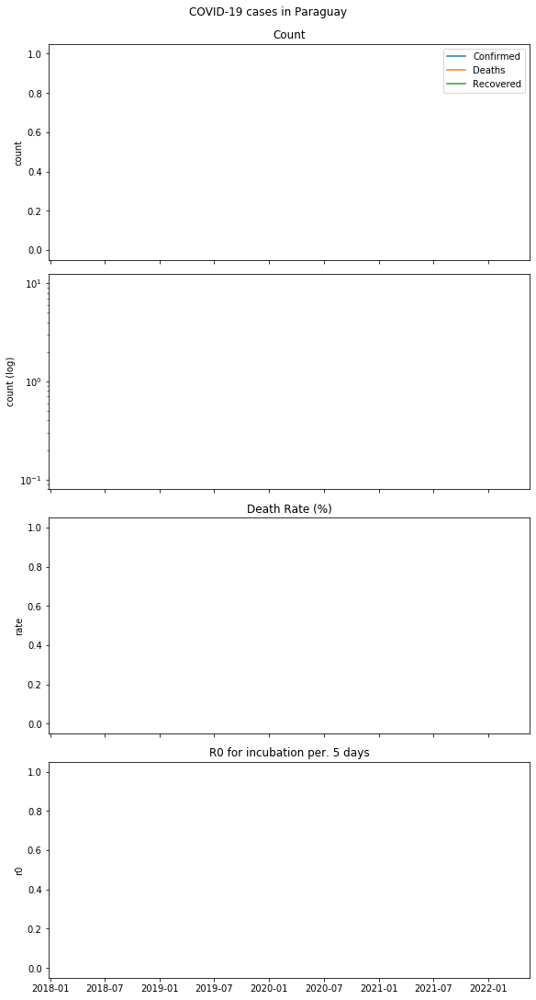

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
981,2020-03-08,Paraguay,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-08,NaN


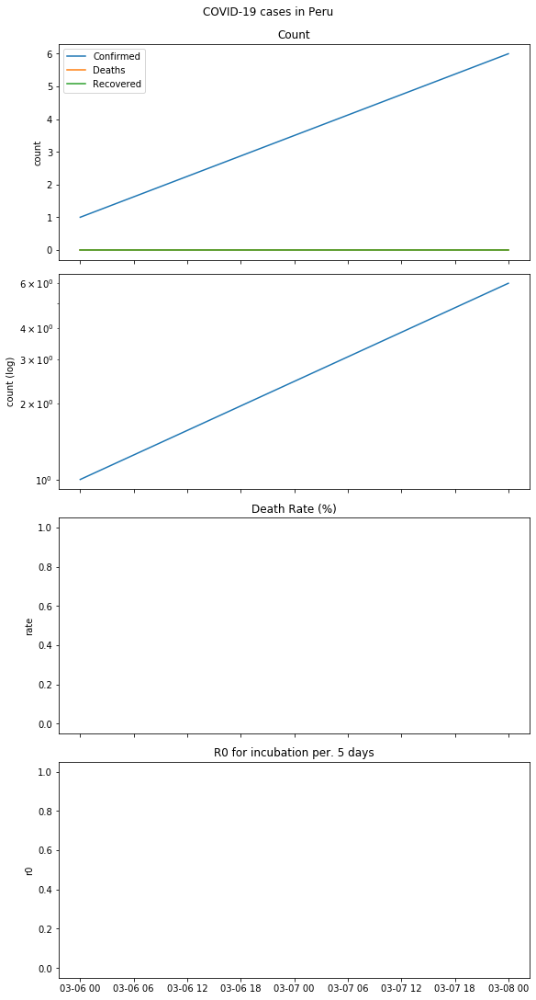

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
864,2020-03-06,Peru,1.0,0.0,0.0,NaN
982,2020-03-08,Peru,6.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN
2020-03-08,NaN


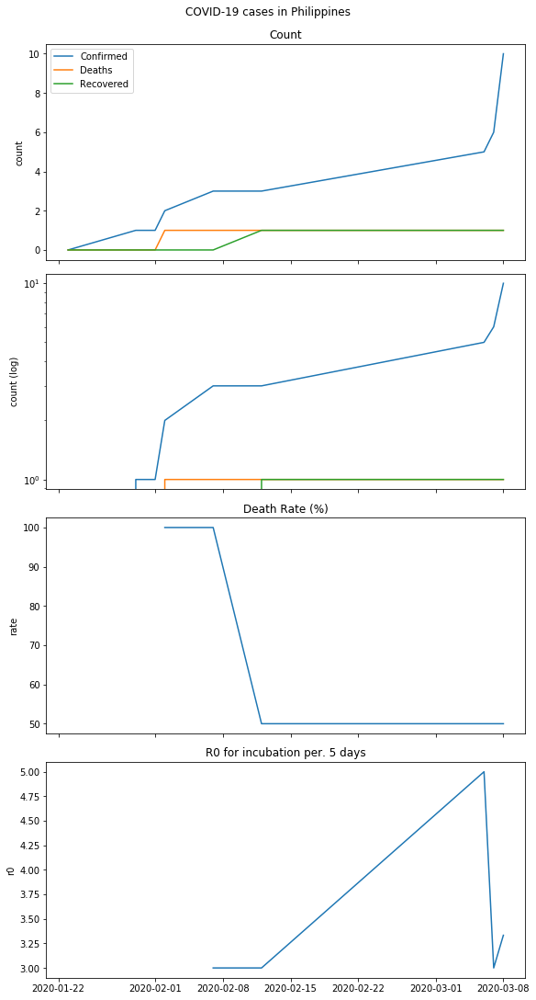

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
17,2020-01-23,Philippines,0.0,0.0,0.0,NaN
133,2020-01-30,Philippines,1.0,0.0,0.0,NaN
156,2020-01-31,Philippines,1.0,0.0,0.0,NaN
175,2020-02-01,Philippines,1.0,0.0,0.0,NaN
189,2020-02-02,Philippines,2.0,1.0,0.0,100.0
234,2020-02-07,Philippines,3.0,1.0,0.0,100.0
289,2020-02-12,Philippines,3.0,1.0,1.0,50.0
865,2020-03-06,Philippines,5.0,1.0,1.0,50.0
918,2020-03-07,Philippines,6.0,1.0,1.0,50.0
983,2020-03-08,Philippines,10.0,1.0,1.0,50.0


,r0
Last Update,
2020-01-23,NaN
2020-01-30,NaN
2020-01-31,NaN
2020-02-01,NaN
2020-02-02,inf
2020-02-07,3.000000
2020-02-12,3.000000
2020-03-06,5.000000
2020-03-07,3.000000


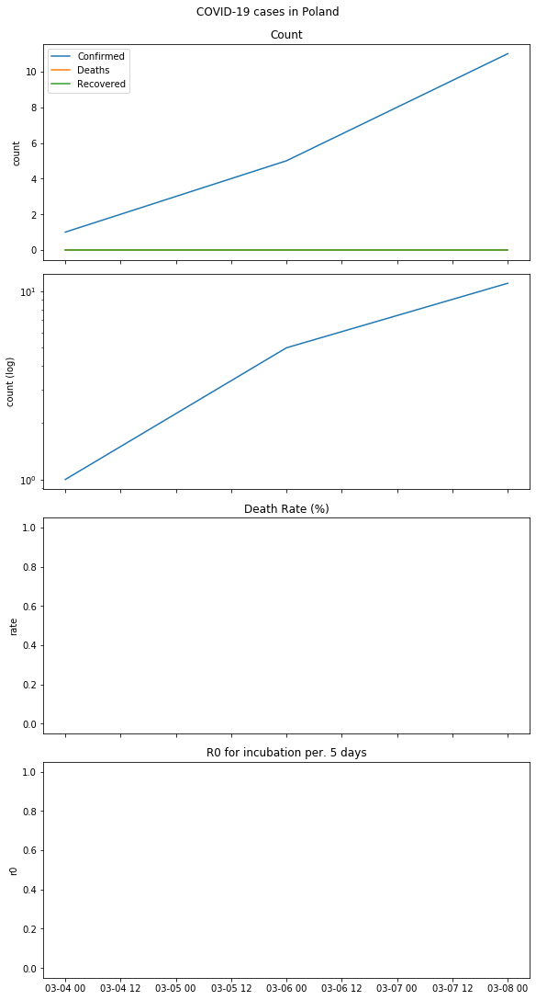

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
755,2020-03-04,Poland,1.0,0.0,0.0,NaN
866,2020-03-06,Poland,5.0,0.0,0.0,NaN
984,2020-03-08,Poland,11.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-04,NaN
2020-03-06,NaN
2020-03-08,NaN


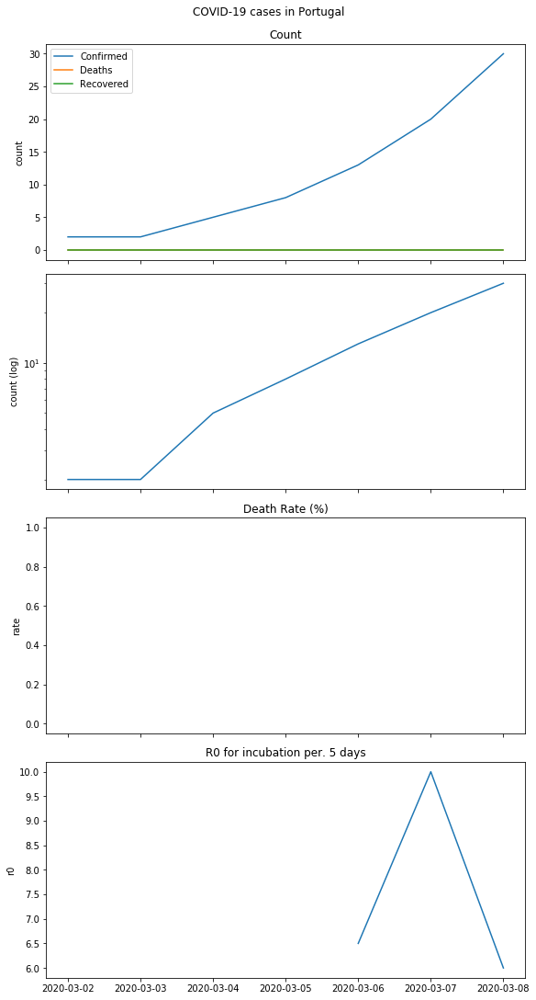

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
654,2020-03-02,Portugal,2.0,0.0,0.0,NaN
702,2020-03-03,Portugal,2.0,0.0,0.0,NaN
756,2020-03-04,Portugal,5.0,0.0,0.0,NaN
802,2020-03-05,Portugal,8.0,0.0,0.0,NaN
867,2020-03-06,Portugal,13.0,0.0,0.0,NaN
919,2020-03-07,Portugal,20.0,0.0,0.0,NaN
985,2020-03-08,Portugal,30.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-02,NaN
2020-03-03,NaN
2020-03-04,NaN
2020-03-05,NaN
2020-03-06,6.5
2020-03-07,10.0
2020-03-08,6.0


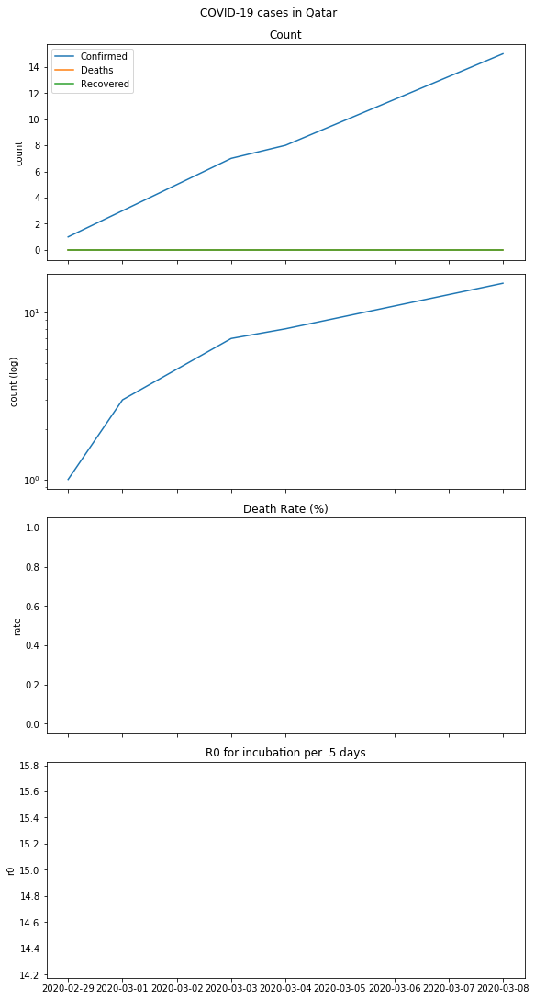

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
572,2020-02-29,Qatar,1.0,0.0,0.0,NaN
616,2020-03-01,Qatar,3.0,0.0,0.0,NaN
703,2020-03-03,Qatar,7.0,0.0,0.0,NaN
757,2020-03-04,Qatar,8.0,0.0,0.0,NaN
986,2020-03-08,Qatar,15.0,0.0,0.0,NaN


,r0
Last Update,
2020-02-29,NaN
2020-03-01,NaN
2020-03-03,NaN
2020-03-04,NaN
2020-03-08,15.0


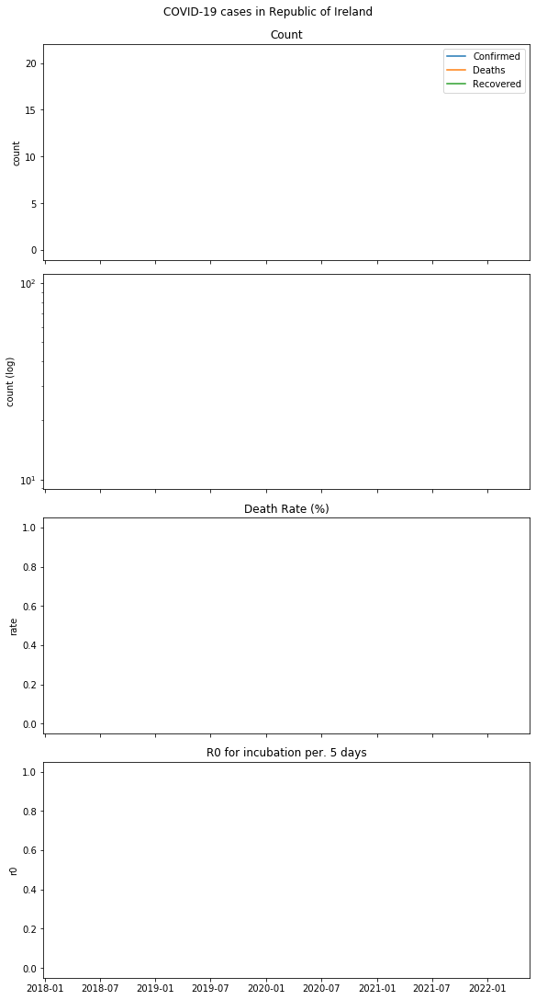

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
987,2020-03-08,Republic of Ireland,21.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-08,NaN


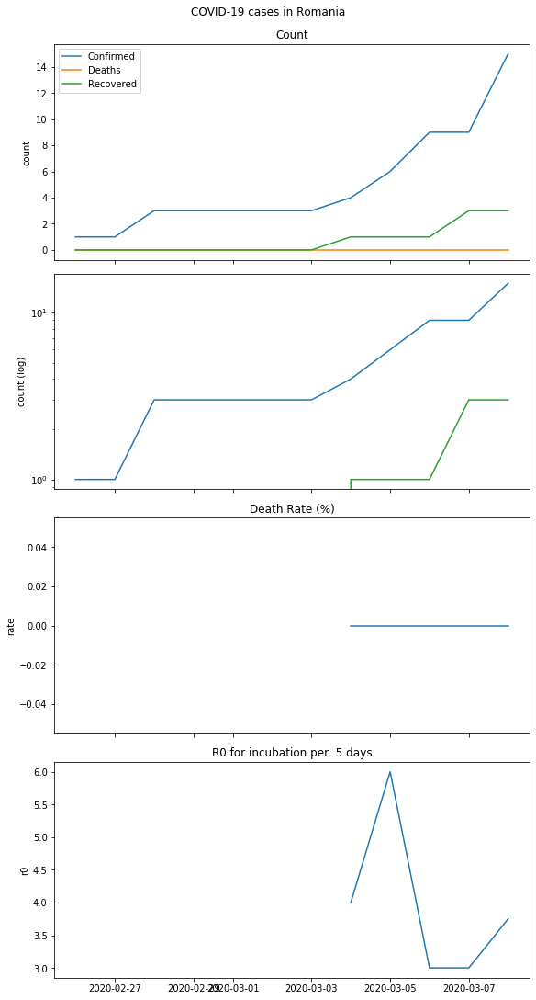

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
472,2020-02-26,Romania,1.0,0.0,0.0,NaN
502,2020-02-27,Romania,1.0,0.0,0.0,NaN
535,2020-02-28,Romania,3.0,0.0,0.0,NaN
704,2020-03-03,Romania,3.0,0.0,0.0,NaN
758,2020-03-04,Romania,4.0,0.0,1.0,0.0
803,2020-03-05,Romania,6.0,0.0,1.0,0.0
868,2020-03-06,Romania,9.0,0.0,1.0,0.0
920,2020-03-07,Romania,9.0,0.0,3.0,0.0
988,2020-03-08,Romania,15.0,0.0,3.0,0.0


,r0
Last Update,
2020-02-26,NaN
2020-02-27,NaN
2020-02-28,NaN
2020-03-03,NaN
2020-03-04,4.00
2020-03-05,6.00
2020-03-06,3.00
2020-03-07,3.00
2020-03-08,3.75


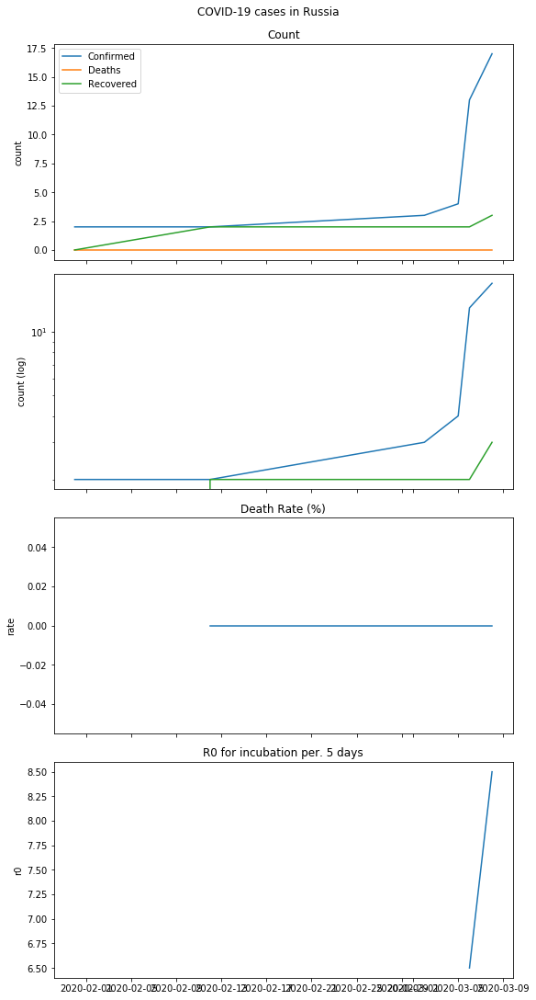

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
157,2020-01-31,Russia,2.0,0.0,0.0,NaN
290,2020-02-12,Russia,2.0,0.0,2.0,0.0
655,2020-03-02,Russia,3.0,0.0,2.0,0.0
804,2020-03-05,Russia,4.0,0.0,2.0,0.0
869,2020-03-06,Russia,13.0,0.0,2.0,0.0
989,2020-03-08,Russia,17.0,0.0,3.0,0.0


,r0
Last Update,
2020-01-31,NaN
2020-02-12,NaN
2020-03-02,NaN
2020-03-05,NaN
2020-03-06,6.5
2020-03-08,8.5


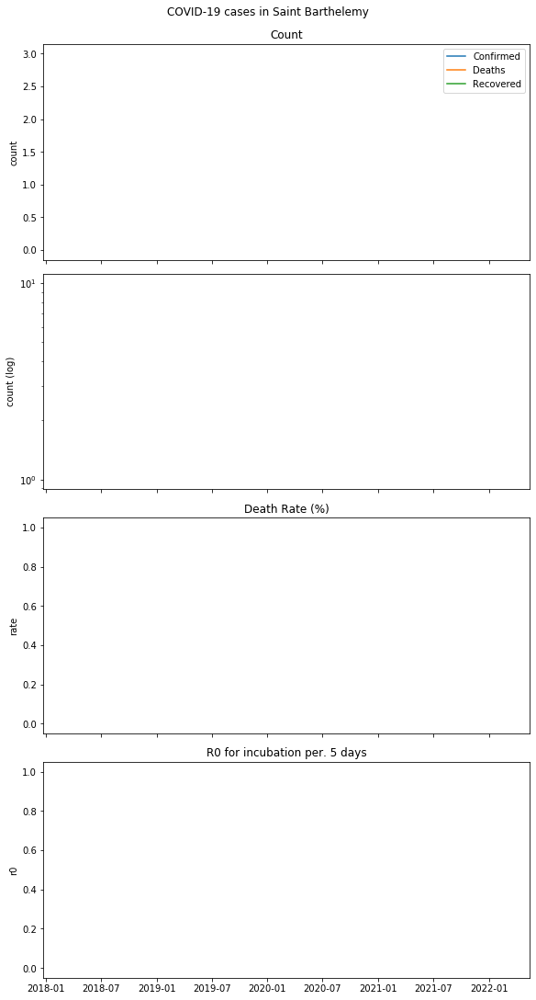

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
759,2020-03-04,Saint Barthelemy,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-04,NaN


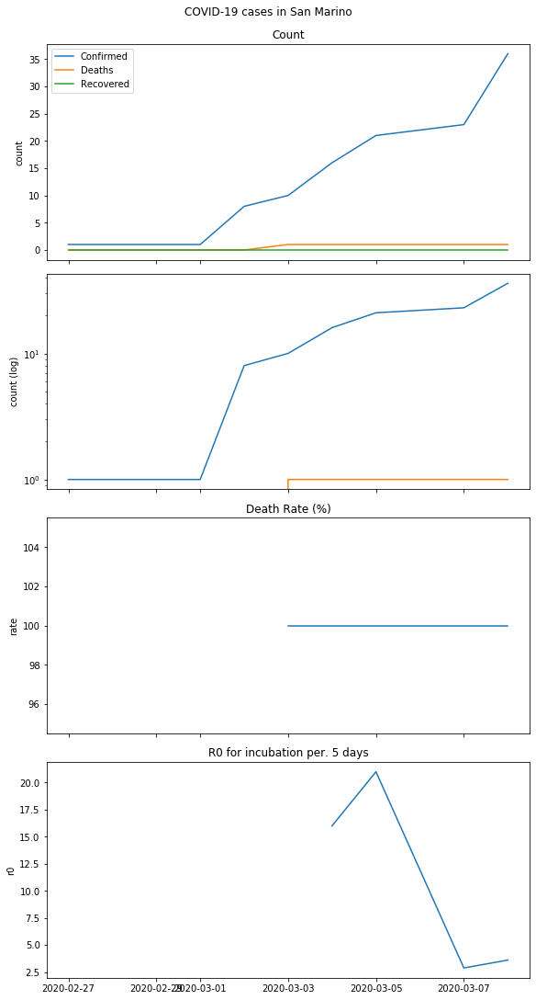

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
503,2020-02-27,San Marino,1.0,0.0,0.0,NaN
617,2020-03-01,San Marino,1.0,0.0,0.0,NaN
656,2020-03-02,San Marino,8.0,0.0,0.0,NaN
705,2020-03-03,San Marino,10.0,1.0,0.0,100.0
760,2020-03-04,San Marino,16.0,1.0,0.0,100.0
805,2020-03-05,San Marino,21.0,1.0,0.0,100.0
921,2020-03-07,San Marino,23.0,1.0,0.0,100.0
990,2020-03-08,San Marino,36.0,1.0,0.0,100.0


,r0
Last Update,
2020-02-27,NaN
2020-03-01,NaN
2020-03-02,NaN
2020-03-03,NaN
2020-03-04,16.000
2020-03-05,21.000
2020-03-07,2.875
2020-03-08,3.600


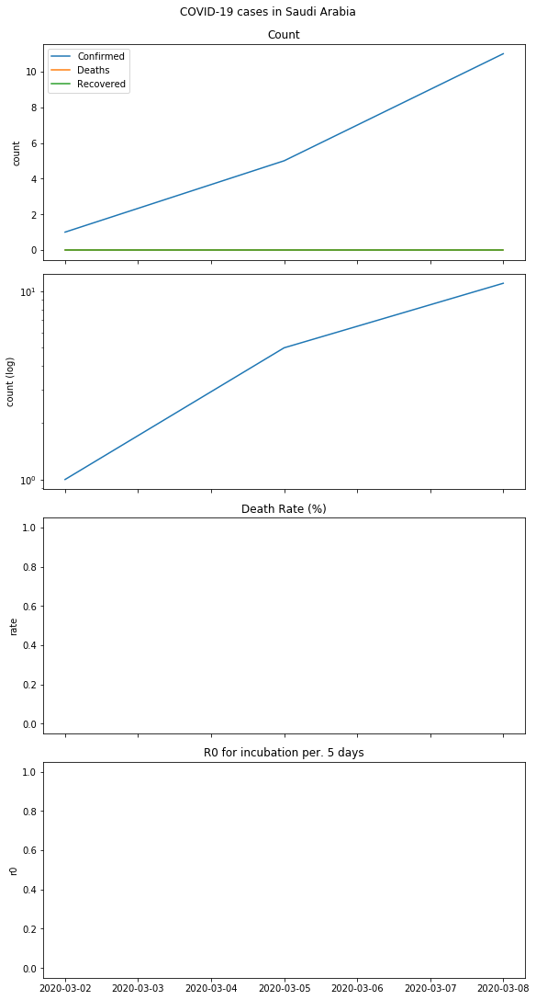

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
657,2020-03-02,Saudi Arabia,1.0,0.0,0.0,NaN
806,2020-03-05,Saudi Arabia,5.0,0.0,0.0,NaN
991,2020-03-08,Saudi Arabia,11.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-02,NaN
2020-03-05,NaN
2020-03-08,NaN


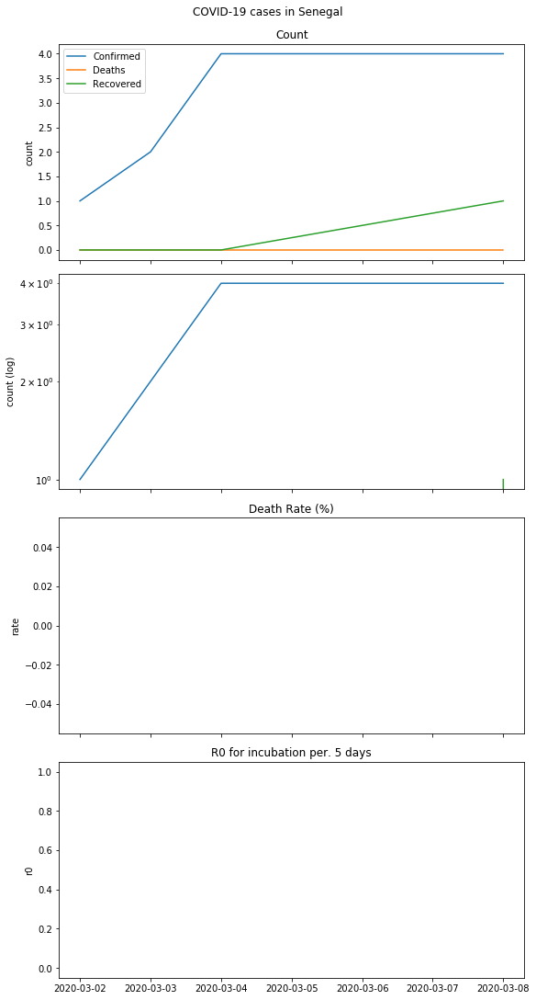

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
658,2020-03-02,Senegal,1.0,0.0,0.0,NaN
706,2020-03-03,Senegal,2.0,0.0,0.0,NaN
761,2020-03-04,Senegal,4.0,0.0,0.0,NaN
992,2020-03-08,Senegal,4.0,0.0,1.0,0.0


,r0
Last Update,
2020-03-02,NaN
2020-03-03,NaN
2020-03-04,NaN
2020-03-08,NaN


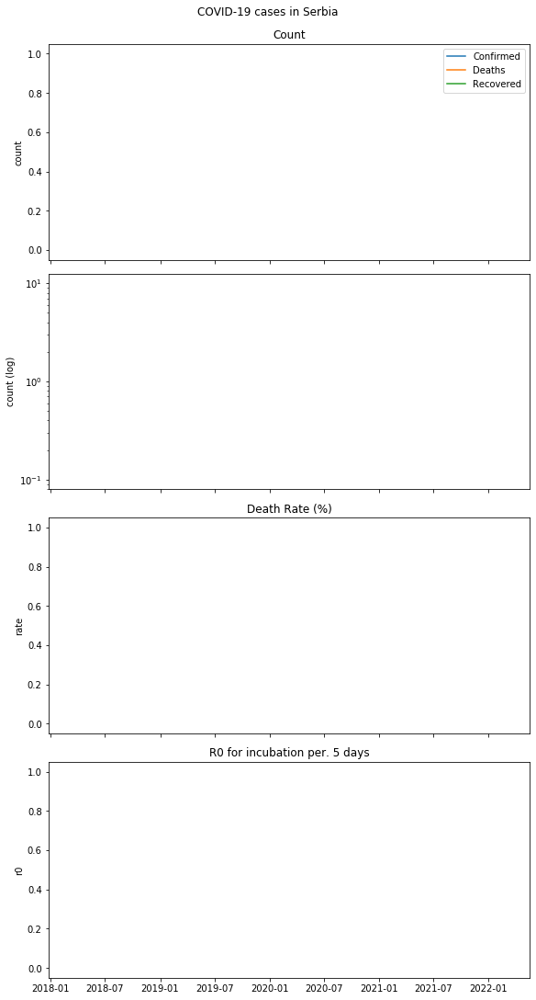

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
870,2020-03-06,Serbia,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN


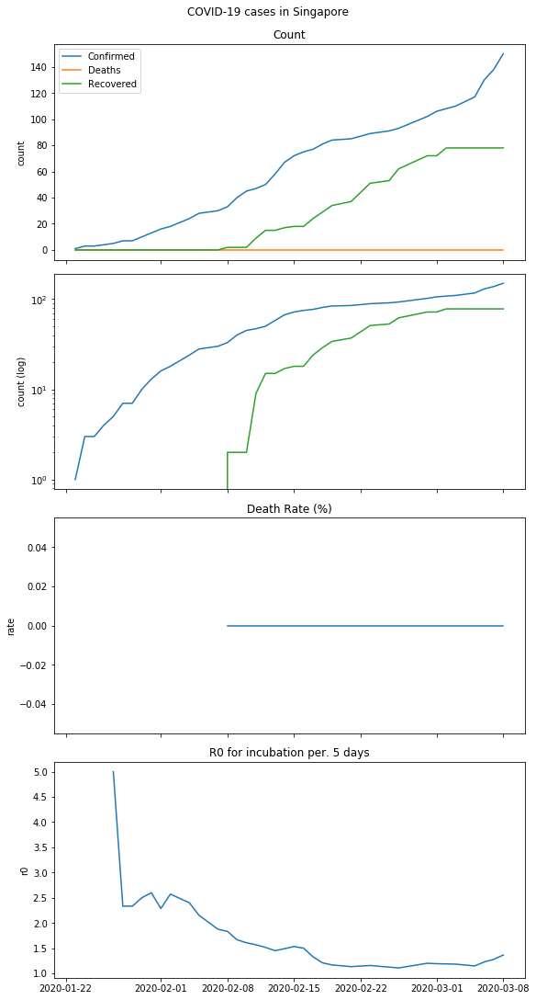

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
18,2020-01-23,Singapore,1.0,0.0,0.0,NaN
29,2020-01-24,Singapore,3.0,0.0,0.0,NaN
43,2020-01-25,Singapore,3.0,0.0,0.0,NaN
58,2020-01-26,Singapore,4.0,0.0,0.0,NaN
75,2020-01-27,Singapore,5.0,0.0,0.0,NaN
93,2020-01-28,Singapore,7.0,0.0,0.0,NaN
112,2020-01-29,Singapore,7.0,0.0,0.0,NaN
134,2020-01-30,Singapore,10.0,0.0,0.0,NaN
158,2020-01-31,Singapore,13.0,0.0,0.0,NaN
176,2020-02-01,Singapore,16.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,NaN
2020-01-27,5.000000
2020-01-28,2.333333
2020-01-29,2.333333
2020-01-30,2.500000
2020-01-31,2.600000


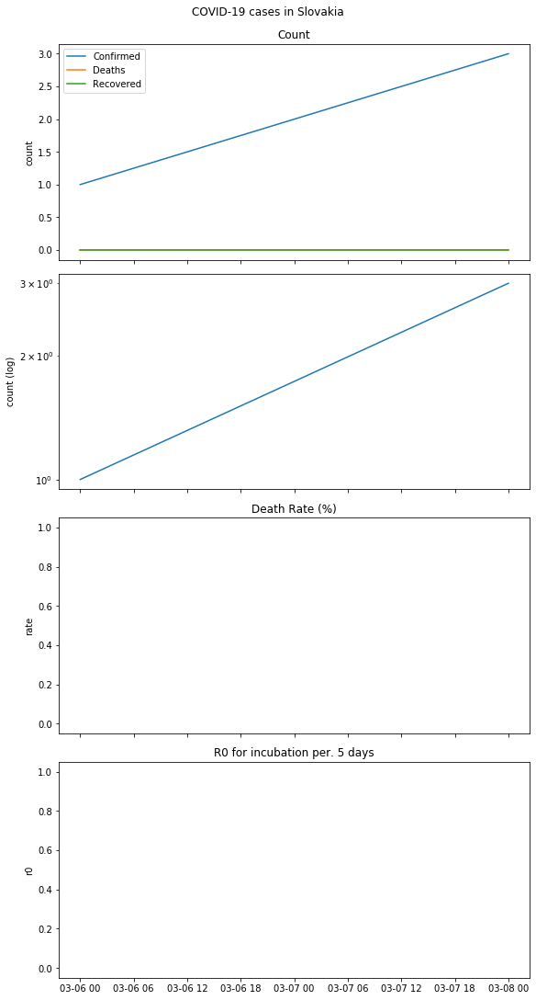

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
872,2020-03-06,Slovakia,1.0,0.0,0.0,NaN
994,2020-03-08,Slovakia,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN
2020-03-08,NaN


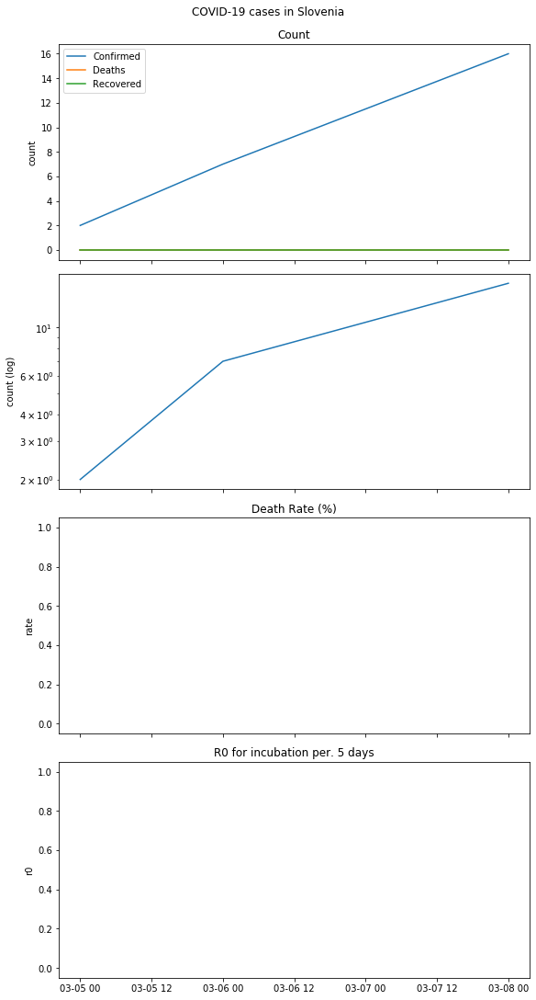

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
808,2020-03-05,Slovenia,2.0,0.0,0.0,NaN
873,2020-03-06,Slovenia,7.0,0.0,0.0,NaN
995,2020-03-08,Slovenia,16.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-05,NaN
2020-03-06,NaN
2020-03-08,NaN


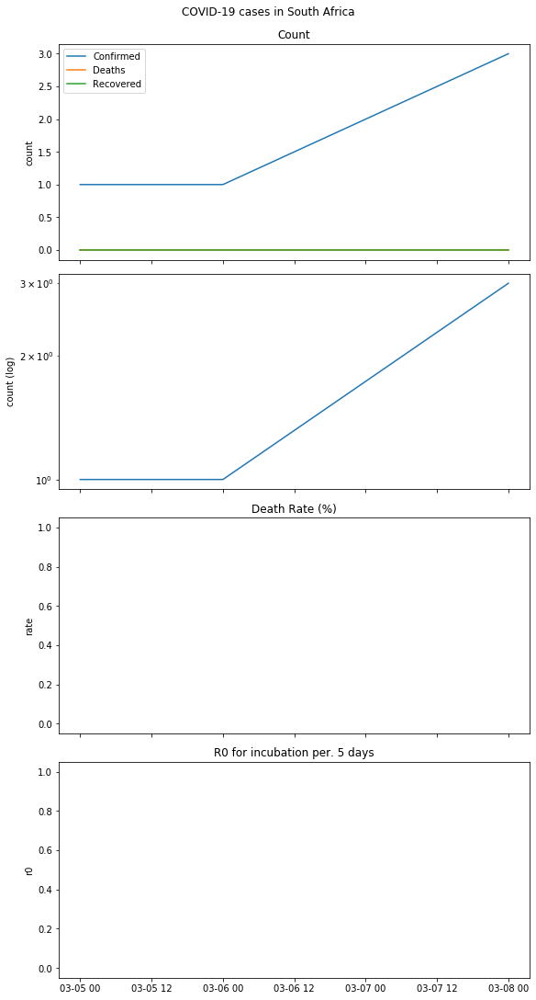

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
809,2020-03-05,South Africa,1.0,0.0,0.0,NaN
874,2020-03-06,South Africa,1.0,0.0,0.0,NaN
996,2020-03-08,South Africa,3.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-05,NaN
2020-03-06,NaN
2020-03-08,NaN


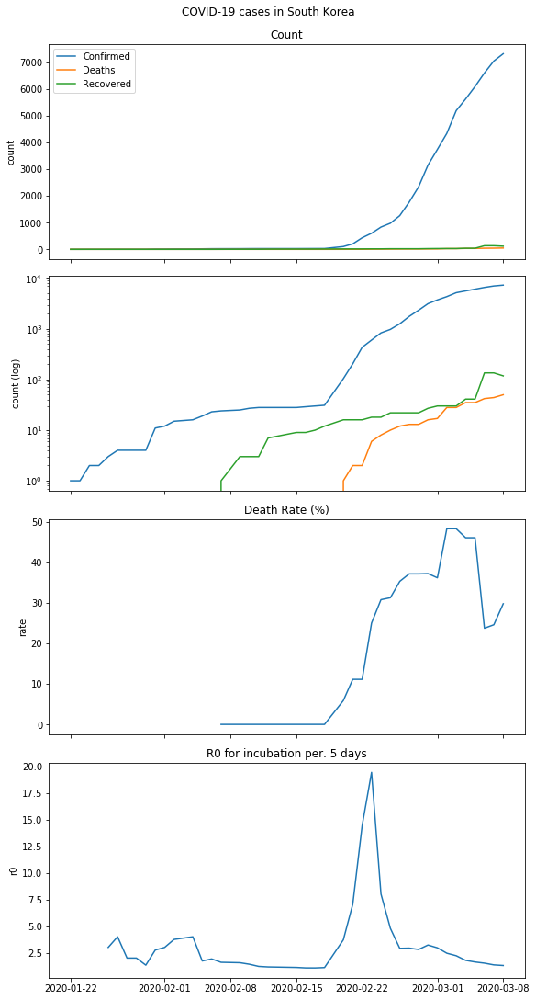

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
4,2020-01-22,South Korea,1.0,0.0,0.0,NaN
19,2020-01-23,South Korea,1.0,0.0,0.0,NaN
30,2020-01-24,South Korea,2.0,0.0,0.0,NaN
44,2020-01-25,South Korea,2.0,0.0,0.0,NaN
59,2020-01-26,South Korea,3.0,0.0,0.0,NaN
76,2020-01-27,South Korea,4.0,0.0,0.0,NaN
94,2020-01-28,South Korea,4.0,0.0,0.0,NaN
113,2020-01-29,South Korea,4.0,0.0,0.0,NaN
135,2020-01-30,South Korea,4.0,0.0,0.0,NaN
159,2020-01-31,South Korea,11.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,3.000000
2020-01-27,4.000000
2020-01-28,2.000000
2020-01-29,2.000000
2020-01-30,1.333333


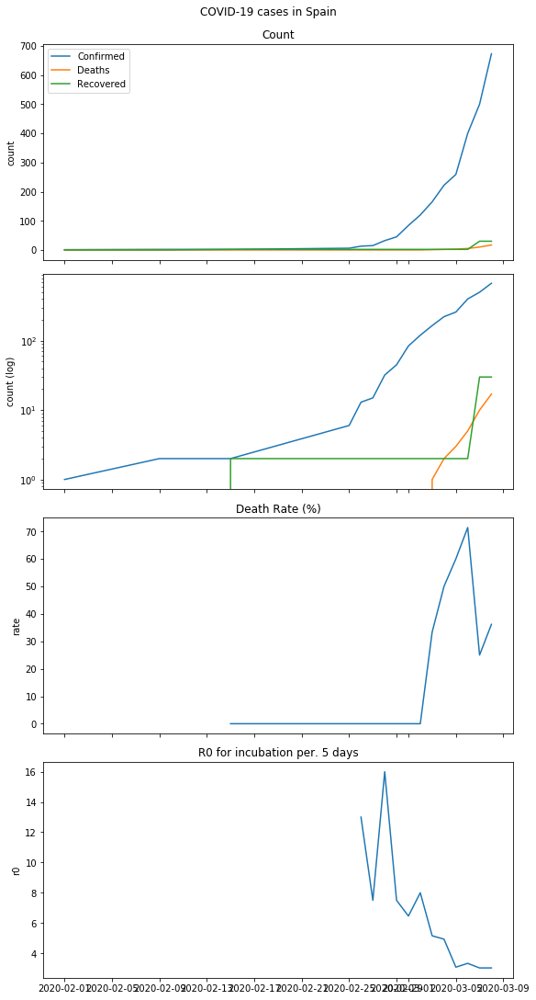

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
178,2020-02-01,Spain,1.0,0.0,0.0,NaN
256,2020-02-09,Spain,2.0,0.0,0.0,NaN
321,2020-02-15,Spain,2.0,0.0,2.0,0.000000
443,2020-02-25,Spain,6.0,0.0,2.0,0.000000
475,2020-02-26,Spain,13.0,0.0,2.0,0.000000
505,2020-02-27,Spain,15.0,0.0,2.0,0.000000
537,2020-02-28,Spain,32.0,0.0,2.0,0.000000
575,2020-02-29,Spain,45.0,0.0,2.0,0.000000
620,2020-03-01,Spain,84.0,0.0,2.0,0.000000
661,2020-03-02,Spain,120.0,0.0,2.0,0.000000


,r0
Last Update,
2020-02-01,NaN
2020-02-09,NaN
2020-02-15,NaN
2020-02-25,NaN
2020-02-26,13.000000
2020-02-27,7.500000
2020-02-28,16.000000
2020-02-29,7.500000
2020-03-01,6.461538


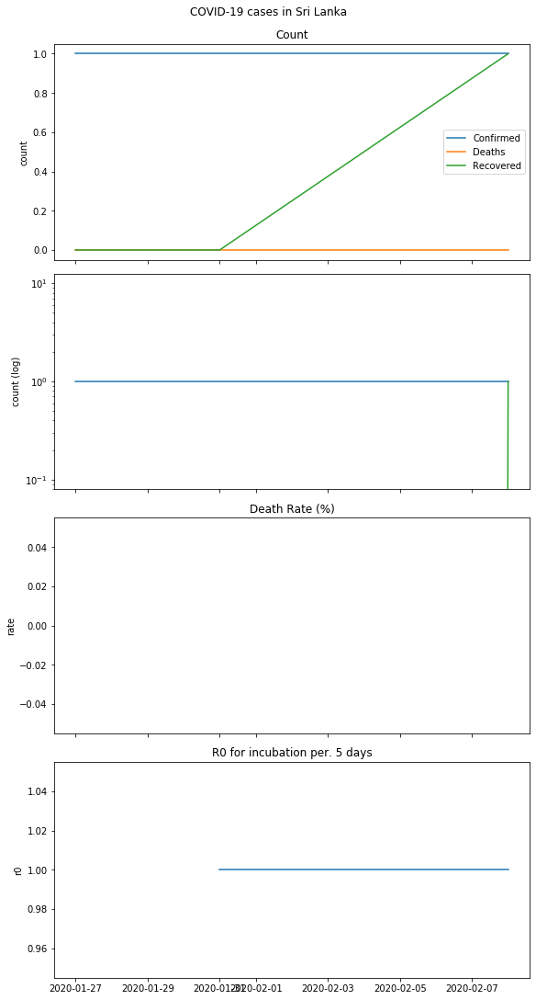

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
77,2020-01-27,Sri Lanka,1.0,0.0,0.0,NaN
95,2020-01-28,Sri Lanka,1.0,0.0,0.0,NaN
114,2020-01-29,Sri Lanka,1.0,0.0,0.0,NaN
136,2020-01-30,Sri Lanka,1.0,0.0,0.0,NaN
160,2020-01-31,Sri Lanka,1.0,0.0,0.0,NaN
243,2020-02-08,Sri Lanka,1.0,0.0,1.0,0.0


,r0
Last Update,
2020-01-27,NaN
2020-01-28,NaN
2020-01-29,NaN
2020-01-30,NaN
2020-01-31,1.0
2020-02-08,1.0


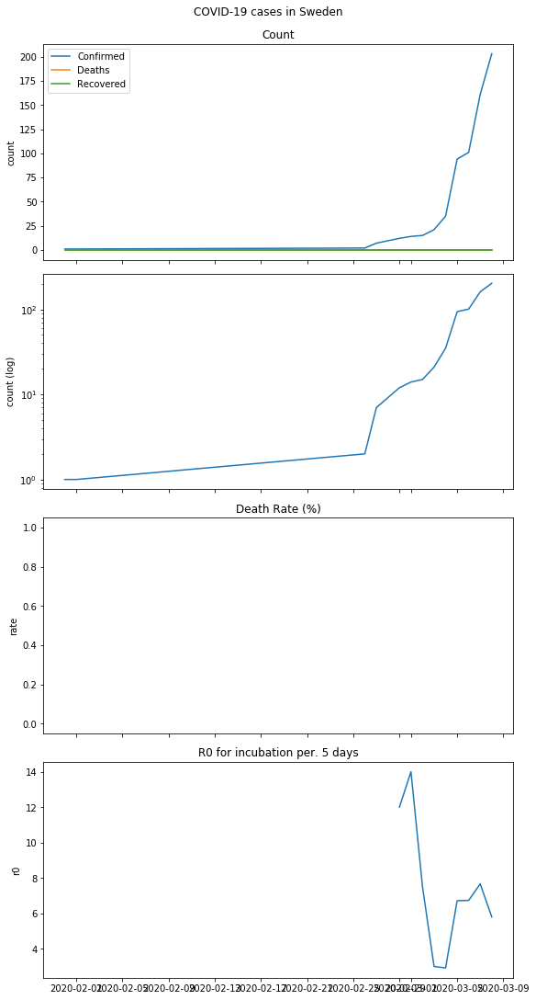

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
161,2020-01-31,Sweden,1.0,0.0,0.0,NaN
179,2020-02-01,Sweden,1.0,0.0,0.0,NaN
476,2020-02-26,Sweden,2.0,0.0,0.0,NaN
506,2020-02-27,Sweden,7.0,0.0,0.0,NaN
576,2020-02-29,Sweden,12.0,0.0,0.0,NaN
621,2020-03-01,Sweden,14.0,0.0,0.0,NaN
662,2020-03-02,Sweden,15.0,0.0,0.0,NaN
710,2020-03-03,Sweden,21.0,0.0,0.0,NaN
764,2020-03-04,Sweden,35.0,0.0,0.0,NaN
812,2020-03-05,Sweden,94.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-31,NaN
2020-02-01,NaN
2020-02-26,NaN
2020-02-27,NaN
2020-02-29,12.000000
2020-03-01,14.000000
2020-03-02,7.500000
2020-03-03,3.000000
2020-03-04,2.916667


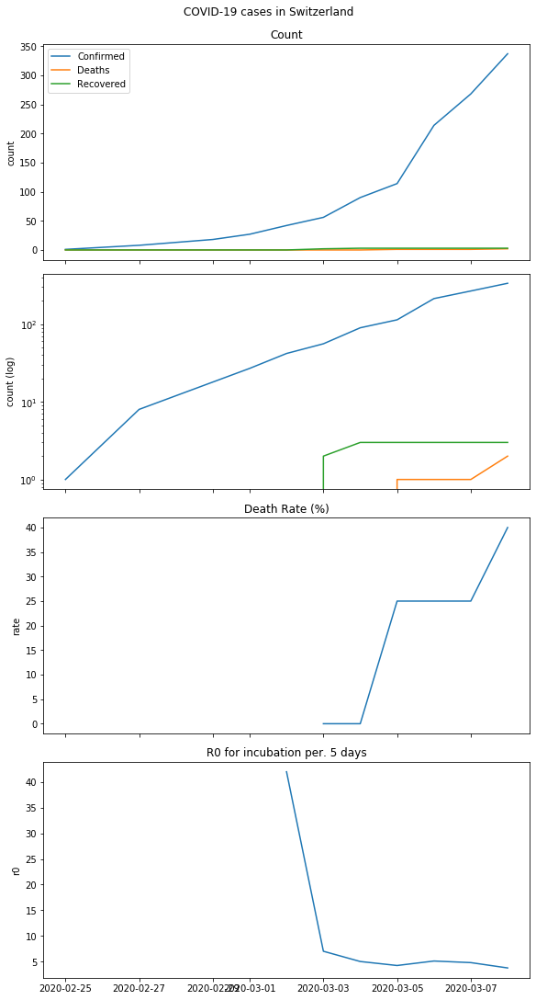

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
444,2020-02-25,Switzerland,1.0,0.0,0.0,NaN
507,2020-02-27,Switzerland,8.0,0.0,0.0,NaN
577,2020-02-29,Switzerland,18.0,0.0,0.0,NaN
622,2020-03-01,Switzerland,27.0,0.0,0.0,NaN
663,2020-03-02,Switzerland,42.0,0.0,0.0,NaN
711,2020-03-03,Switzerland,56.0,0.0,2.0,0.0
765,2020-03-04,Switzerland,90.0,0.0,3.0,0.0
813,2020-03-05,Switzerland,114.0,1.0,3.0,25.0
878,2020-03-06,Switzerland,214.0,1.0,3.0,25.0
926,2020-03-07,Switzerland,268.0,1.0,3.0,25.0


,r0
Last Update,
2020-02-25,NaN
2020-02-27,NaN
2020-02-29,NaN
2020-03-01,NaN
2020-03-02,42.000000
2020-03-03,7.000000
2020-03-04,5.000000
2020-03-05,4.222222
2020-03-06,5.095238


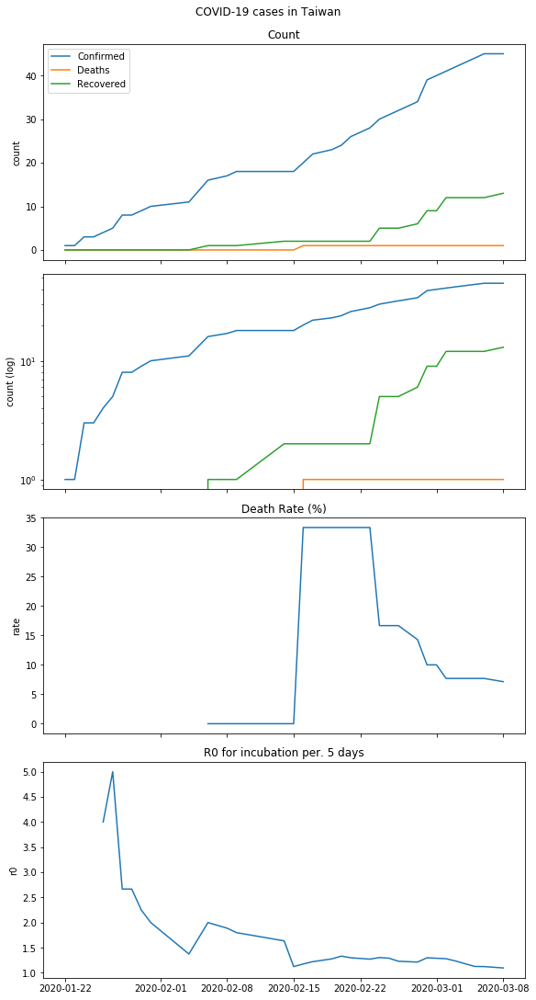

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
5,2020-01-22,Taiwan,1.0,0.0,0.0,NaN
20,2020-01-23,Taiwan,1.0,0.0,0.0,NaN
31,2020-01-24,Taiwan,3.0,0.0,0.0,NaN
45,2020-01-25,Taiwan,3.0,0.0,0.0,NaN
60,2020-01-26,Taiwan,4.0,0.0,0.0,NaN
78,2020-01-27,Taiwan,5.0,0.0,0.0,NaN
96,2020-01-28,Taiwan,8.0,0.0,0.0,NaN
115,2020-01-29,Taiwan,8.0,0.0,0.0,NaN
137,2020-01-30,Taiwan,9.0,0.0,0.0,NaN
162,2020-01-31,Taiwan,10.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,4.000000
2020-01-27,5.000000
2020-01-28,2.666667
2020-01-29,2.666667
2020-01-30,2.250000


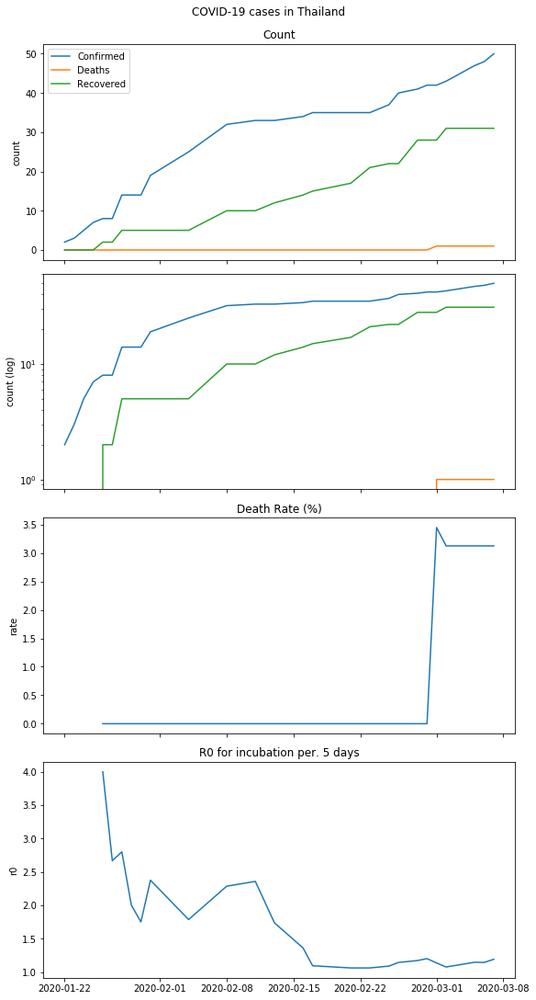

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
6,2020-01-22,Thailand,2.0,0.0,0.0,NaN
21,2020-01-23,Thailand,3.0,0.0,0.0,NaN
32,2020-01-24,Thailand,5.0,0.0,0.0,NaN
46,2020-01-25,Thailand,7.0,0.0,0.0,NaN
61,2020-01-26,Thailand,8.0,0.0,2.0,0.000000
79,2020-01-27,Thailand,8.0,0.0,2.0,0.000000
97,2020-01-28,Thailand,14.0,0.0,5.0,0.000000
116,2020-01-29,Thailand,14.0,0.0,5.0,0.000000
138,2020-01-30,Thailand,14.0,0.0,5.0,0.000000
163,2020-01-31,Thailand,19.0,0.0,5.0,0.000000


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,4.000000
2020-01-27,2.666667
2020-01-28,2.800000
2020-01-29,2.000000
2020-01-30,1.750000


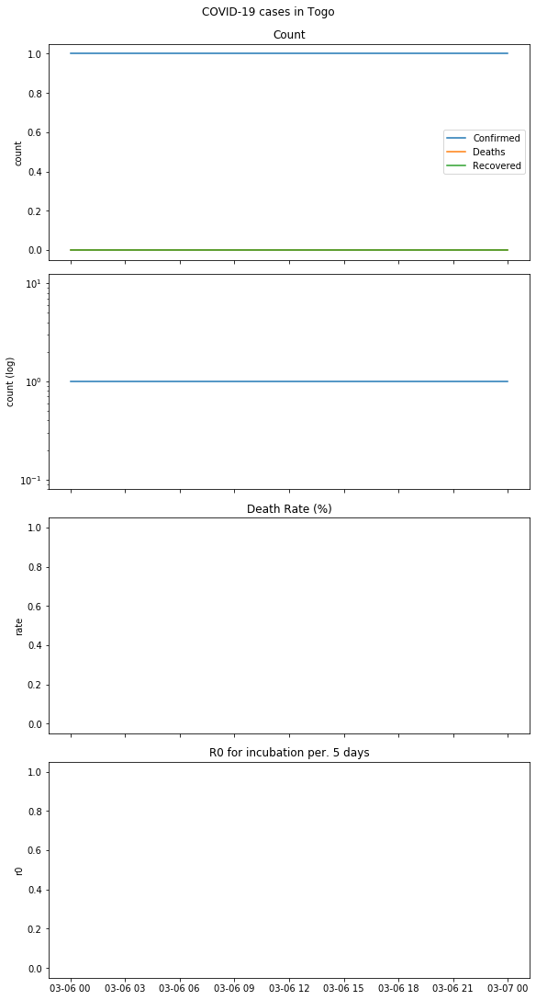

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
881,2020-03-06,Togo,1.0,0.0,0.0,NaN
928,2020-03-07,Togo,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN
2020-03-07,NaN


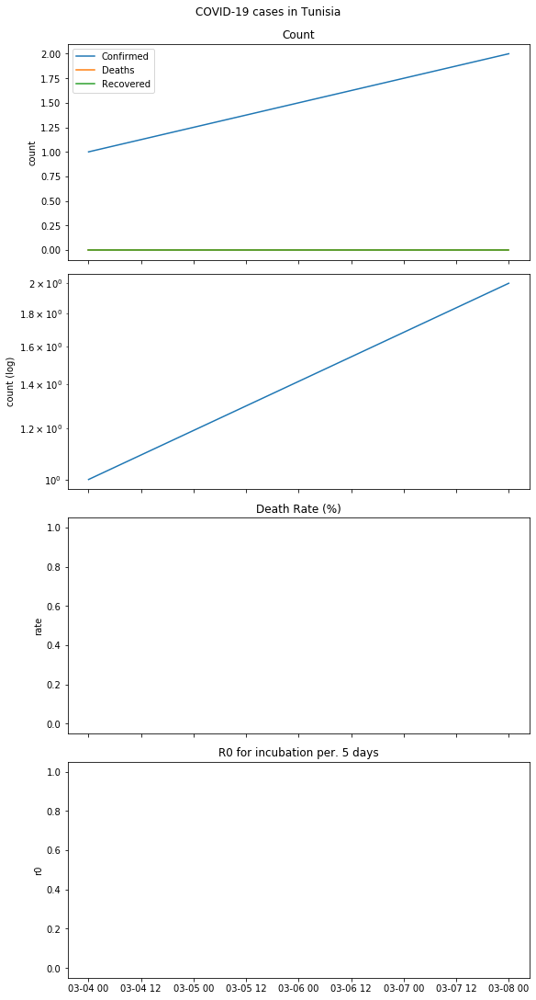

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
766,2020-03-04,Tunisia,1.0,0.0,0.0,NaN
1002,2020-03-08,Tunisia,2.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-04,NaN
2020-03-08,NaN


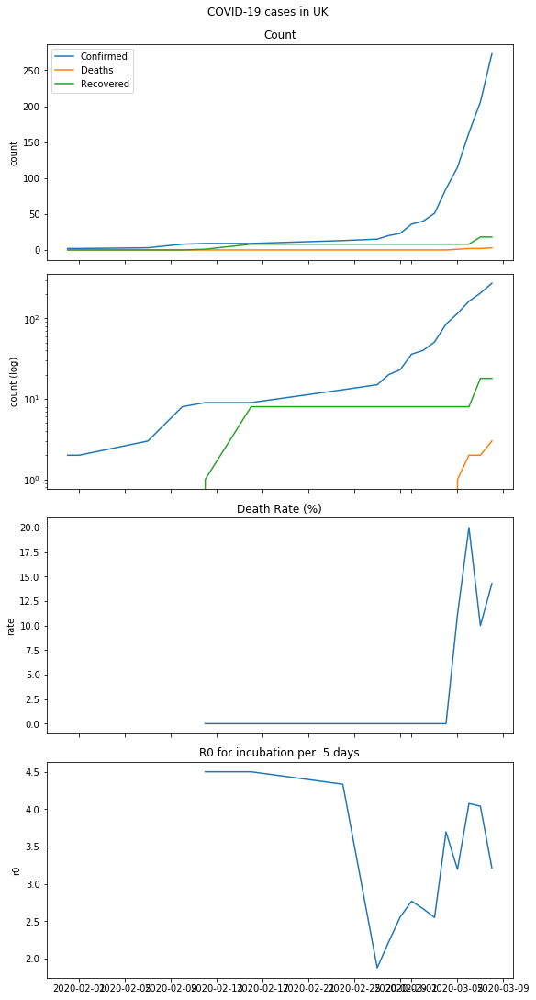

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
164,2020-01-31,UK,2.0,0.0,0.0,NaN
180,2020-02-01,UK,2.0,0.0,0.0,NaN
237,2020-02-07,UK,3.0,0.0,0.0,NaN
266,2020-02-10,UK,8.0,0.0,0.0,NaN
293,2020-02-12,UK,9.0,0.0,1.0,0.000000
334,2020-02-16,UK,9.0,0.0,8.0,0.000000
424,2020-02-24,UK,13.0,0.0,8.0,0.000000
508,2020-02-27,UK,15.0,0.0,8.0,0.000000
540,2020-02-28,UK,20.0,0.0,8.0,0.000000
580,2020-02-29,UK,23.0,0.0,8.0,0.000000


,r0
Last Update,
2020-01-31,NaN
2020-02-01,NaN
2020-02-07,NaN
2020-02-10,NaN
2020-02-12,4.500000
2020-02-16,4.500000
2020-02-24,4.333333
2020-02-27,1.875000
2020-02-28,2.222222


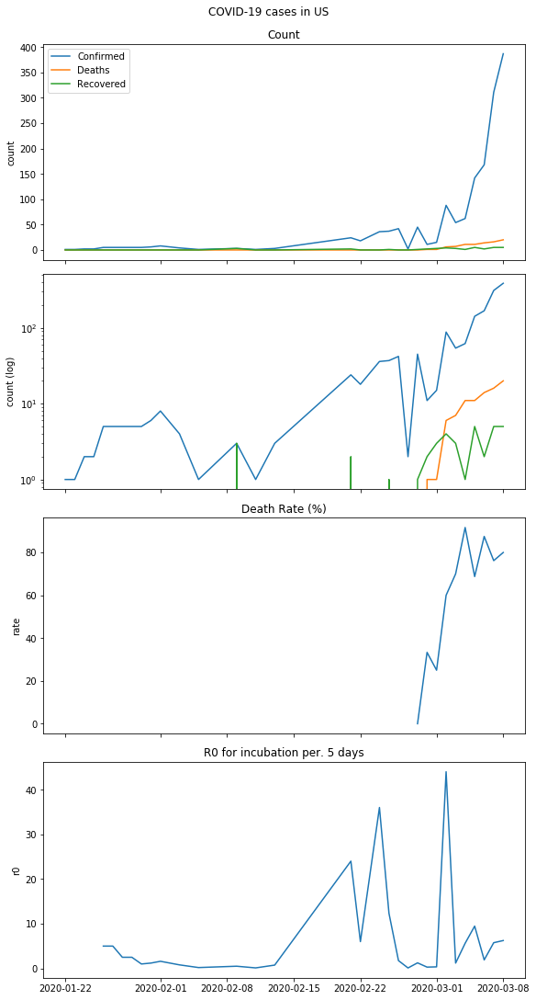

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
7,2020-01-22,US,1.0,0.0,0.0,NaN
22,2020-01-23,US,1.0,0.0,0.0,NaN
33,2020-01-24,US,2.0,0.0,0.0,NaN
47,2020-01-25,US,2.0,0.0,0.0,NaN
62,2020-01-26,US,5.0,0.0,0.0,NaN
80,2020-01-27,US,5.0,0.0,0.0,NaN
98,2020-01-28,US,5.0,0.0,0.0,NaN
117,2020-01-29,US,5.0,0.0,0.0,NaN
139,2020-01-30,US,5.0,0.0,0.0,NaN
165,2020-01-31,US,6.0,0.0,0.0,NaN


,r0
Last Update,
2020-01-22,NaN
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,5.000000
2020-01-27,5.000000
2020-01-28,2.500000
2020-01-29,2.500000
2020-01-30,1.000000


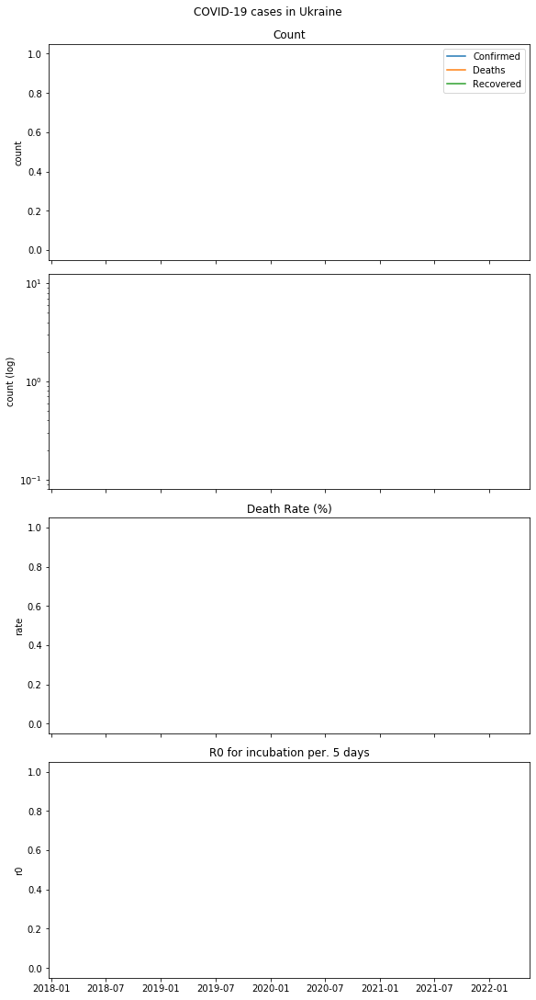

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
715,2020-03-03,Ukraine,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-03,NaN


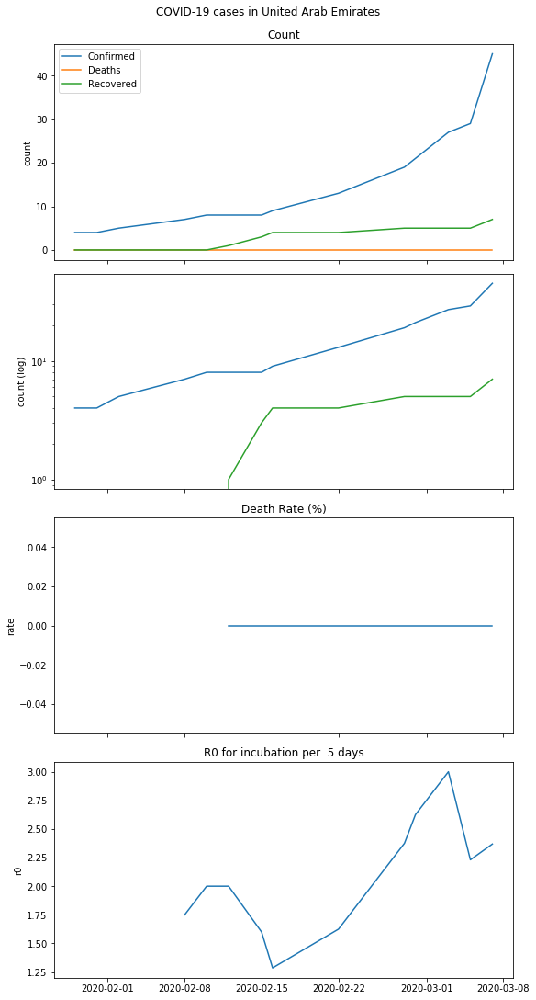

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
118,2020-01-29,United Arab Emirates,4.0,0.0,0.0,NaN
140,2020-01-30,United Arab Emirates,4.0,0.0,0.0,NaN
166,2020-01-31,United Arab Emirates,4.0,0.0,0.0,NaN
192,2020-02-02,United Arab Emirates,5.0,0.0,0.0,NaN
246,2020-02-08,United Arab Emirates,7.0,0.0,0.0,NaN
267,2020-02-10,United Arab Emirates,8.0,0.0,0.0,NaN
294,2020-02-12,United Arab Emirates,8.0,0.0,1.0,0.0
323,2020-02-15,United Arab Emirates,8.0,0.0,3.0,0.0
335,2020-02-16,United Arab Emirates,9.0,0.0,4.0,0.0
398,2020-02-22,United Arab Emirates,13.0,0.0,4.0,0.0


,r0
Last Update,
2020-01-29,NaN
2020-01-30,NaN
2020-01-31,NaN
2020-02-02,NaN
2020-02-08,1.750000
2020-02-10,2.000000
2020-02-12,2.000000
2020-02-15,1.600000
2020-02-16,1.285714


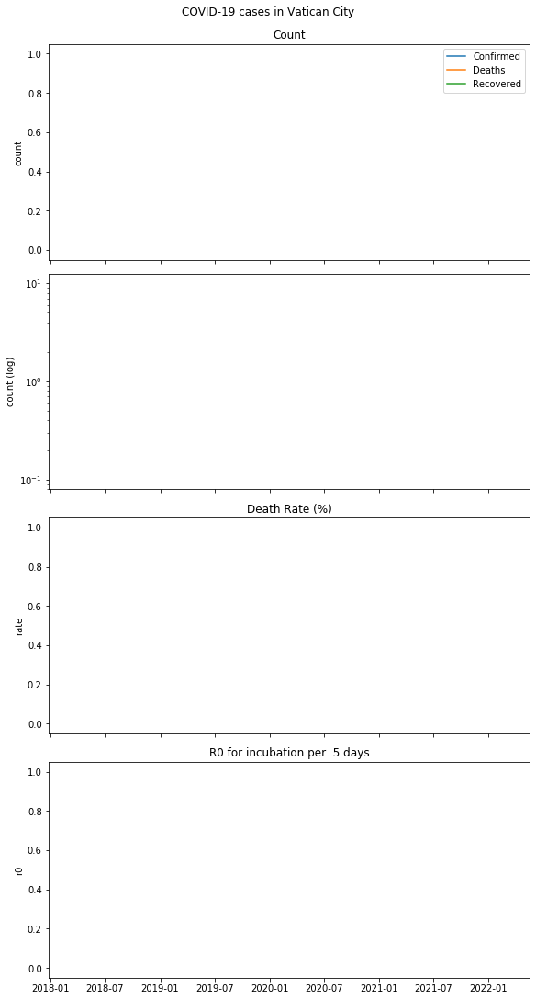

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
884,2020-03-06,Vatican City,1.0,0.0,0.0,NaN


,r0
Last Update,
2020-03-06,NaN


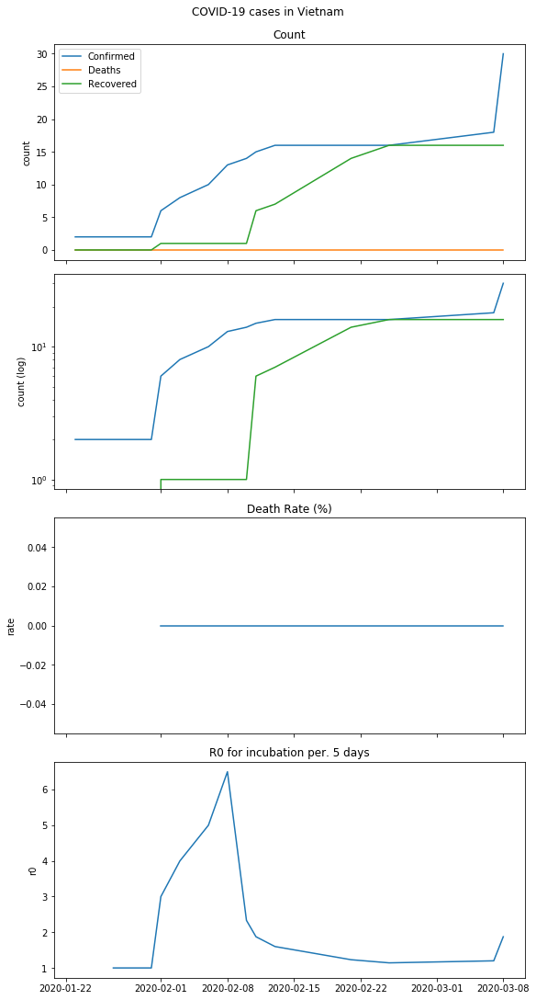

,Last Update,Country/Region,Confirmed,Deaths,Recovered,Death Rate (%)
23,2020-01-23,Vietnam,2.0,0.0,0.0,NaN
34,2020-01-24,Vietnam,2.0,0.0,0.0,NaN
48,2020-01-25,Vietnam,2.0,0.0,0.0,NaN
63,2020-01-26,Vietnam,2.0,0.0,0.0,NaN
81,2020-01-27,Vietnam,2.0,0.0,0.0,NaN
99,2020-01-28,Vietnam,2.0,0.0,0.0,NaN
119,2020-01-29,Vietnam,2.0,0.0,0.0,NaN
141,2020-01-30,Vietnam,2.0,0.0,0.0,NaN
167,2020-01-31,Vietnam,2.0,0.0,0.0,NaN
182,2020-02-01,Vietnam,6.0,0.0,1.0,0.0


,r0
Last Update,
2020-01-23,NaN
2020-01-24,NaN
2020-01-25,NaN
2020-01-26,NaN
2020-01-27,1.000000
2020-01-28,1.000000
2020-01-29,1.000000
2020-01-30,1.000000
2020-01-31,1.000000


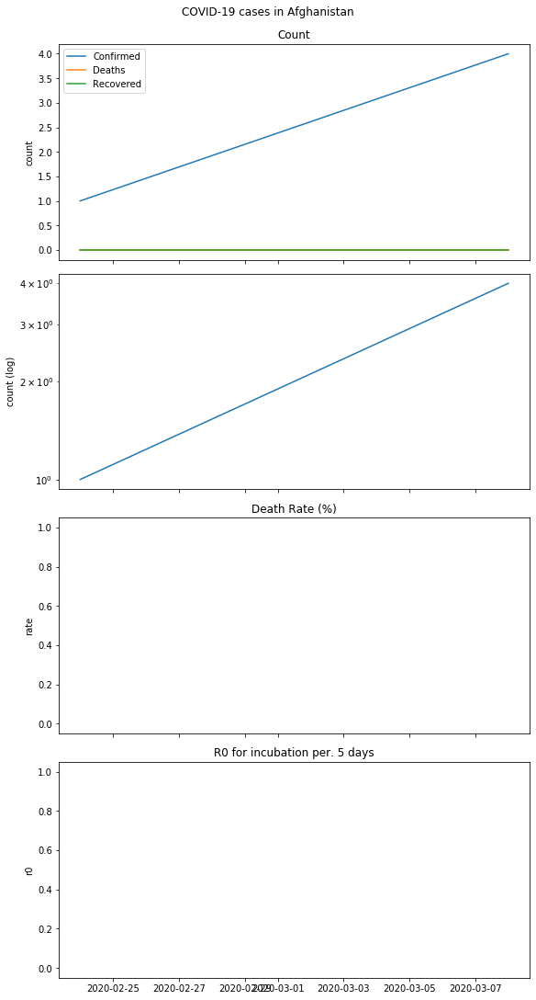

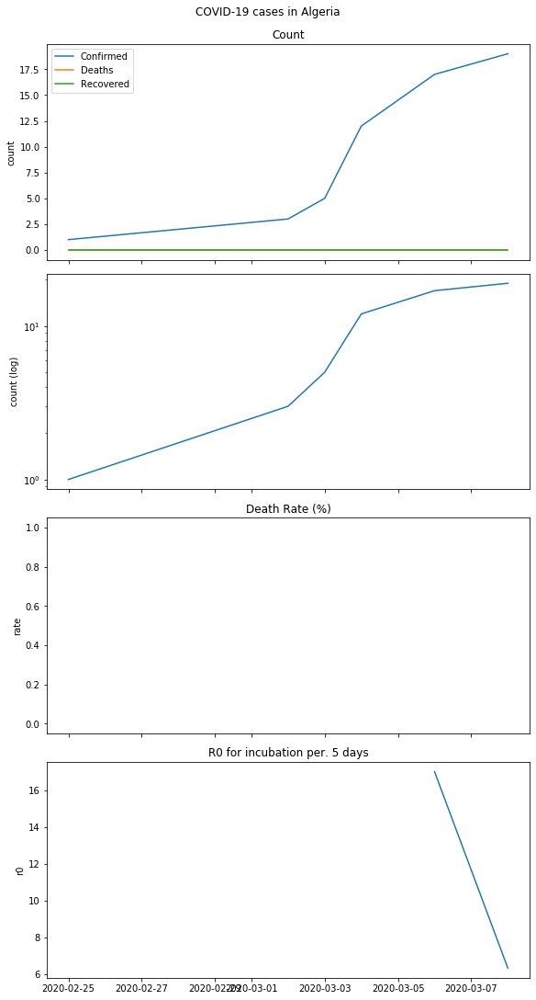

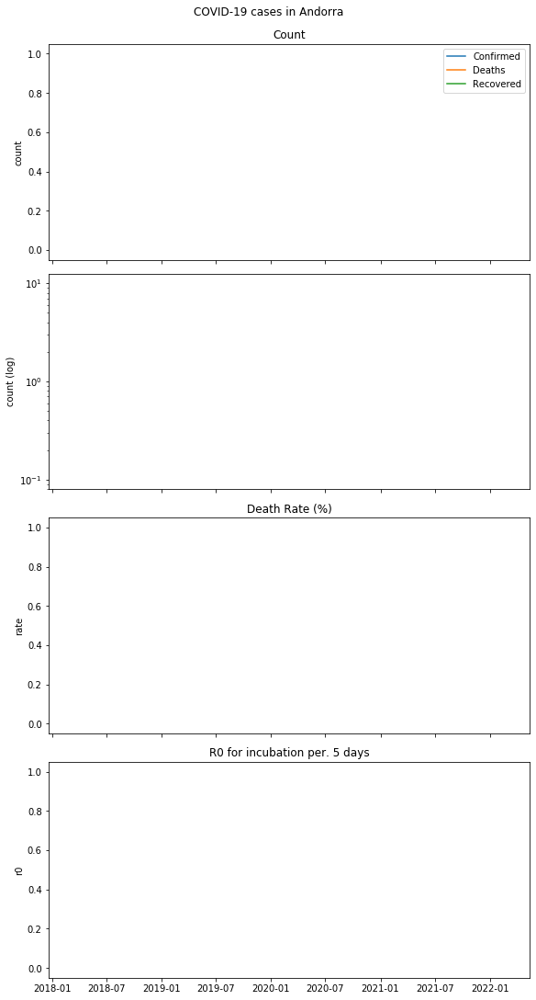

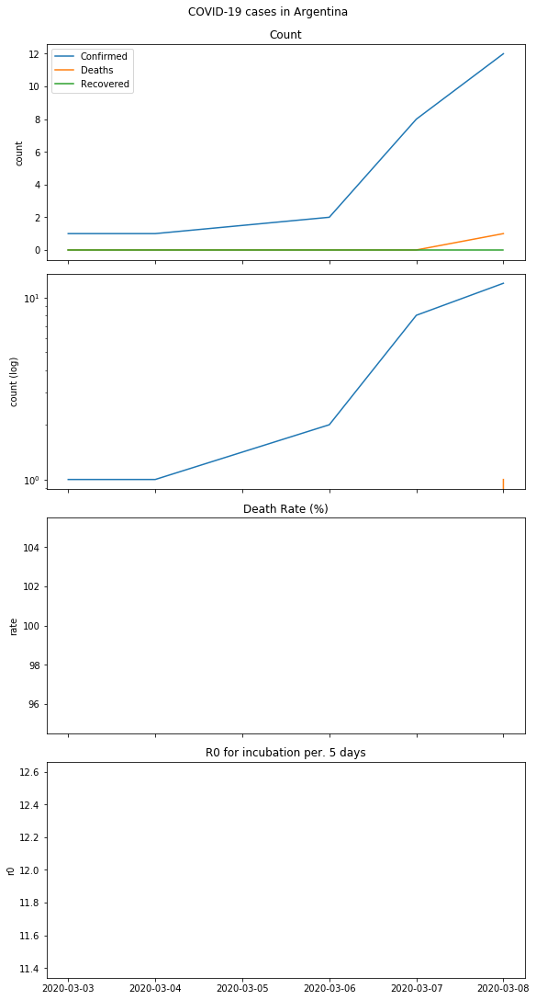

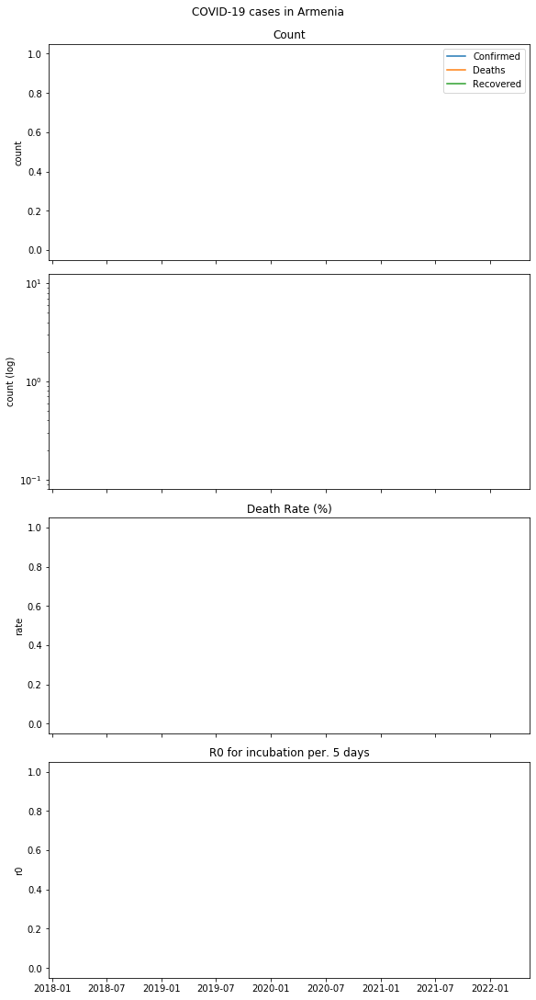

...

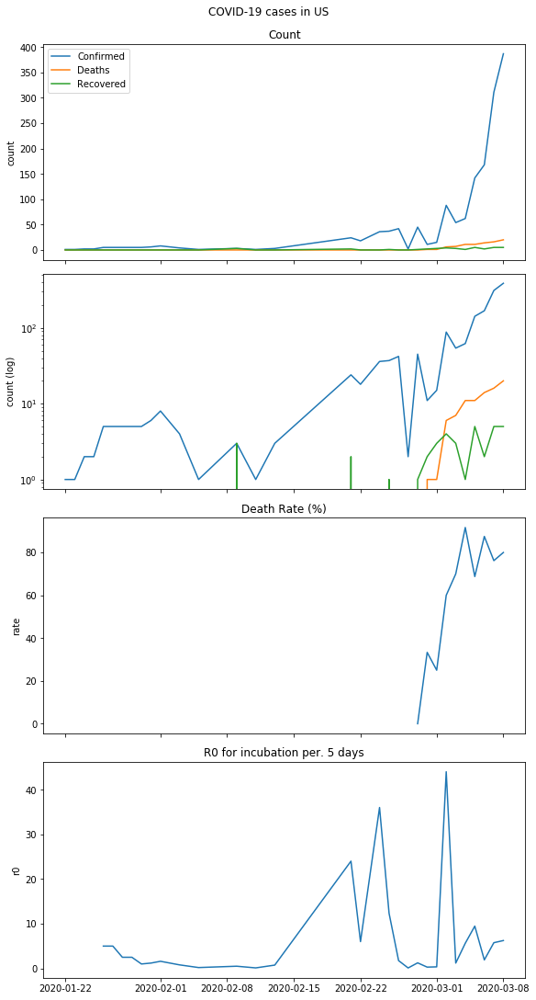

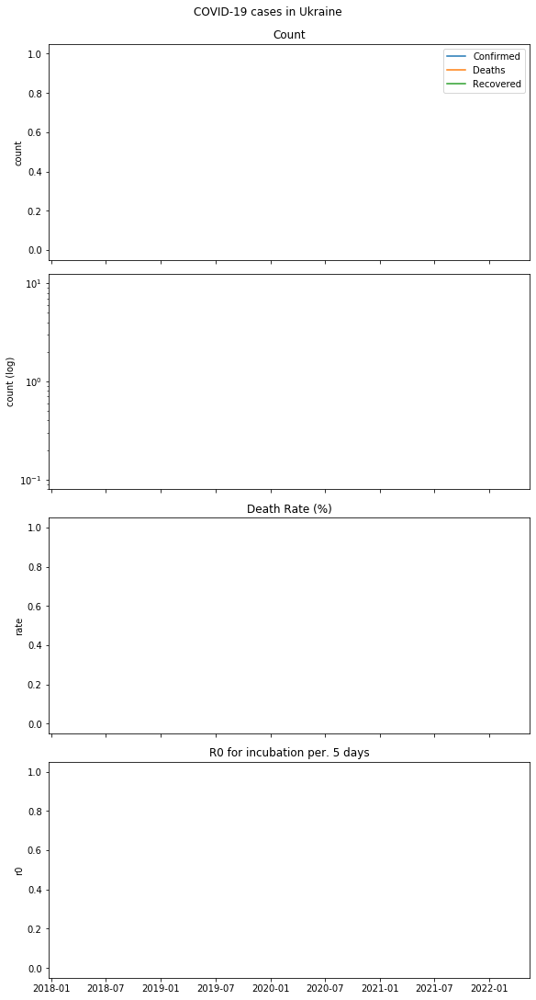

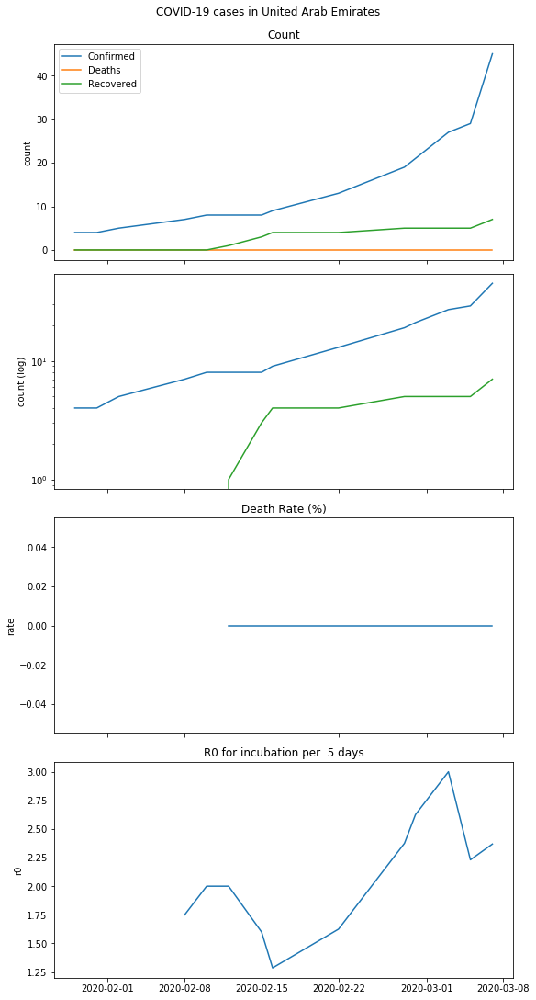

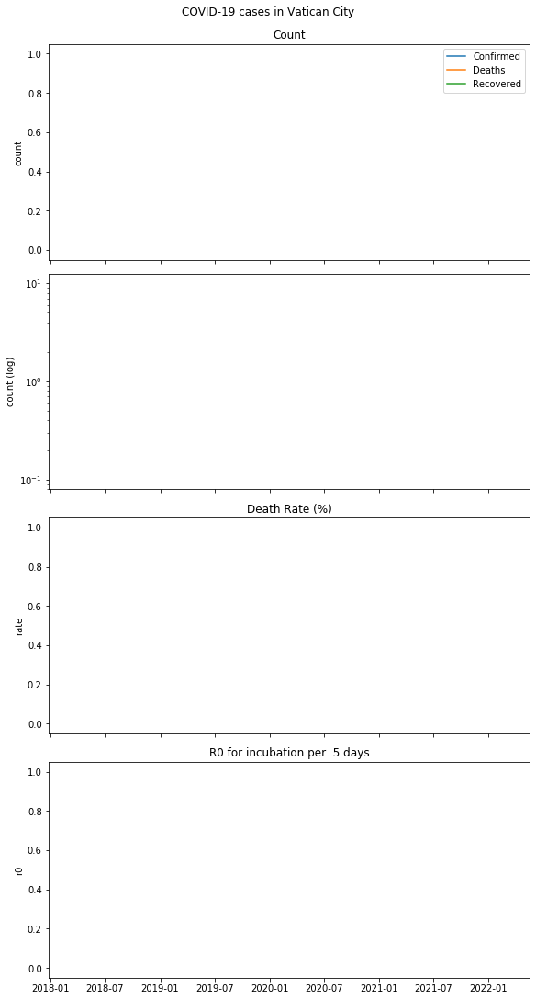

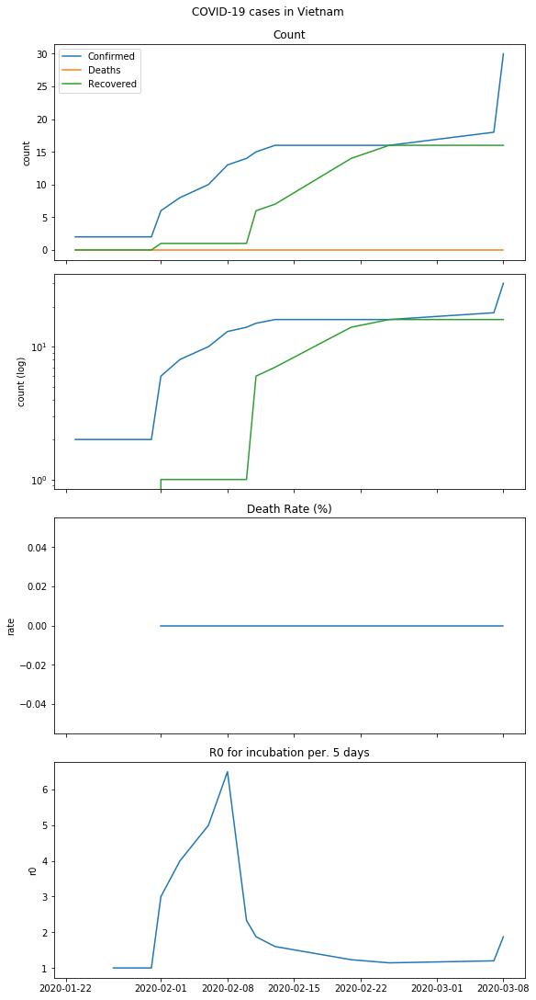

In [8]:
for country, data in by_country.items():       
    anchor = country.lower().replace(' ', '_')
    display(HTML(f'<h2><a name="{anchor}" href="#{anchor}">{country}</a></h2>'))    
    co_data = data['data']
    r0 = data['r0']

    fig, axs = plt.subplots(4, 1, figsize=(8,15), constrained_layout=True, sharex=True)
    fig.suptitle(f'COVID-19 cases in {country}')

    axs[0].set_title('Count')
    axs[0].plot(co_data['Last Update'], co_data['Confirmed'], label='Confirmed')
    axs[0].plot(co_data['Last Update'], co_data['Deaths'], label='Deaths')
    axs[0].plot(co_data['Last Update'], co_data['Recovered'], label='Recovered')
    axs[0].legend()
    axs[0].set_ylabel('count')

    axs[1].set_yscale('log')
    axs[1].plot(co_data['Last Update'], co_data['Confirmed'], label='Confirmed')
    axs[1].plot(co_data['Last Update'], co_data['Deaths'], label='Deaths')
    axs[1].plot(co_data['Last Update'], co_data['Recovered'], label='Recovered')
    axs[1].set_ylabel('count (log)')

    axs[2].set_title('Death Rate (%)')
    axs[2].plot(co_data['Last Update'], co_data['Death Rate (%)'])
    axs[2].set_ylabel('rate')

    axs[3].set_title(f'R0 for incubation per. {INCUBATION_PERIOD} days')
    axs[3].plot(co_data['Last Update'], r0['r0'])
    axs[3].set_ylabel('r0')

    display(HTML(f'<p>Plot of COVID-19 cases.</p>'))
    display(HTML(f'<p>Death rate calculated as (count of death)/(count of death + count of recovered)</p>'))    
    display(fig)
    
    display(HTML(f'<p>Data extracted from <a href="https://github.com/CSSEGISandData/COVID-19">Johns Hopkins CSSE Data Repository</a></p>'))    
    display(data['data'])
    
    display(HTML(f'<p>r0 calculated as (Confirmed cases at day N + incubation period = {INCUBATION_PERIOD} days)/(confirmed cases at day N)</p>'))
    display(HTML(f'<p>Note that this is just a very rough value determined by "garage epidemiology" and should not be used as reference</p>'))
    display(data['r0'])